In [53]:
from datetime import datetime, timedelta
from mplsoccer import VerticalPitch, Pitch
from matplotlib import animation
import matplotlib.pyplot as plt
from pathlib import Path
import imageio.v2 as iio
from tqdm import tqdm
import pandas as pd
import matplotlib
import zipfile
import shutil
import time
import json
import enum
from pathlib import Path
from pathlib import Path
import zipfile
import numpy as np
# set pandas option to show columns of a dataframe
pd.set_option('display.max_columns', None)
import os
import sys
# Add the parent directory to sys.path to access the 'models' package
sys.path.append('..')

from models.setup_skillcorner import get_skillcorner_database, get_skillcorner_dataframes


In [54]:
def wyscout_json_to_df(file_name):
    # Create a directory to extract files to (same as zip file name without extension)
    extract_dir = file_name.split(".")[0]
    os.makedirs(extract_dir, exist_ok=True)  # Create the directory if it doesn't exist

    # Unzip the file
    with zipfile.ZipFile(file_name, 'r') as zip_ref:
        zip_ref.extractall(extract_dir)
    
    # Construct the full path to the json file
    json_name = os.path.join(extract_dir, os.path.basename(extract_dir) + ".json")

    # Read the json file
    with open(json_name, encoding='utf8') as f:
        js = json.load(f)
        df = pd.json_normalize(js['events'])
    return df

In [55]:

def get_goalie_passes(org_df):
    """
    Function to get the passes from the goalie
    """

    passes_goalie_df = org_df[(org_df["player.position"] == "GK") & (org_df["team.name"] == "Denmark")]
    passes_goalie_df = passes_goalie_df[(passes_goalie_df["type.primary"] == "pass") | (passes_goalie_df["type.primary"] == "goal_kick")]
    #visualize all the passes from the goalie
    pitch = Pitch(pitch_type='wyscout', goal_type='box', pitch_color='#53ac5c',
                                line_color='white', linewidth=3, corner_arcs=True)
    fig, ax = pitch.draw(figsize=(10, 11))

    count_passes_left = 0
    total_passes = 0

    for row in passes_goalie_df.iterrows():
        row = row[1]
        player_name = row["player.name"]
        rec_name = row["pass.recipient.name"]
        x_loc = row["location.x"]
        y_loc = row["location.y"]
        x_end_loc = row["pass.endLocation.x"]
        y_end_loc = row["pass.endLocation.y"]
        if y_end_loc > org_df["location.y"].max() //2:
            count_passes_left += 1
        total_passes += 1
        
        
        pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='red', lw=2), ax=ax, zorder=2)

    plt.show()
    return count_passes_left, total_passes

In [56]:
def visualize_goal_sequence(org_df):
    # Find the goal events
    mask = org_df["shot.isGoal"] == True
    end_point_goals = org_df[mask].index

    for point in end_point_goals:
        end_point = point
        goal_df = org_df.iloc[:end_point+1]
        # Team that scored the goal
        team_scored = org_df.iloc[end_point]["possession.team.name"]


        # Select from the end where the goal_df["possession.team.name"] is not anymore team_scored
        start_point_mask = goal_df["possession.team.name"] != team_scored
        start_point = goal_df[start_point_mask].index[-1]





        goal_df = org_df.iloc[start_point+1:end_point+1]

        #filter goal_df_additionally if it would start with a duel

        if goal_df.iloc[0]["type.primary"] == "duel":
            goal_df = goal_df.iloc[1:]
        
        # TODO: Needs better start point as there is a normalizing error present see: the columns possesion.endlocation etc. shift if i dont use +1

        # Visualize the passing network that lead to the goal from the wyscout data
        pitch = Pitch(pitch_type='wyscout', goal_type='box', pitch_color='#53ac5c',
                      line_color='white', linewidth=3, corner_arcs=True)
        fig, ax = pitch.draw(figsize=(10, 11))

        index_naive = 0

        # Filter either shot or passes
        for row in goal_df.iterrows():
            row = row[1]

            if (row["type.primary"] == "pass") | (row["type.primary"] == "shot"):
                player_name = row["player.name"]
                rec_name = row["pass.recipient.name"]
                x_loc = row["location.x"]
                y_loc = row["location.y"]
                x_end_loc = row["pass.endLocation.x"]
                y_end_loc = row["pass.endLocation.y"]
                pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='red', lw=2), ax=ax, zorder=2)
                pitch.annotate(player_name, xy=(x_loc, y_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)
                pitch.annotate(rec_name, xy=(x_end_loc, y_end_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)

            elif (row["type.primary"] == "touch"):
                x_loc = x_end_loc
                y_loc = y_end_loc
                next_row = goal_df.iloc[index_naive+1]
                x_end_loc = next_row["location.x"]
                y_end_loc = next_row["location.y"]
                pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='blue', lw=2), ax=ax, zorder=2)
                pitch.annotate(rec_name, xy=(x_loc, y_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)

            elif row["type.primary"] == "duel":
                #make and exception for duels
                try: 
                    next_row = goal_df.iloc[index_naive+2]
                except:
                    try:
                        next_row = goal_df.iloc[index_naive+1]
                    except:
                        next_row = row
                    
                x_loc = x_end_loc
                y_loc = y_end_loc
                x_end_loc = next_row["location.x"]
                y_end_loc = next_row["location.y"]
                pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='yellow', lw=2), ax=ax, zorder=2)

            elif row["type.primary"] == "shot":
                player_name = row["player.name"]
                x_loc = row["location.x"]
                y_loc = row["location.y"]
                pitch.scatter(x_loc, y_loc, ax=ax, color='black', zorder=2, s=100)
                pitch.annotate(player_name, xy=(x_loc, y_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)

            index_naive += 1

            #show the figure
        # show the 
        plt.show()
        

In [57]:
def filter_dataframe(team_name, df, halftime=None, pass_recived = True):
    #turnof nump warning 

    
    # Filter the dataframe to only include events from the specified team
    df = df[df['team.name'] == team_name]
    df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
    if halftime != 1 or halftime != 2:
        halftime =1

    pass_mask = (df['type.primary'] == 'pass') & (df['matchPeriod'] == halftime ) & (df['pass.accurate'] == pass_recived)
    df = df.loc[pass_mask, ['location.x', 'location.y', 'pass.endLocation.x', 'pass.endLocation.y', "player.name", "pass.recipient.name"]]
    df["player.name"] = df["player.name"].apply(lambda x: x.split(" ")[-1] if x != None else None)
    df["pass.recipient.name"] = df["pass.recipient.name"].apply(lambda x: x.split(" ")[-1] if x != None else None)

    #dropna entries in the dataframe when they are in player name or pass recipent name
    df = df.dropna(subset=["player.name", "pass.recipient.name"])
    df = df.reset_index(drop=True)
    
    return df




In [58]:
def merge_wyscout_dfs(match_id_list, wyscout_path):
    for i, match_id in enumerate(match_id_list):
        df = wyscout_json_to_df(file_name=os.path.join(wyscout_path, f'{match_id}.zip'))
        if i == 0:
            df_all = df
        else:
            df_all = pd.concat([df_all, df], ignore_index=True)
    return df_all
    




In [59]:
def passes_visualization_halftime(england_match, wyscout_path, haltime, current_directory, team):
    plot_data = list()
    sucessfull_passes_df = list()
    wrong_passes_df = list()
    total_passes = 0
    left_passes = 0

    for index, match in england_match.iterrows():
        scatter_df = pd.DataFrame()
        match_df = wyscout_json_to_df(file_name=os.path.join(wyscout_path, f'{match["wyscout"]}.zip'))
        org_df = match_df.copy()

        #visualize the goal sequence
        visualize_goal_sequence(org_df)

        #get the passes from the goalie
        l_pass, t_pass = get_goalie_passes(org_df)

        
        total_passes += t_pass
        left_passes += l_pass
        print(f"Total passes: {total_passes}, Left passes: {left_passes}, Right passes: {total_passes - left_passes}")
        #get a copy of match_df called_wrongpasses_df
        wrongpasses_df = match_df.copy()

        wrongpasses_df = filter_dataframe(team, wrongpasses_df, haltime, pass_recived=False)
        match_df = filter_dataframe(team, match_df, haltime)

        for i, name in enumerate(match_df['player.name'].unique()):
            player_df = match_df[match_df['player.name'] == name]


            passx = match_df.loc[match_df["player.name"] == name]["location.x"].to_numpy()
            recx = match_df.loc[match_df["pass.recipient.name"] == name]["pass.endLocation.x"].to_numpy()
            passy = match_df.loc[match_df["player.name"] == name]["location.y"].to_numpy()
            recy = match_df.loc[match_df["pass.recipient.name"] == name]["pass.endLocation.y"].to_numpy()
            
            scatter_df.at[i, "player.name"] = name
            #make sure that x and y location for each circle representing the player is the average of passes and receptions
            scatter_df.at[i, "location.x"] = np.mean(np.concatenate([passx, recx]))
            scatter_df.at[i, "location.y"] = np.mean(np.concatenate([passy, recy]))
            #calculate number of passes
            scatter_df.at[i, "no"] = match_df.loc[match_df["player.name"] == name].count().iloc[0]
        
        scatter_df['marker_size'] = (scatter_df['no'] / scatter_df['no'].max() * 1000)
        match_df["pair_key"] = match_df.apply(lambda x: "_".join(sorted([x["player.name"], x["pass.recipient.name"]])), axis=1)
        lines_df = match_df.groupby(["pair_key"])["location.x"].count().reset_index()
        lines_df.rename({'location.x':'pass_count'}, axis='columns', inplace=True)
        #setting a treshold. You can try to investigate how it changes when you change it.
        lines_df = lines_df[lines_df['pass_count']>2]


        plot_data.append({'lines_df': lines_df, 'scatter_df': scatter_df, 'match': match})
        sucessfull_passes_df.append(match_df)
        wrong_passes_df.append(wrongpasses_df)

    print("Total passes: ", total_passes)
    print("Left passes: ", left_passes)
    print("Right passes: ", total_passes - left_passes)





    for data in plot_data:

        pitch = Pitch(pitch_type='wyscout', goal_type='box', pitch_color='#53ac5c',
                            line_color='white', linewidth=3, corner_arcs=True)
        fig, ax = pitch.draw(figsize=(16, 11))
        lines = data['lines_df']
        scatter = data['scatter_df']
        match = data['match']

        ax.scatter(scatter['location.x'], scatter['location.y'], s=scatter['marker_size'], color='red', edgecolors='black', zorder=1)

        for i, row in lines.iterrows():

            #check if player 1 and player 2 played the match:
            if not scatter['player.name'].str.contains(row['pair_key'].split("_")[0]).any() or not scatter['player.name'].str.contains(row['pair_key'].split("_")[1]).any():
                continue

            player1, player2 = row['pair_key'].split("_")
            player1_y = scatter[scatter['player.name'] == player1]['location.y'].values[0]
            player2_y = scatter[scatter['player.name'] == player2]['location.y'].values[0]
            player2_x = scatter[scatter['player.name'] == player2]['location.x'].values[0]
            player1_x = scatter[scatter['player.name'] == player1]['location.x'].values[0]






            num_passes = row['pass_count']
            line_width = num_passes / lines['pass_count'].max() * 10
            pitch.lines(player1_x, player1_y, player2_x, player2_y, ax=ax, color='red', zorder=2, lw=line_width)
            for i, row in scatter.iterrows():
                pitch.annotate(row['player.name'], xy=(row['location.x'], row['location.y']), ax=ax, fontsize=12, ha='center', va='center', zorder=2)

        if haltime == 2:

            #invert the game title
            title = f'{match["away"]} vs {match["home"]}'
        else:
            title = f'{match["home"]} vs {match["away"]}'
        plt.title(f'{title} Halftime: {haltime}')

        #save the plot in reports folder within a folder which constists of the name of the teams 
        save_path = os.path.join(current_directory, 'reports',title)
        os.makedirs(save_path, exist_ok=True)

        plt.savefig(os.path.join(save_path, f"passing_network_halfitme_{haltime}.png"))


        plt.show()

        #barplot of number of passes per player
        fig, ax = plt.subplots()
        ax.barh(scatter['player.name'], scatter['no'])

        plt.title(title+ f" halftime: {haltime}")
        plt.ylabel('Player')
        plt.xlabel('Number of passes')
   

        plt.savefig(os.path.join(save_path, f"number_of_passes_per_player_halfitme_{haltime}.png"))
        plt.show()

        #barplot of wrong passes per player from wrongpasses_df
        wrongpasses_df = wrongpasses_df.groupby("player.name").count()
        fig, ax = plt.subplots()
        ax.barh(wrongpasses_df.index, wrongpasses_df["location.x"])

        plt.title(f'{title} halftime: {haltime} wrong passes')
        plt.ylabel('Player')
        plt.xlabel('Number of wrong passes')

        plt.savefig(os.path.join(save_path, f"number_of_wrong_passes_per_player_halfitme_{haltime}.png"))
        plt.show()
    return sucessfull_passes_df, wrong_passes_df, org_df
    



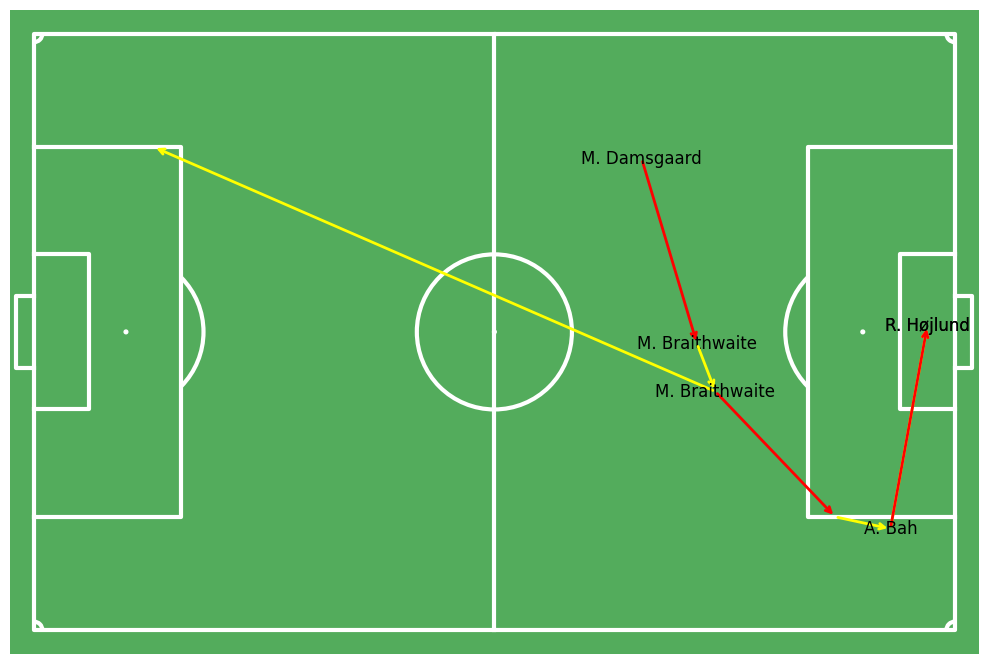

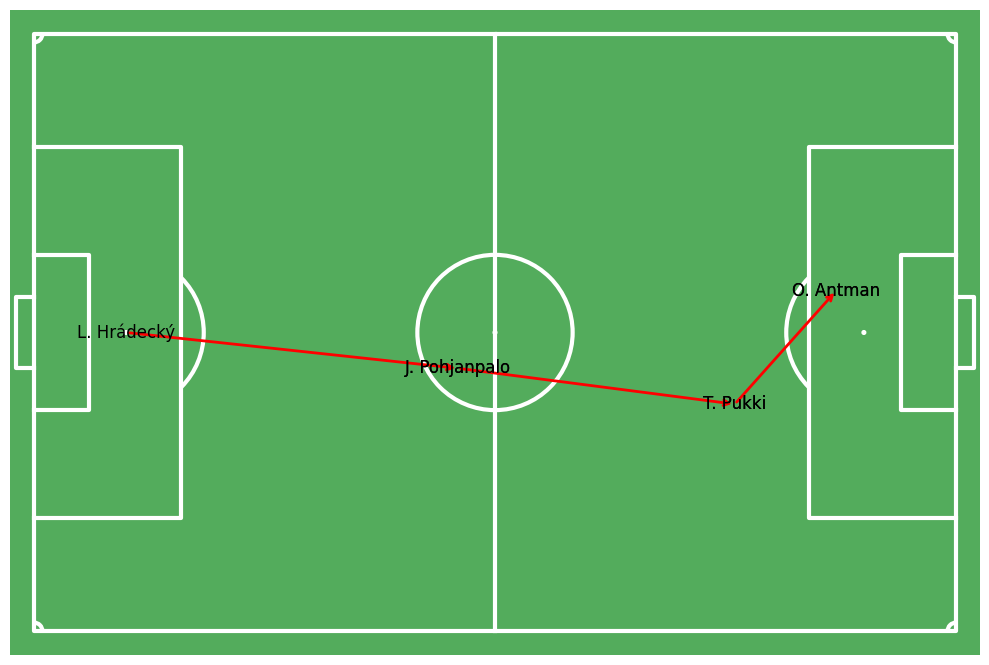

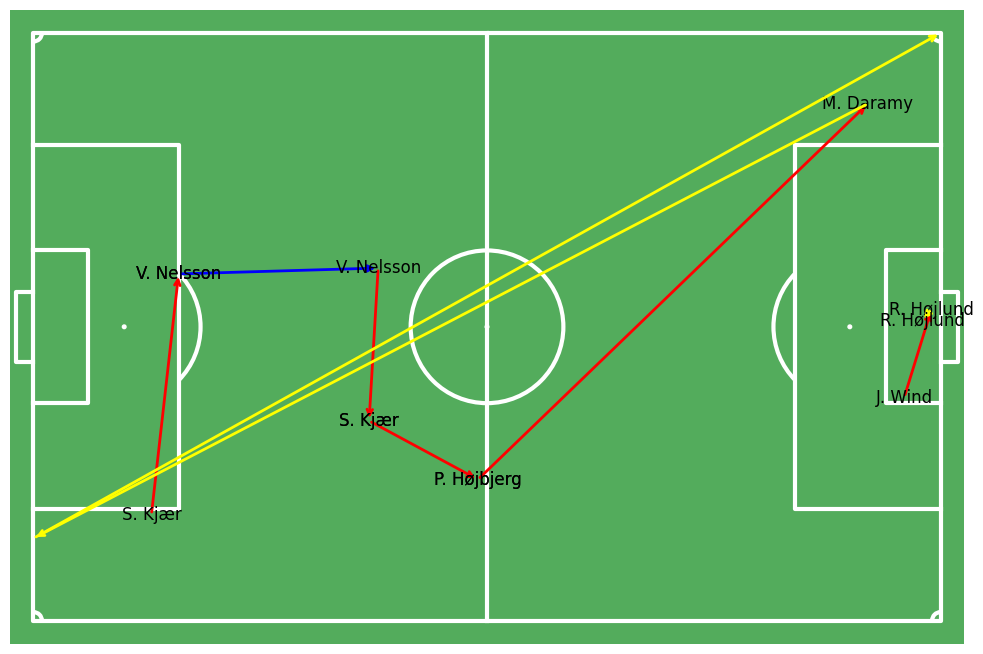

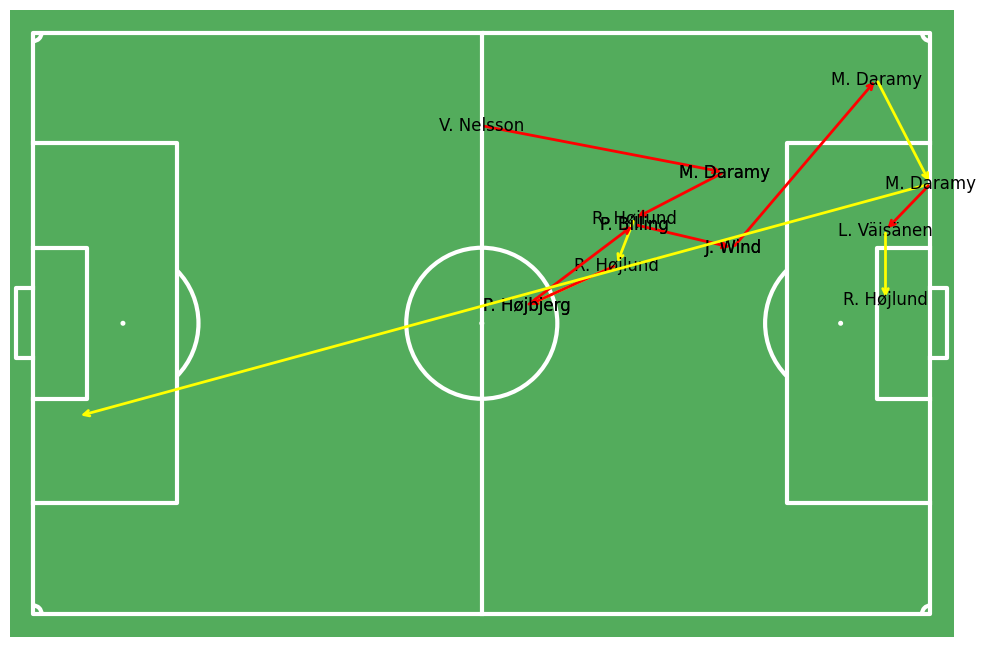

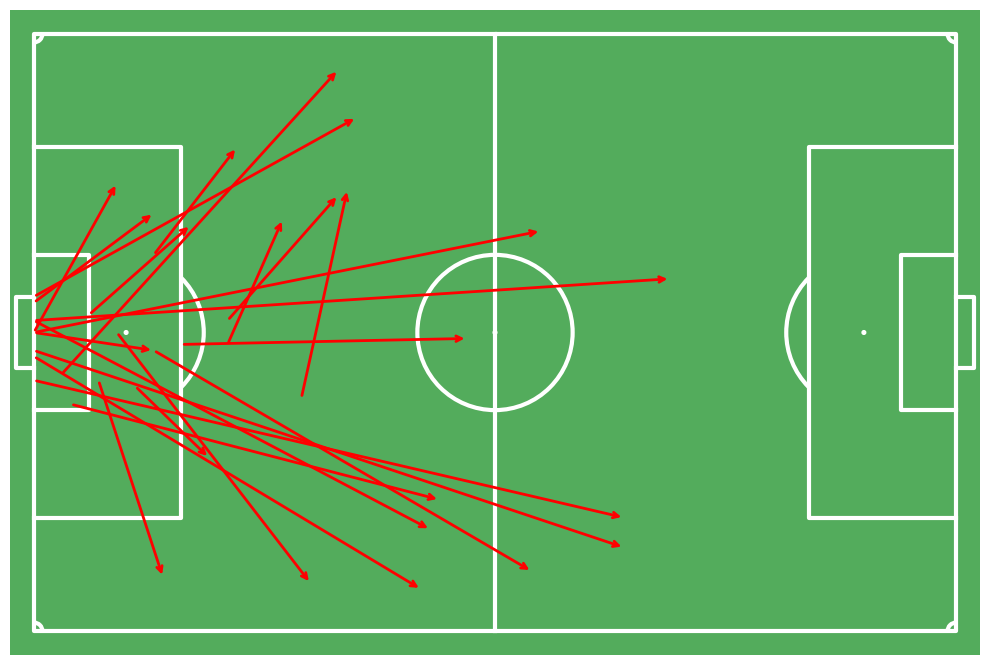

Total passes: 22, Left passes: 11, Right passes: 11


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


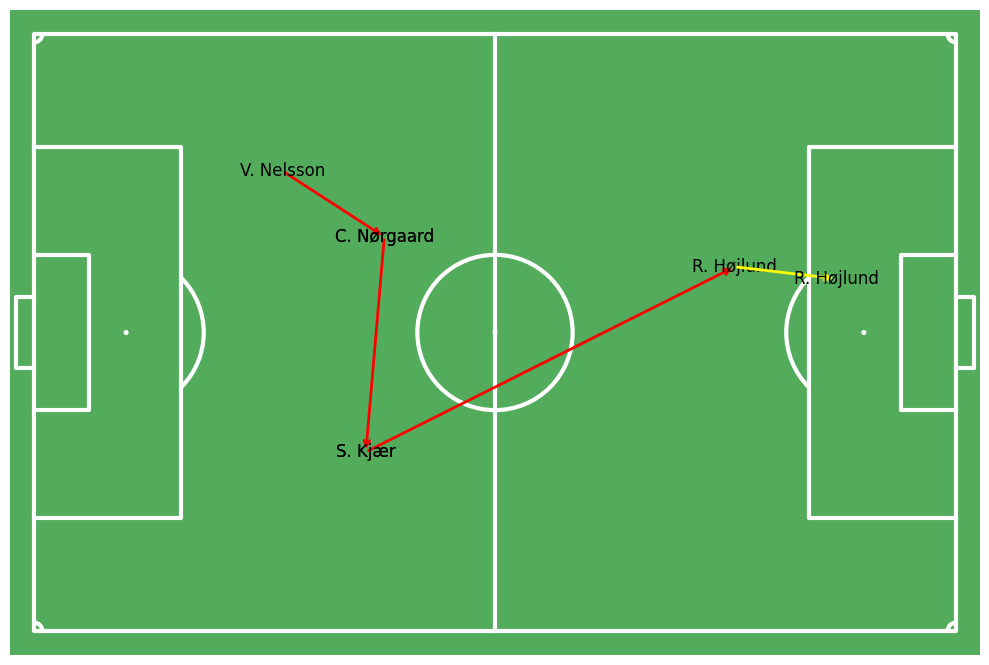

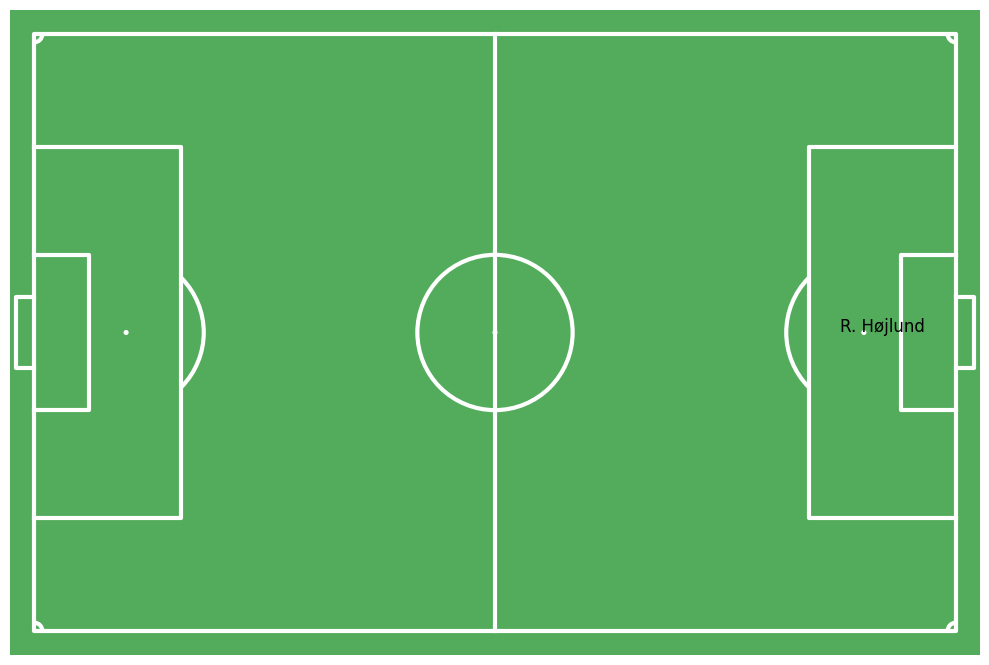

StopIteration: 

<Figure size 1000x1100 with 1 Axes>

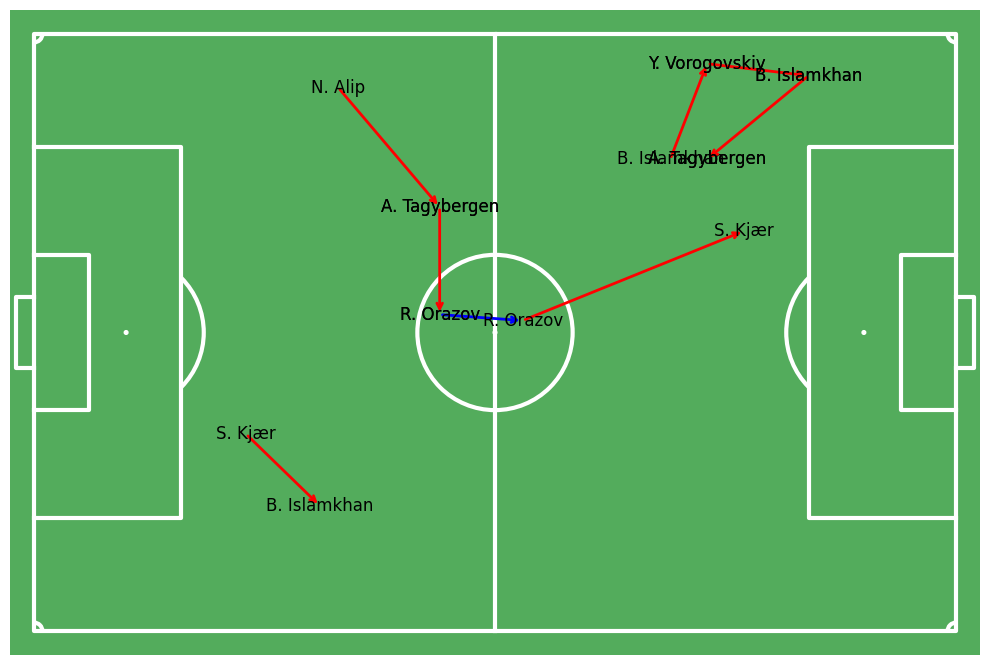

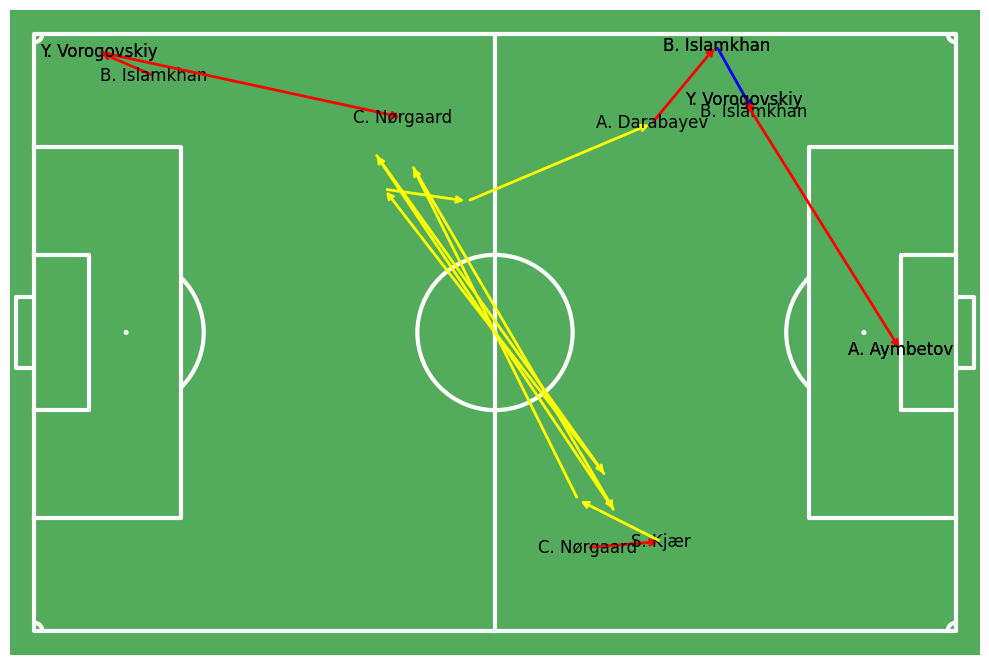

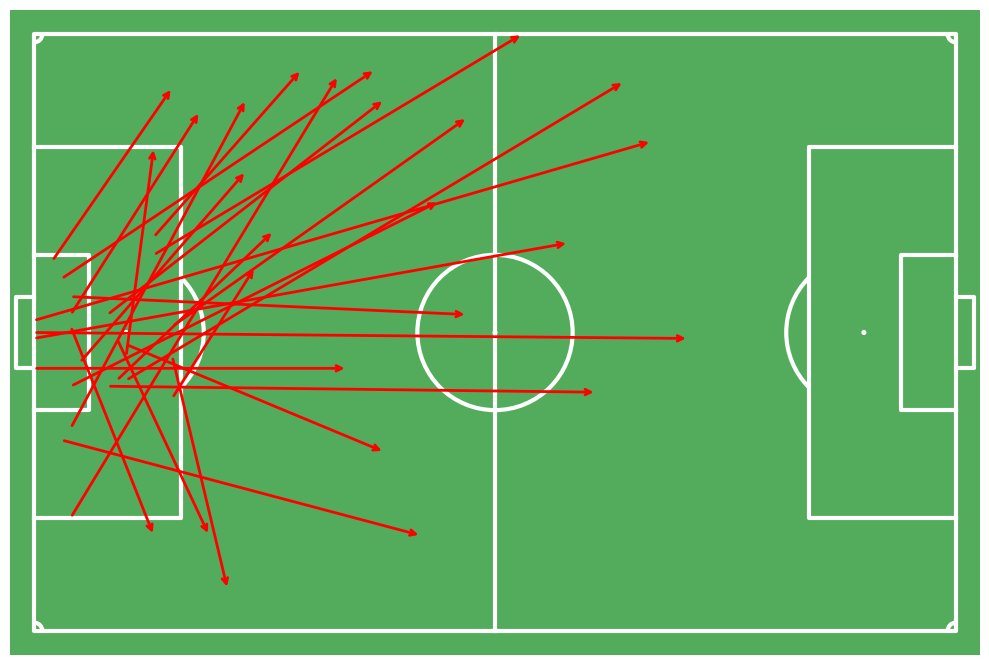

Total passes: 48, Left passes: 19, Right passes: 29


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


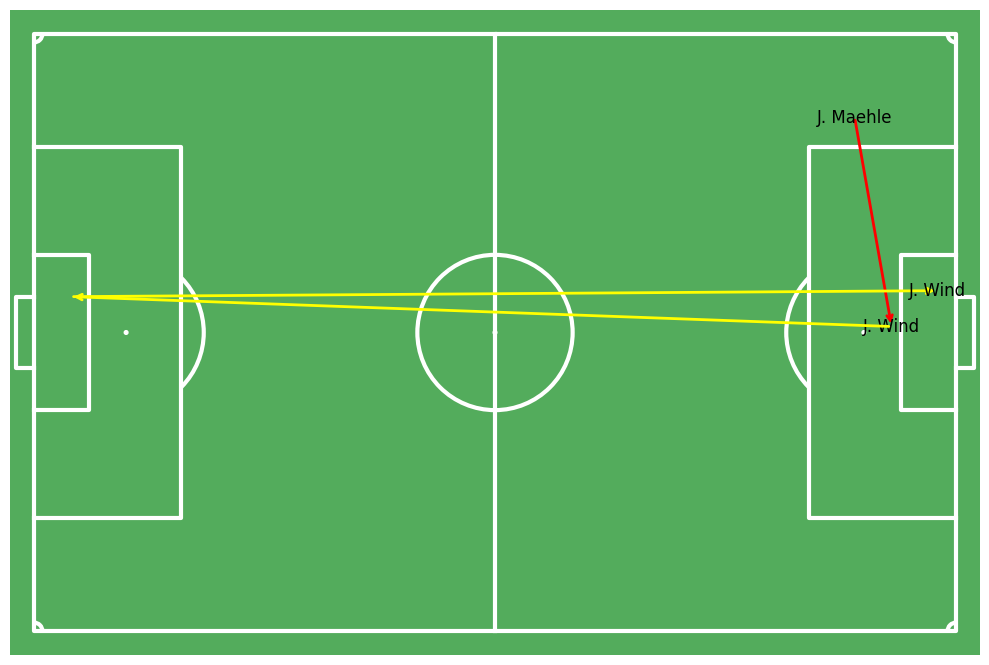

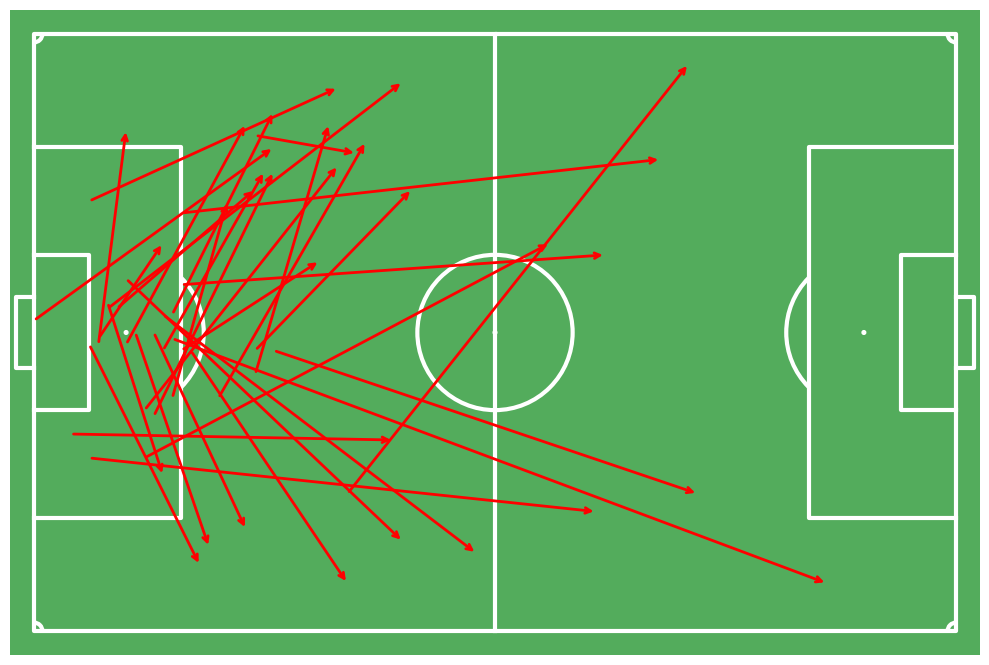

Total passes: 80, Left passes: 30, Right passes: 50


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


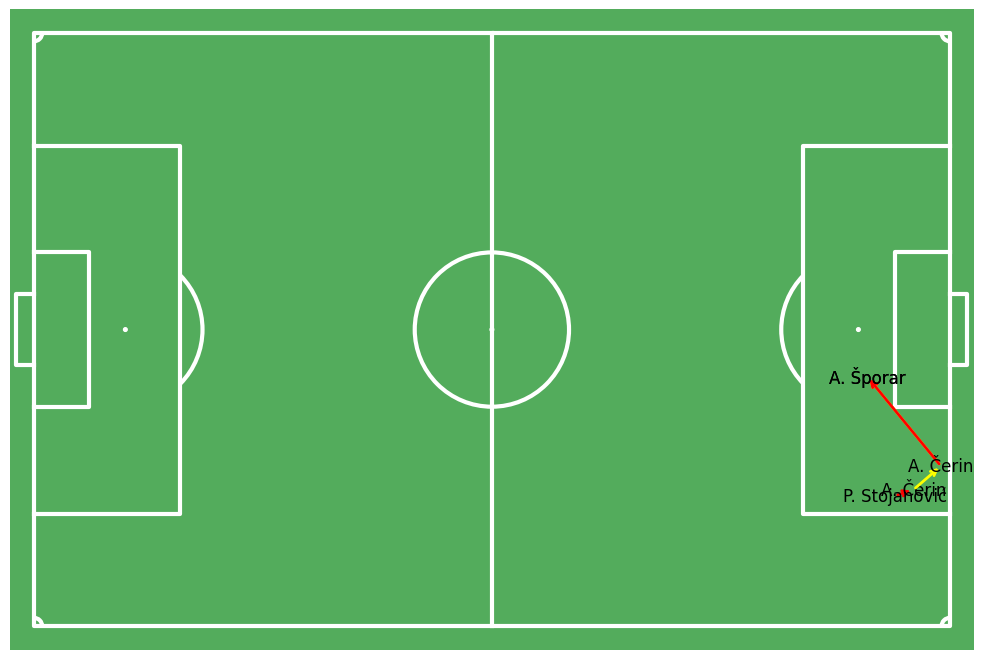

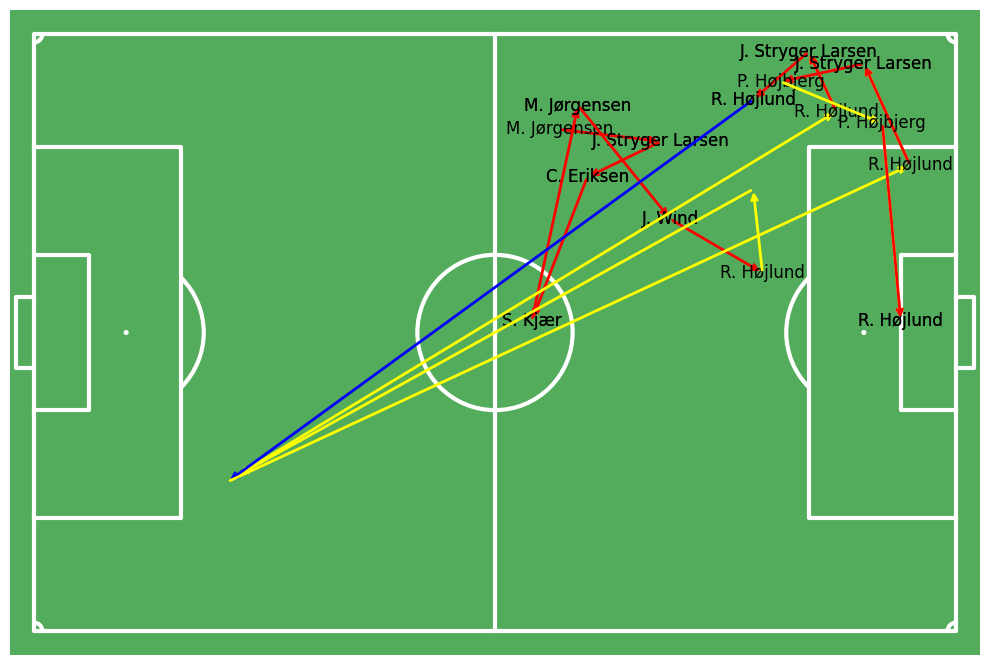

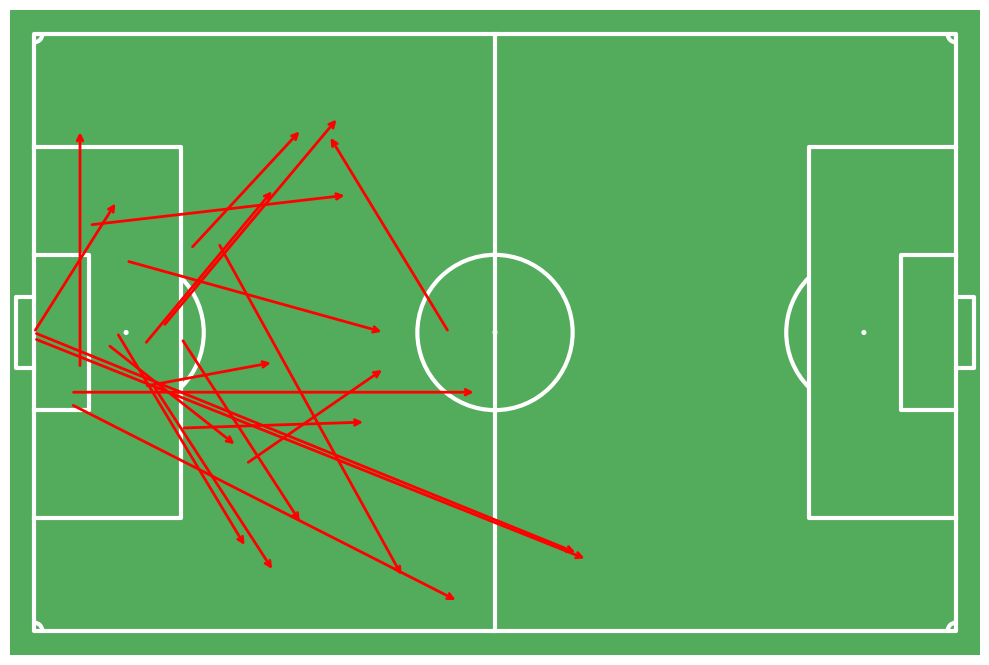

Total passes: 100, Left passes: 42, Right passes: 58


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


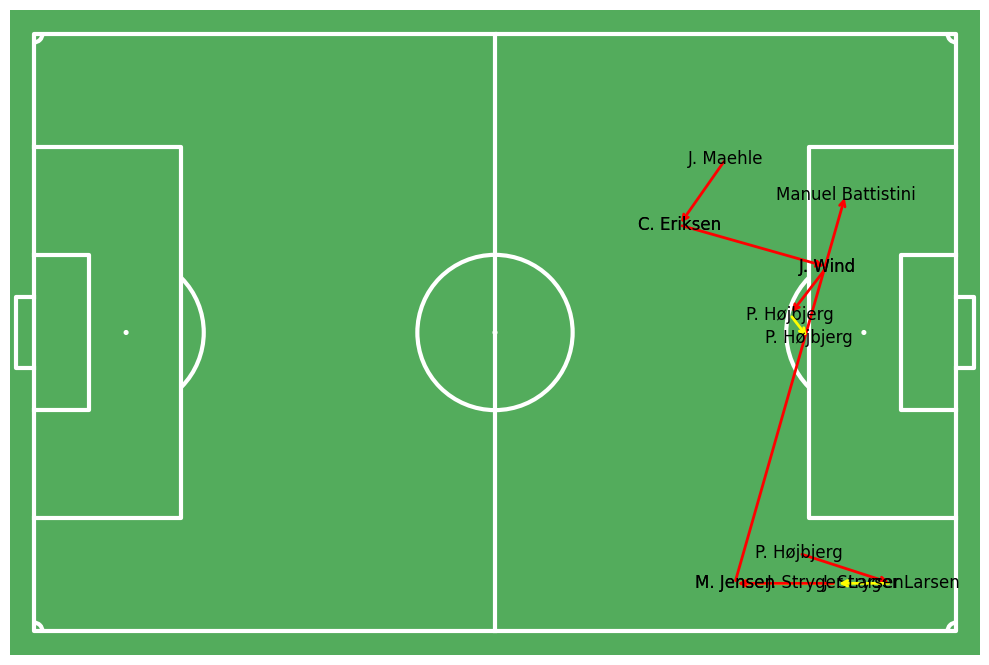

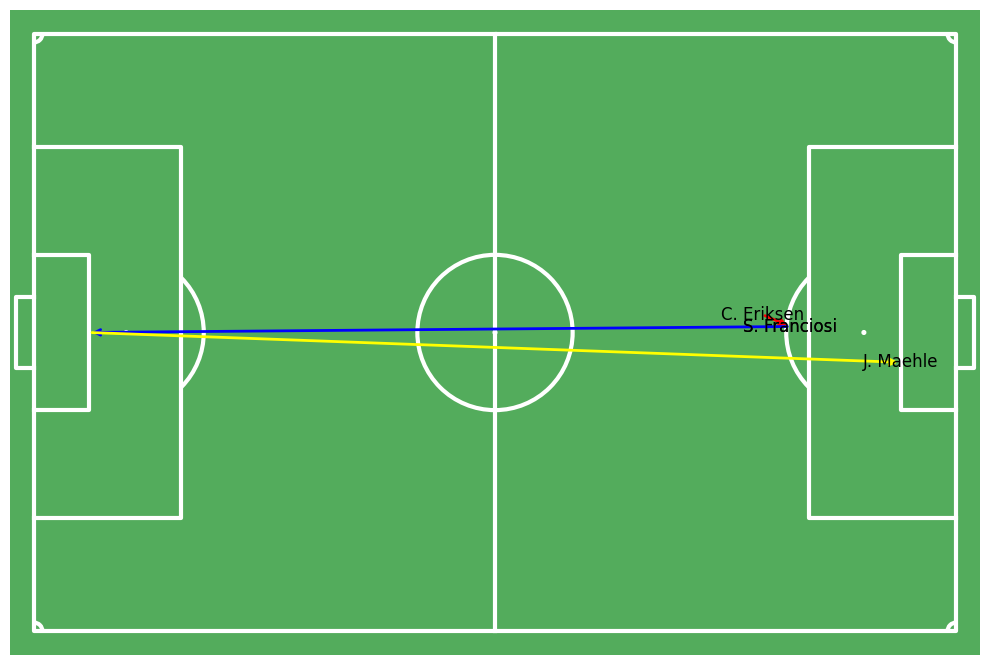

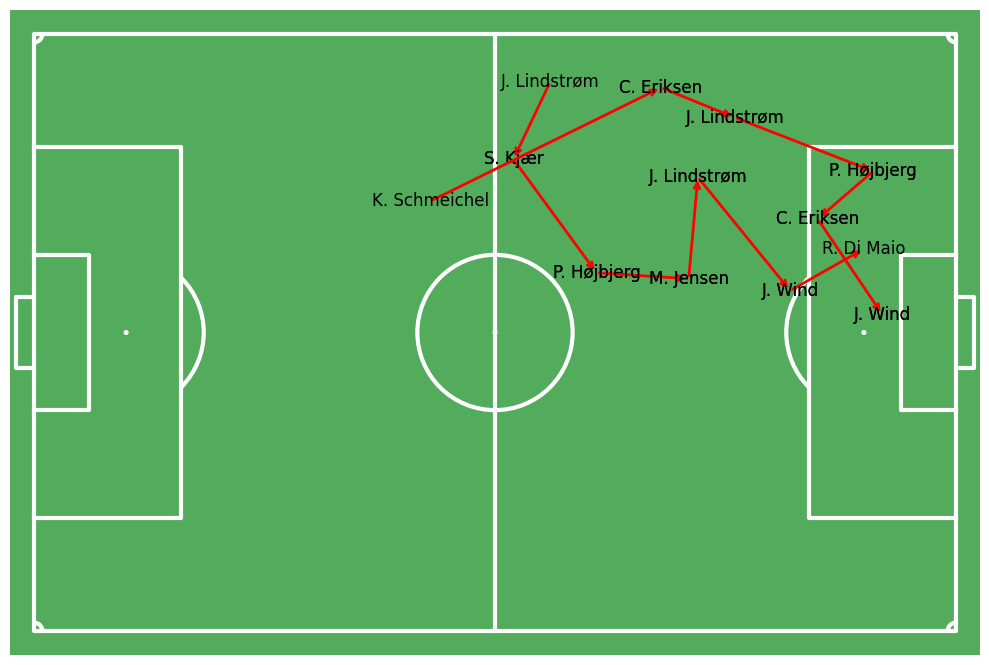

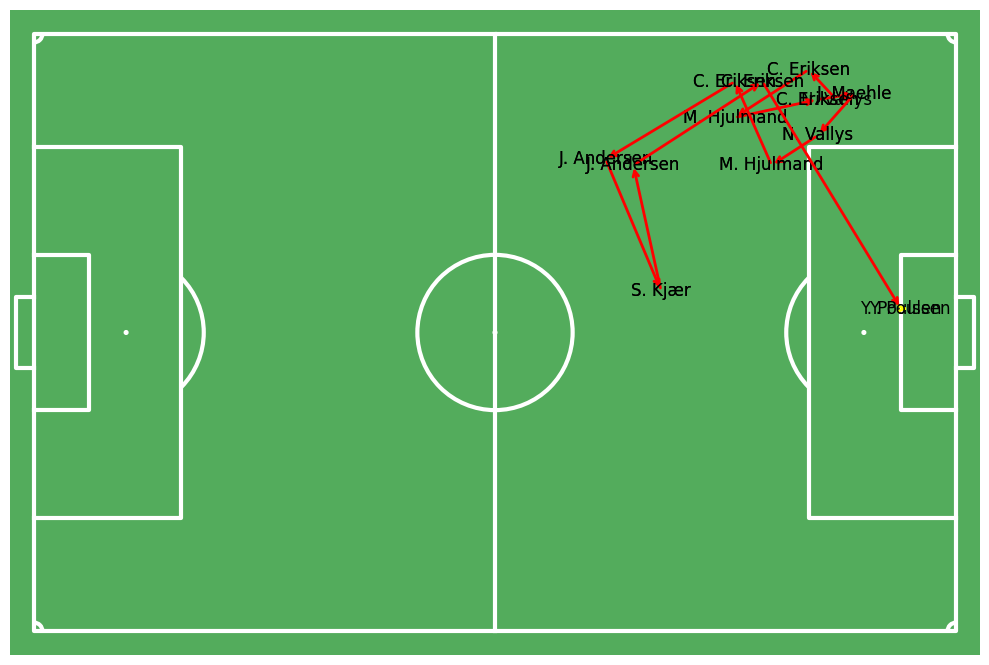

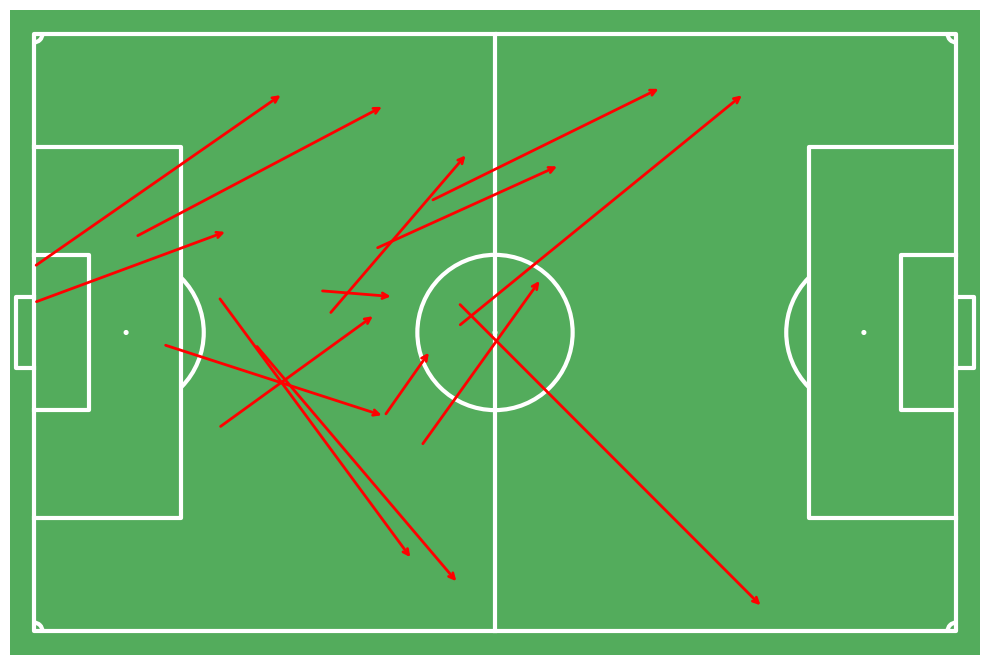

Total passes: 115, Left passes: 47, Right passes: 68


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


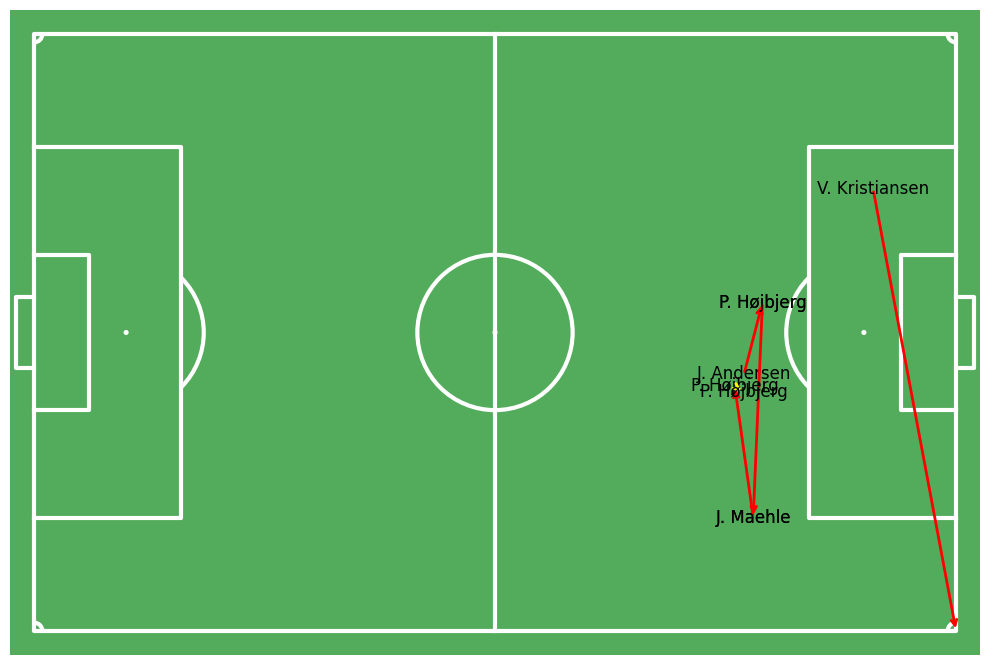

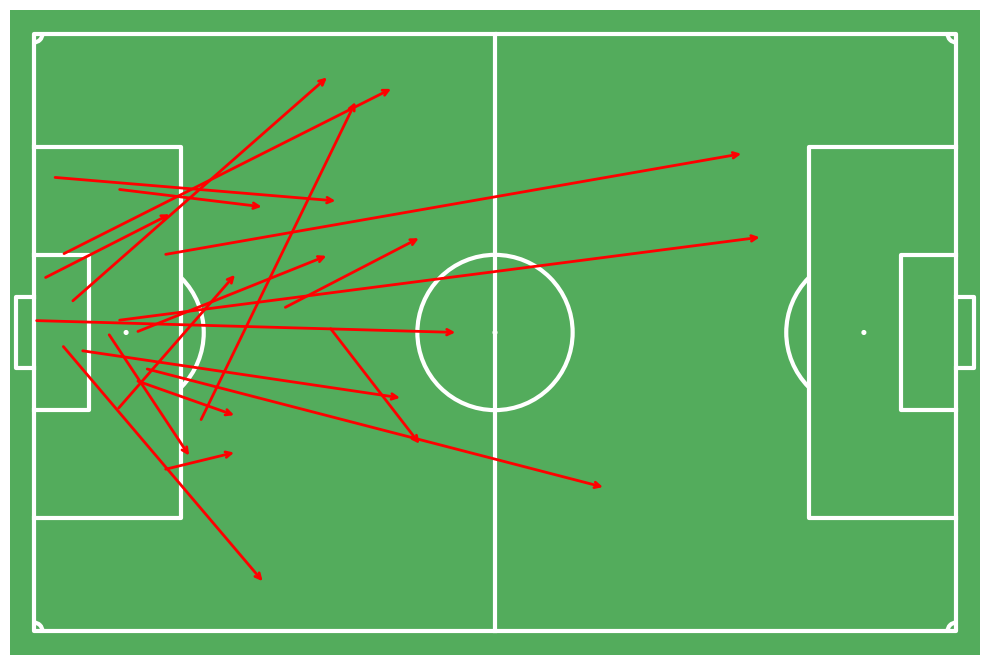

Total passes: 134, Left passes: 54, Right passes: 80


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


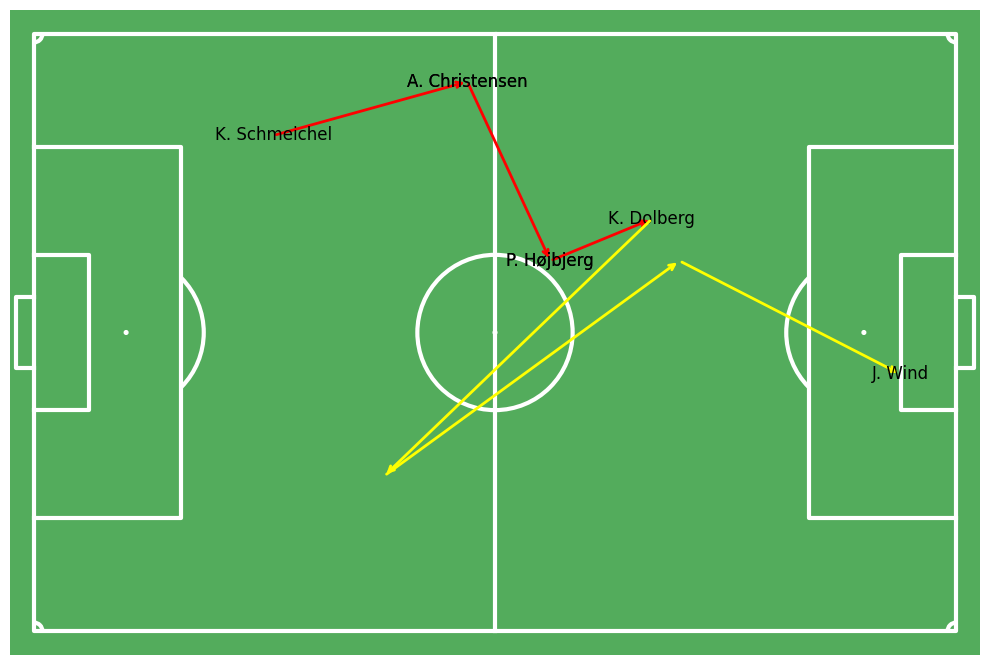

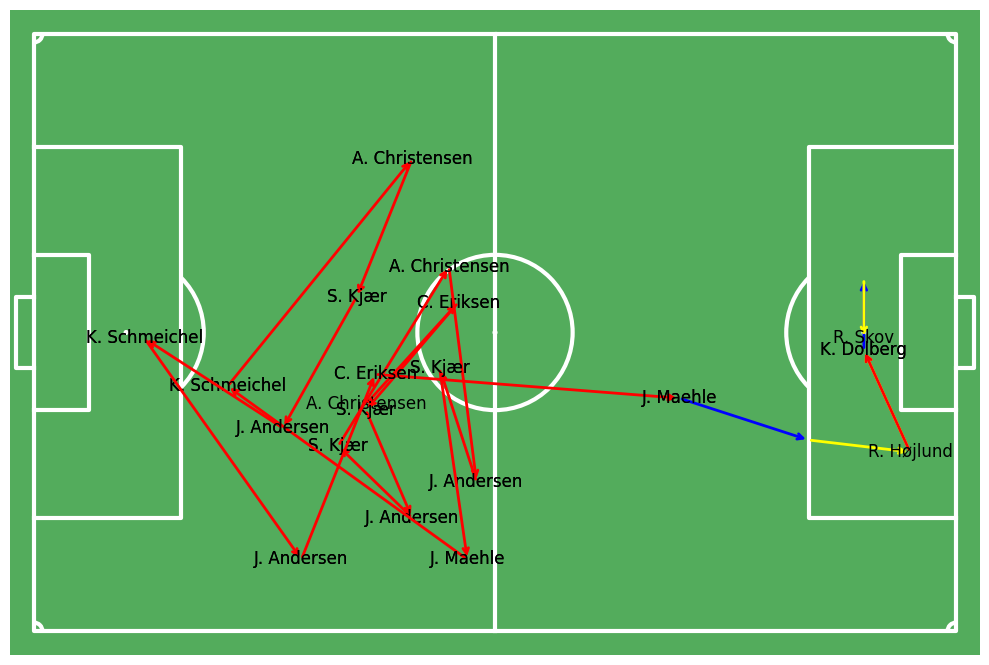

StopIteration: 

<Figure size 1000x1100 with 1 Axes>

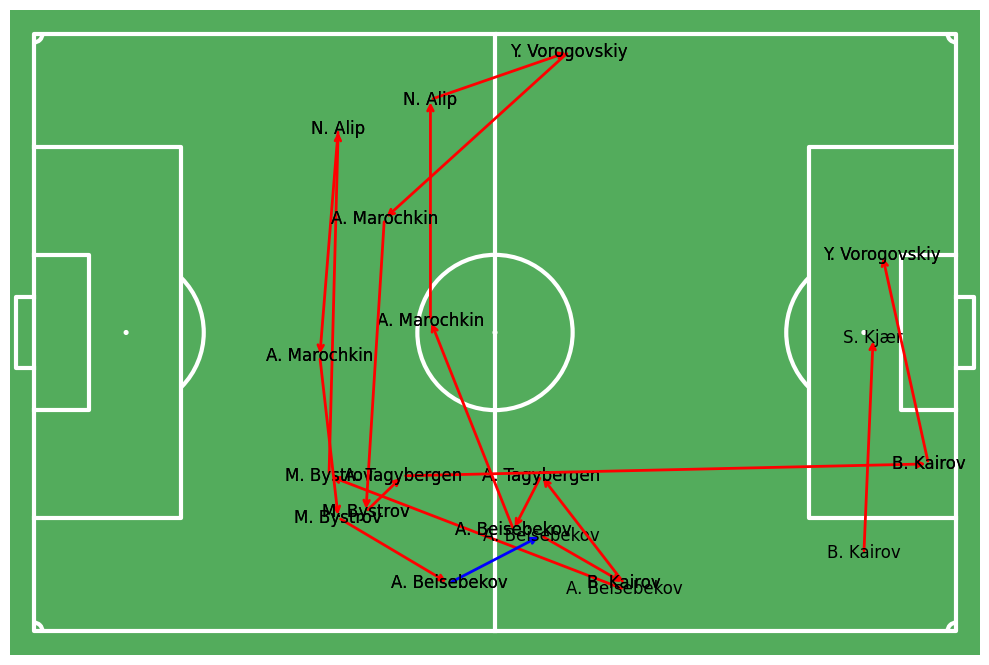

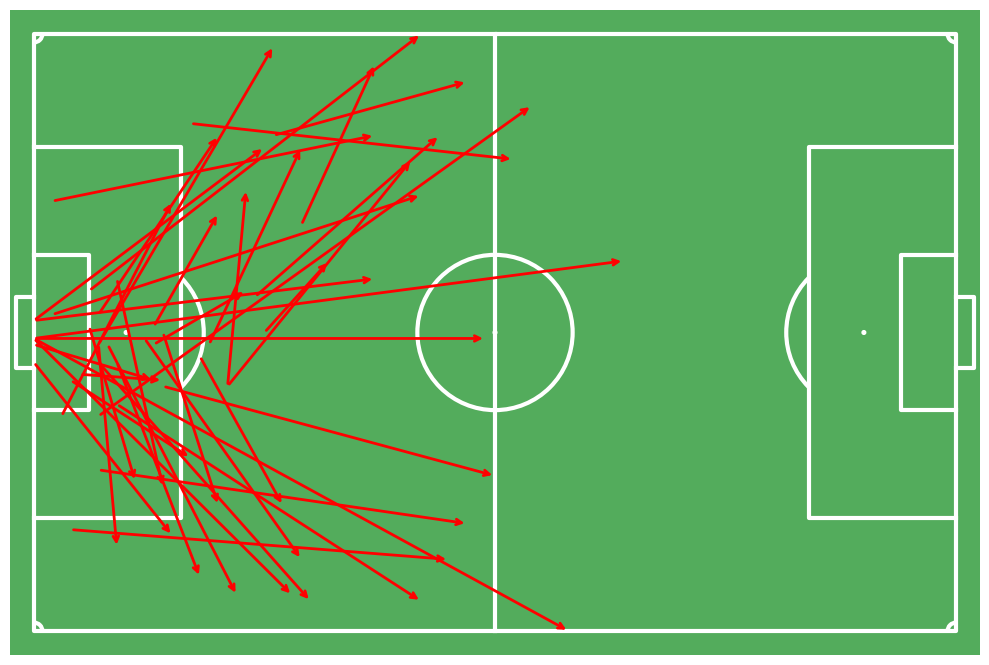

Total passes: 174, Left passes: 74, Right passes: 100


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


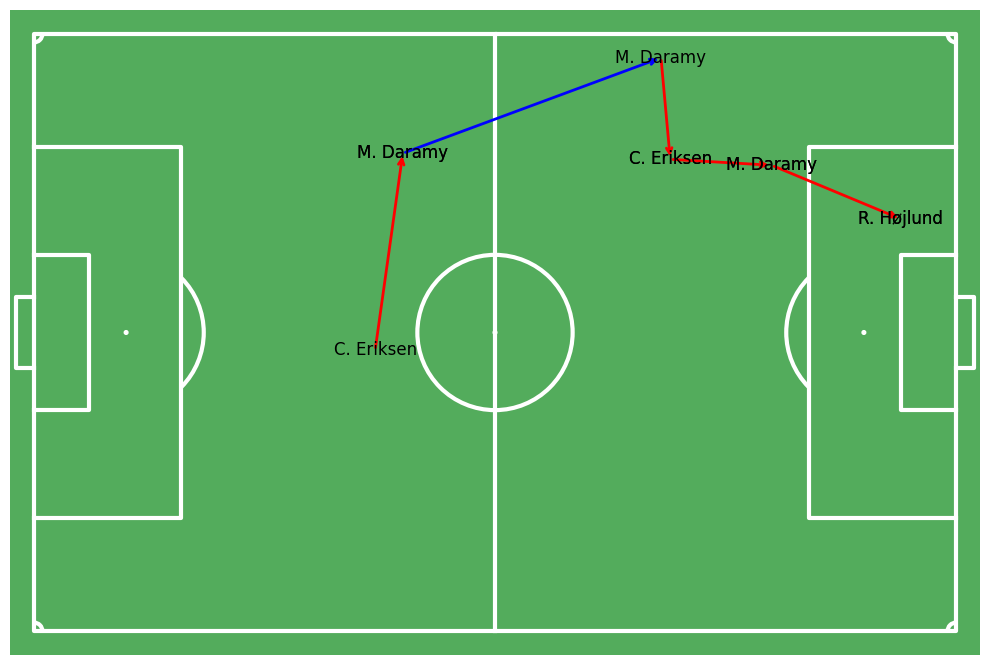

StopIteration: 

<Figure size 1000x1100 with 1 Axes>

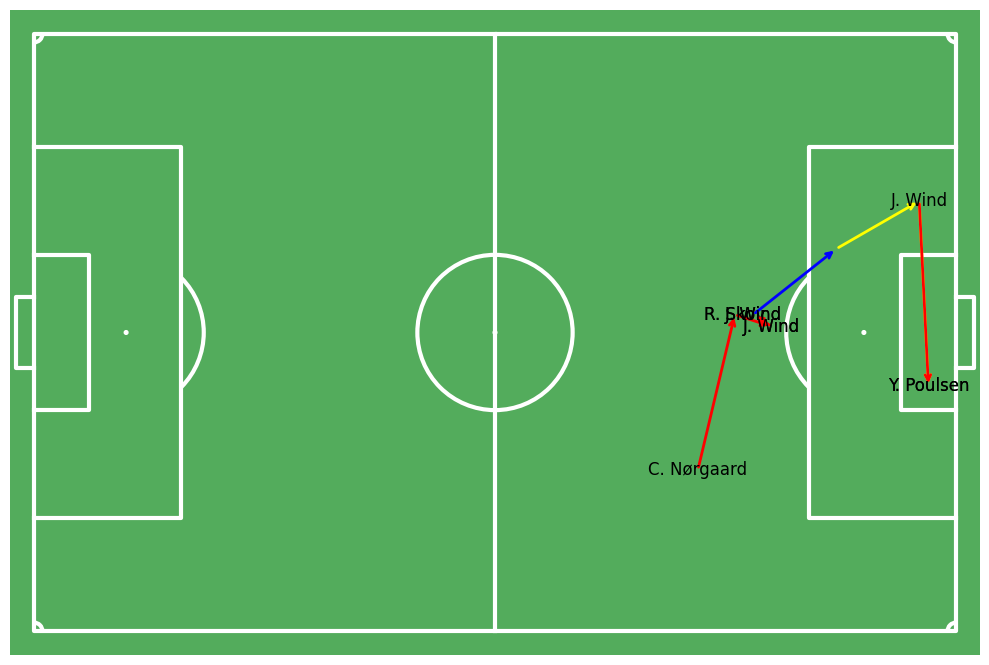

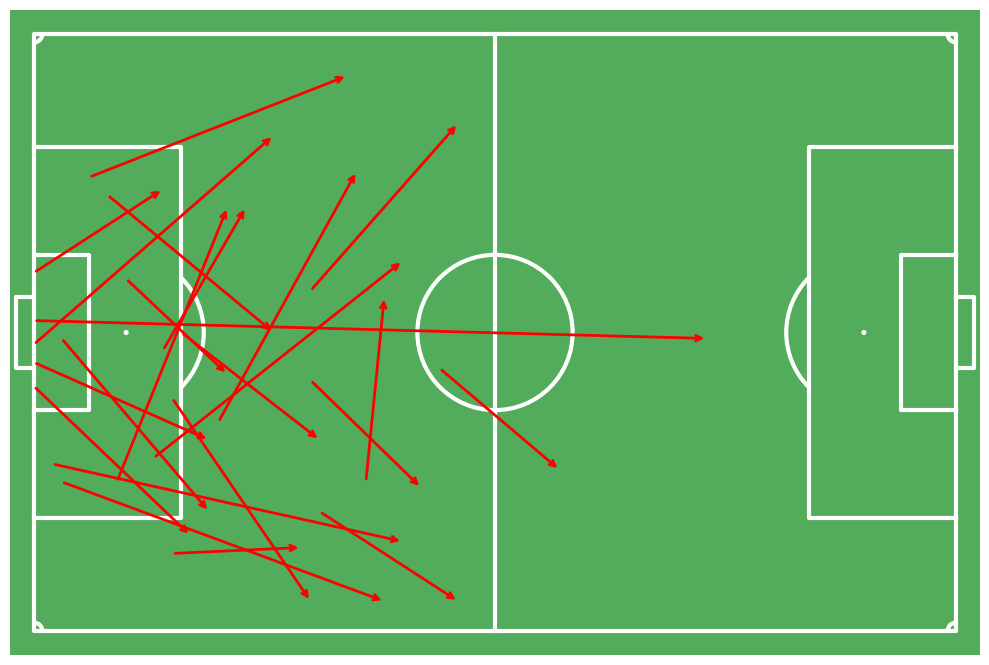

Total passes: 197, Left passes: 87, Right passes: 110


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


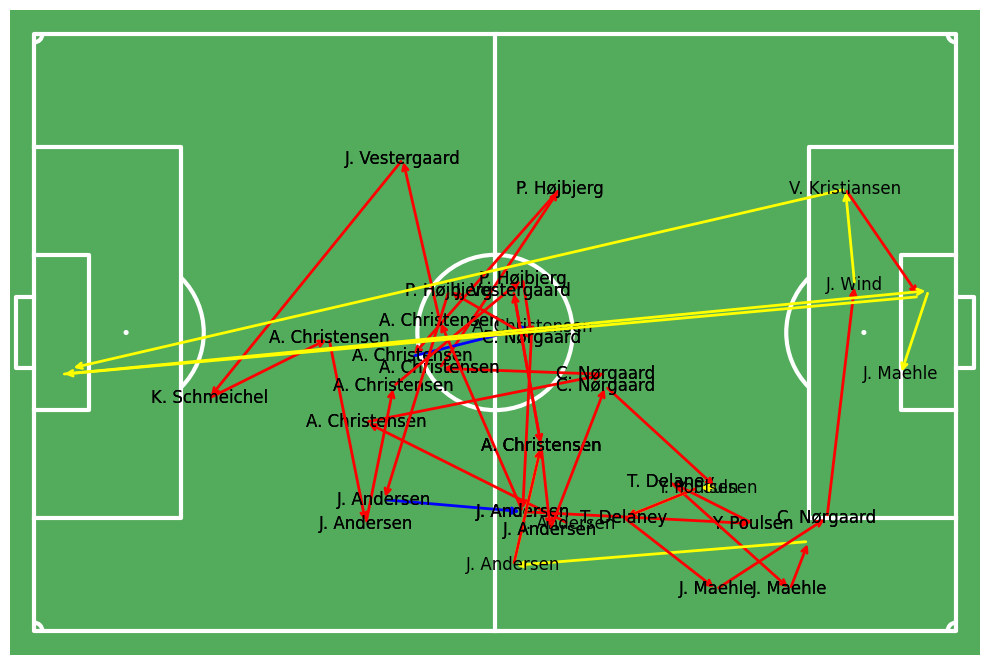

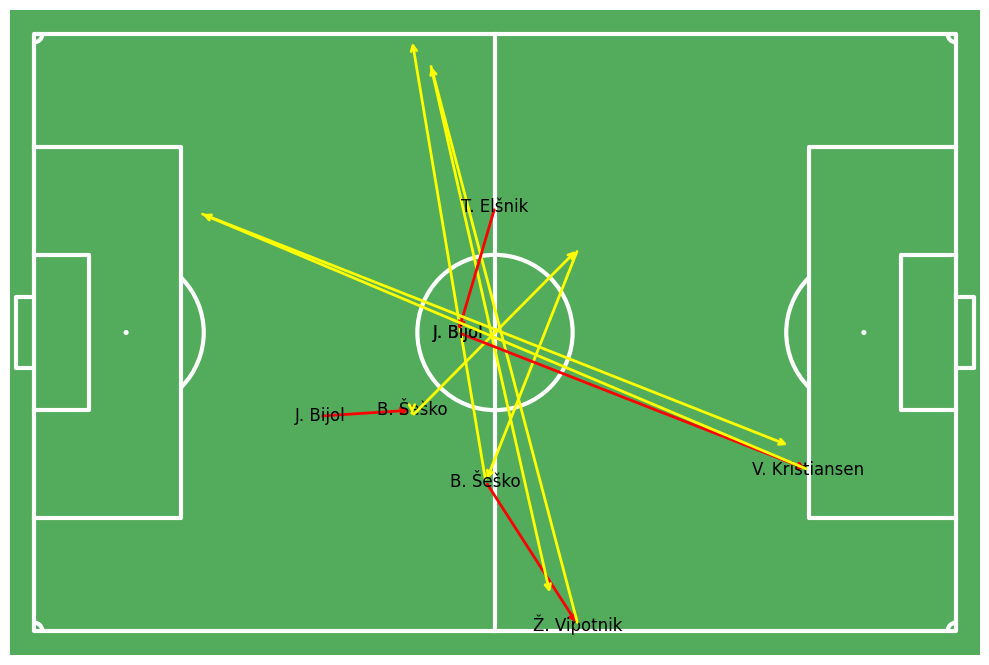

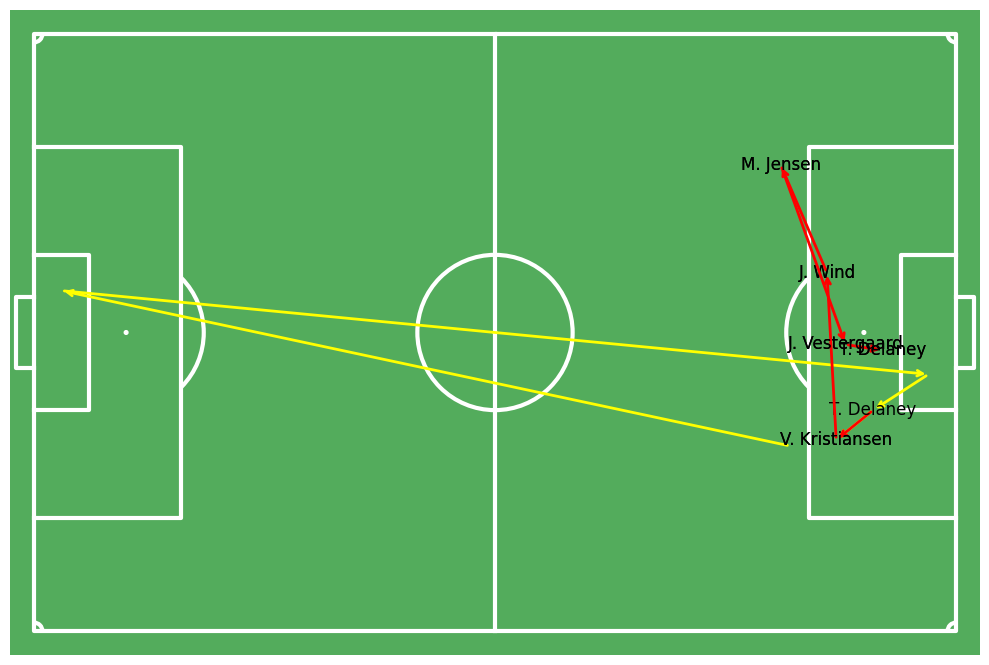

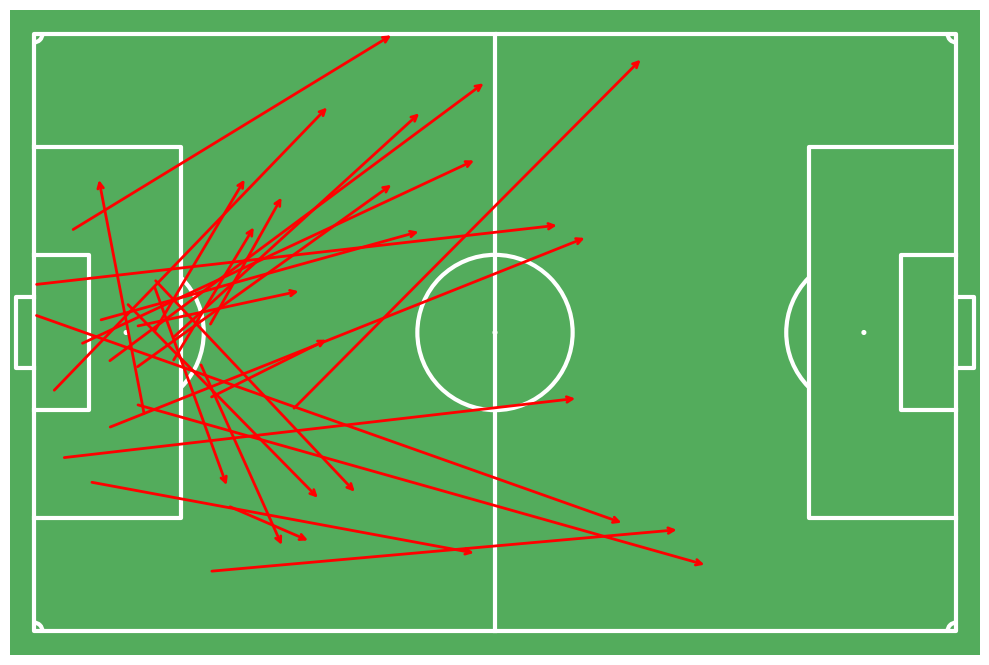

Total passes: 223, Left passes: 98, Right passes: 125


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


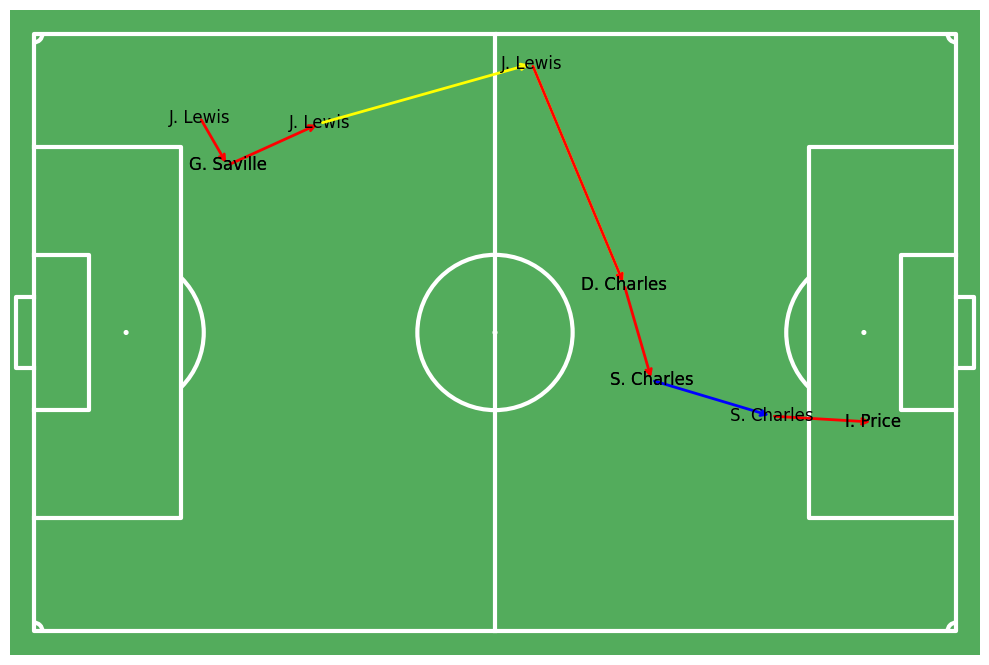

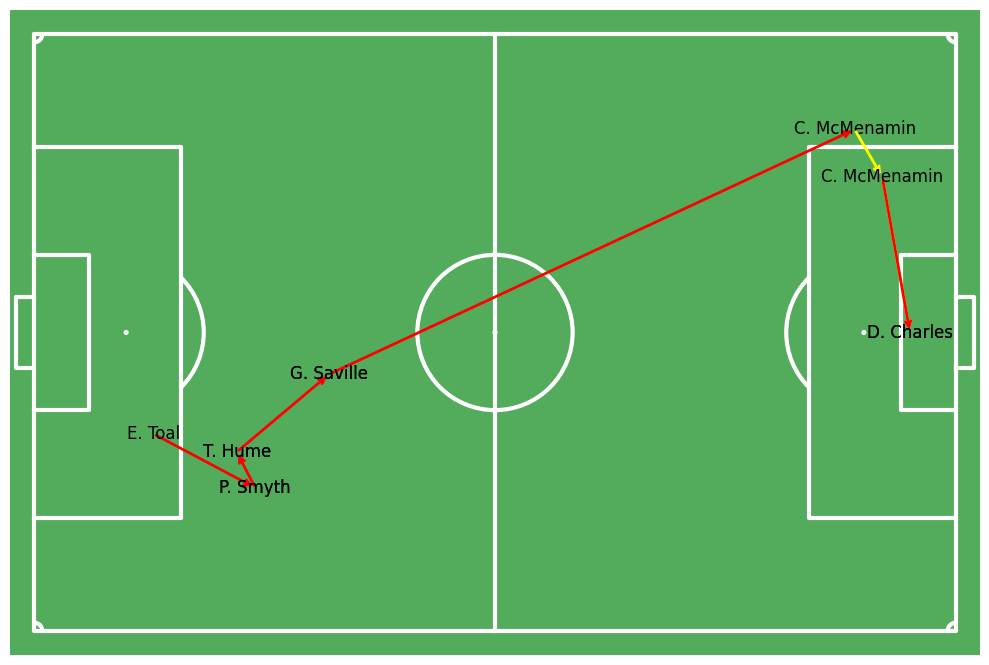

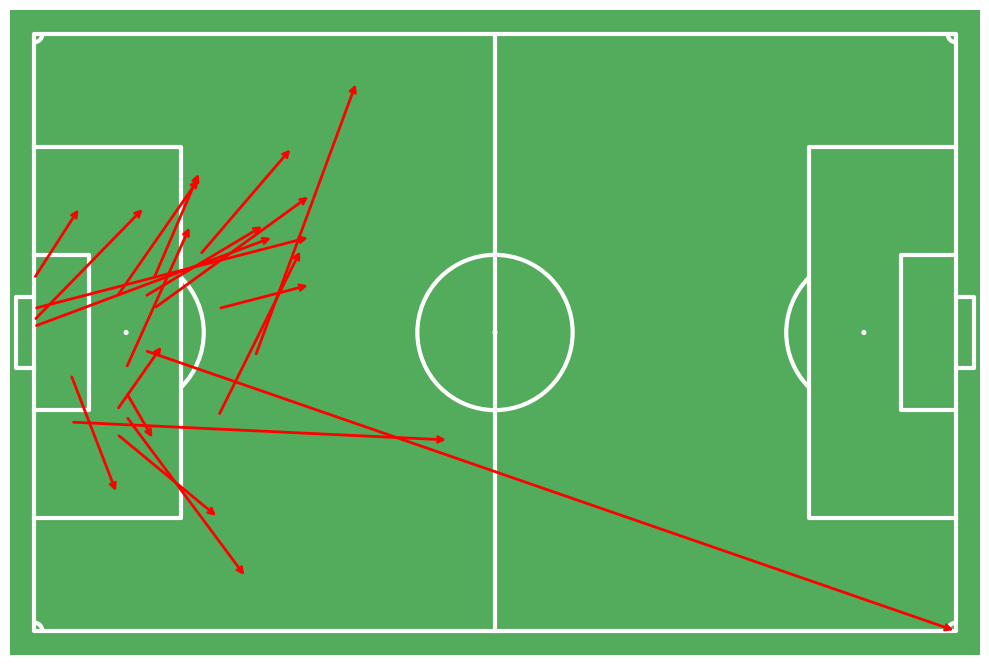

Total passes: 243, Left passes: 105, Right passes: 138
Total passes:  243
Left passes:  105
Right passes:  138


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


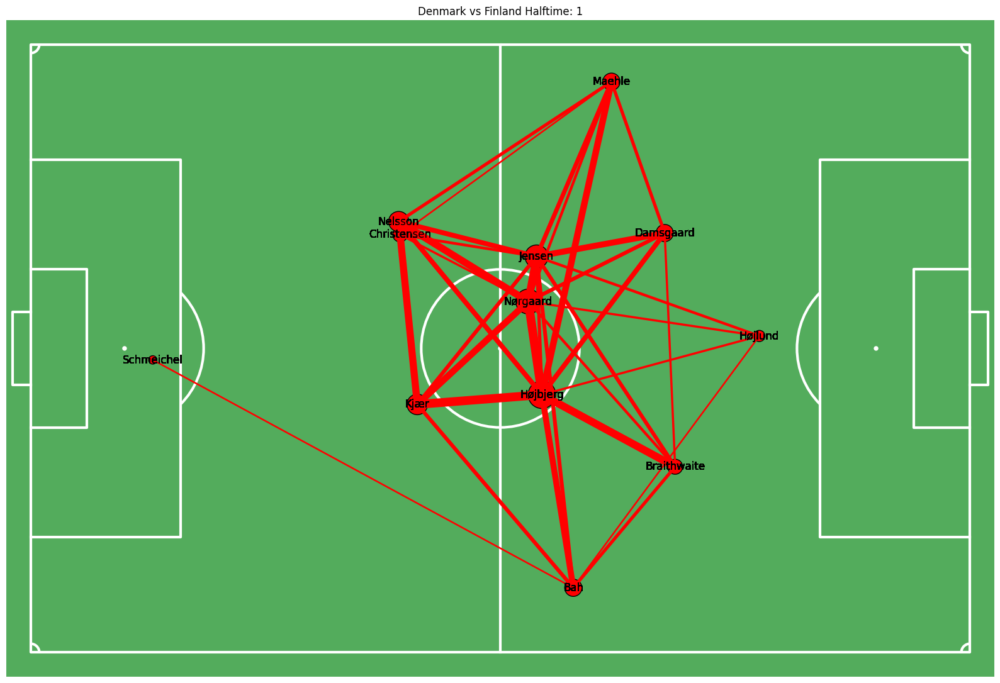

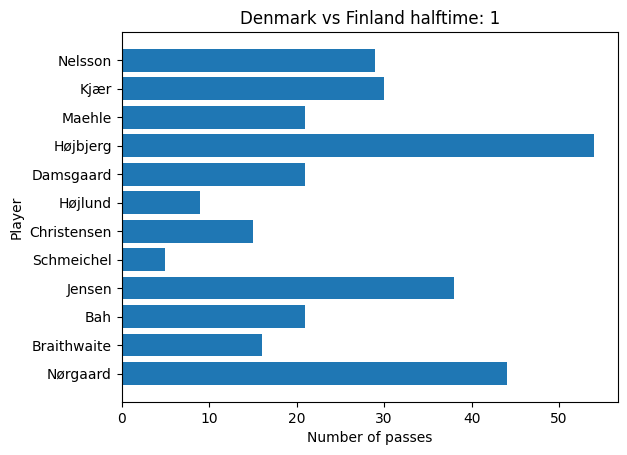

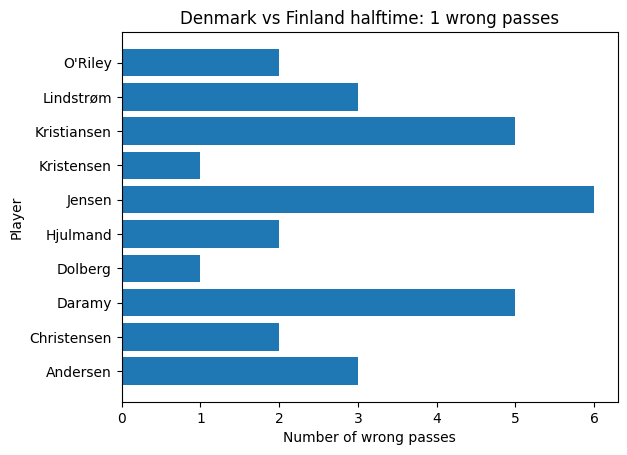

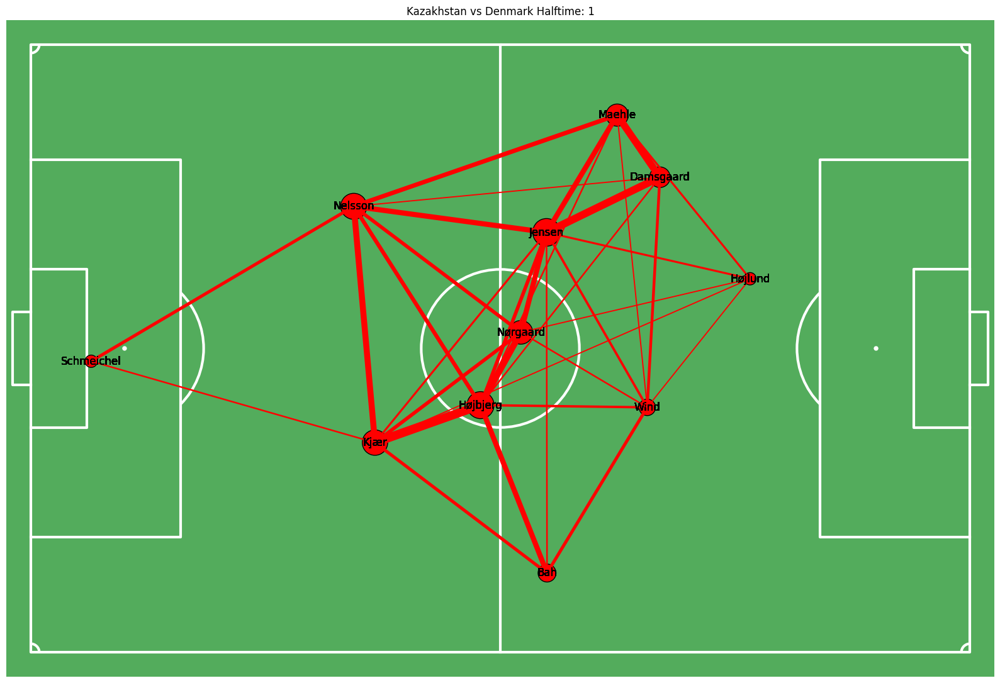

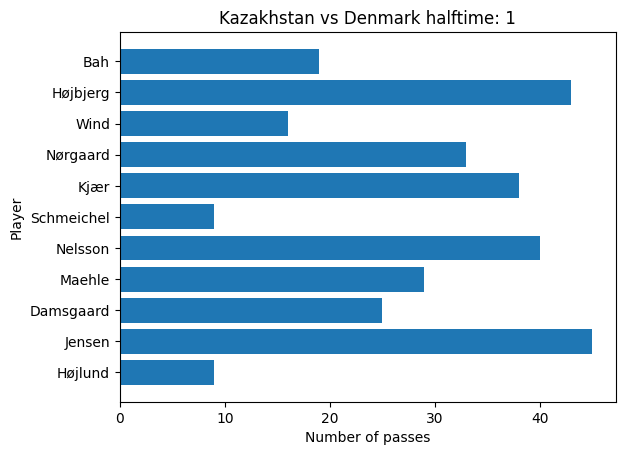

...

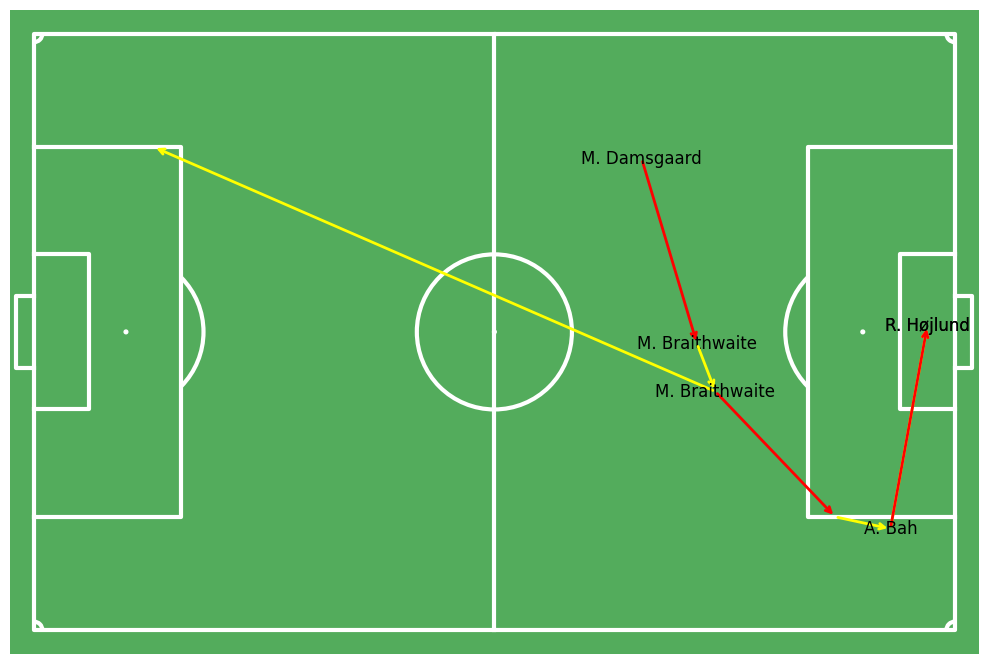

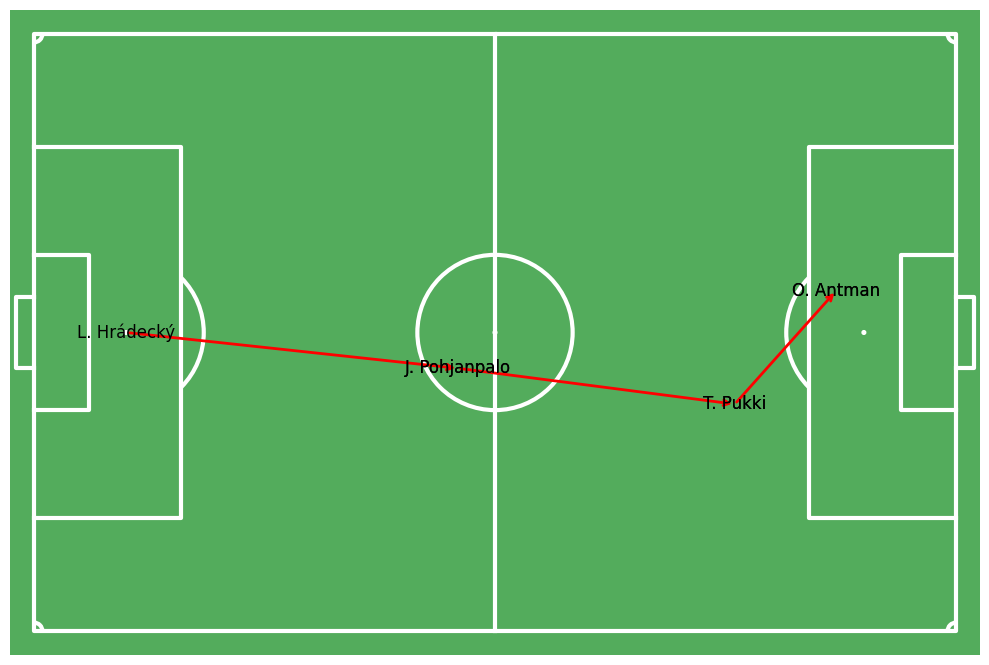

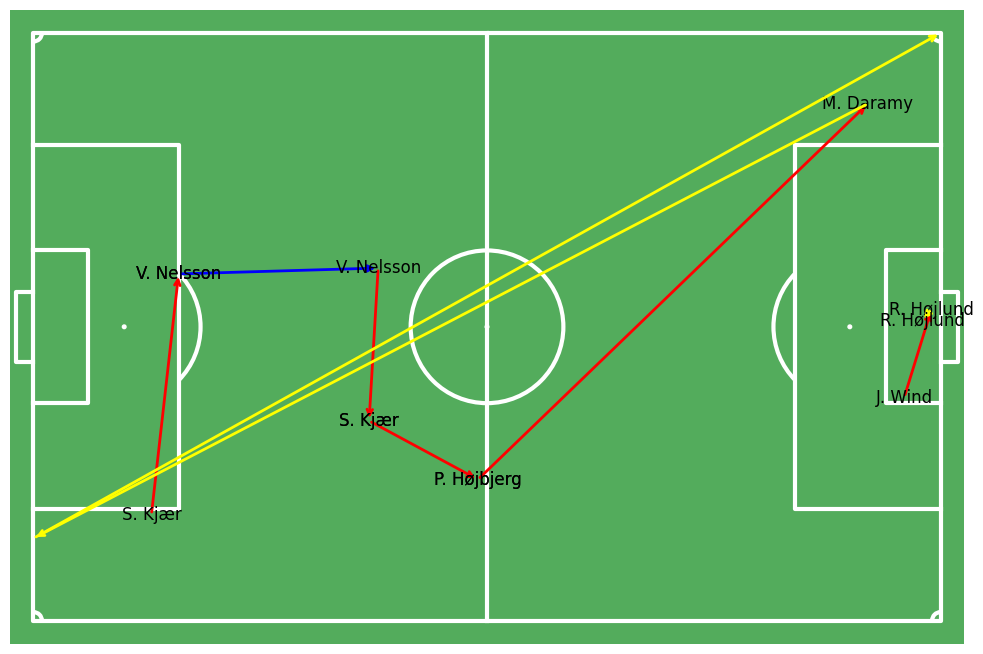

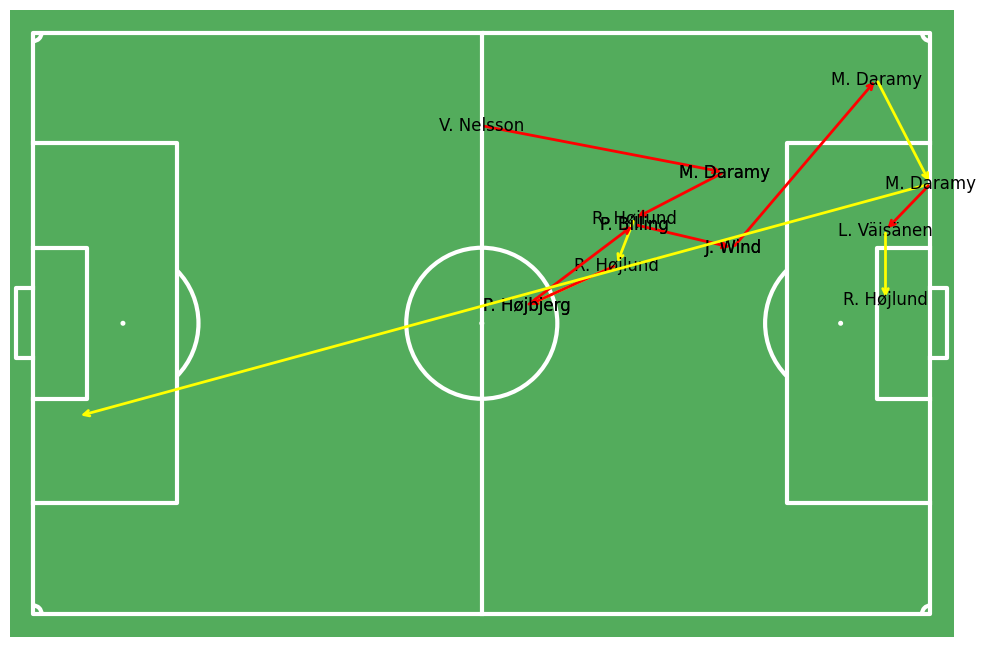

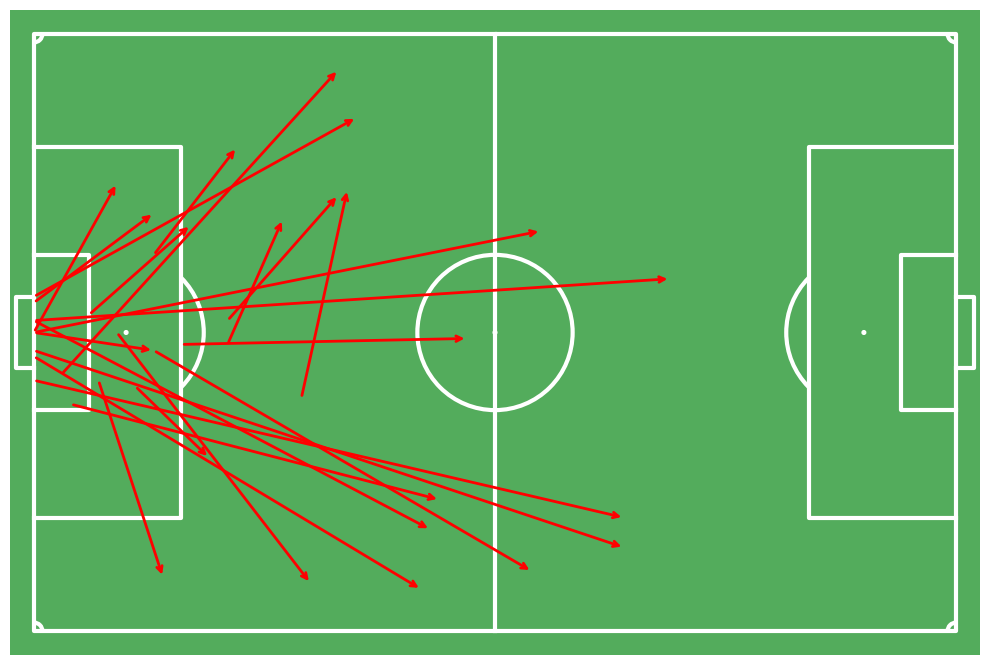

Total passes: 22, Left passes: 11, Right passes: 11


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


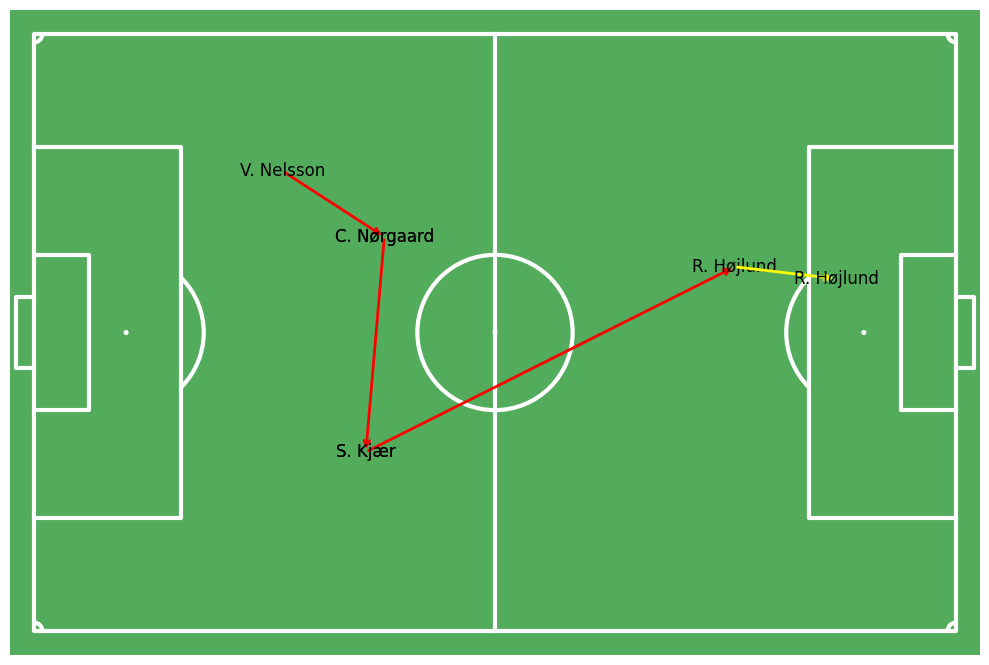

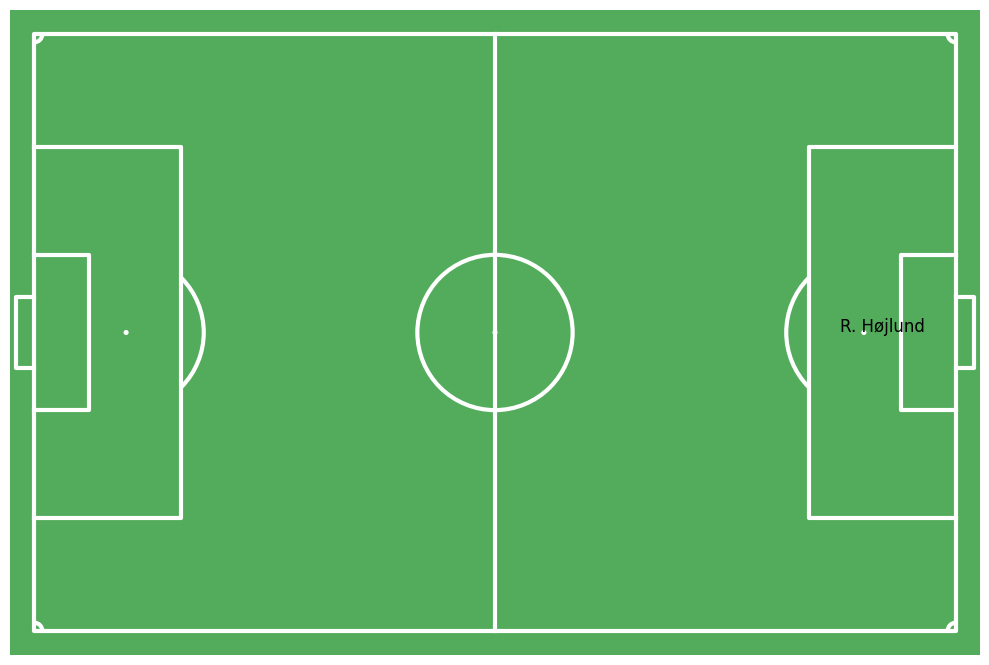

StopIteration: 

<Figure size 1000x1100 with 1 Axes>

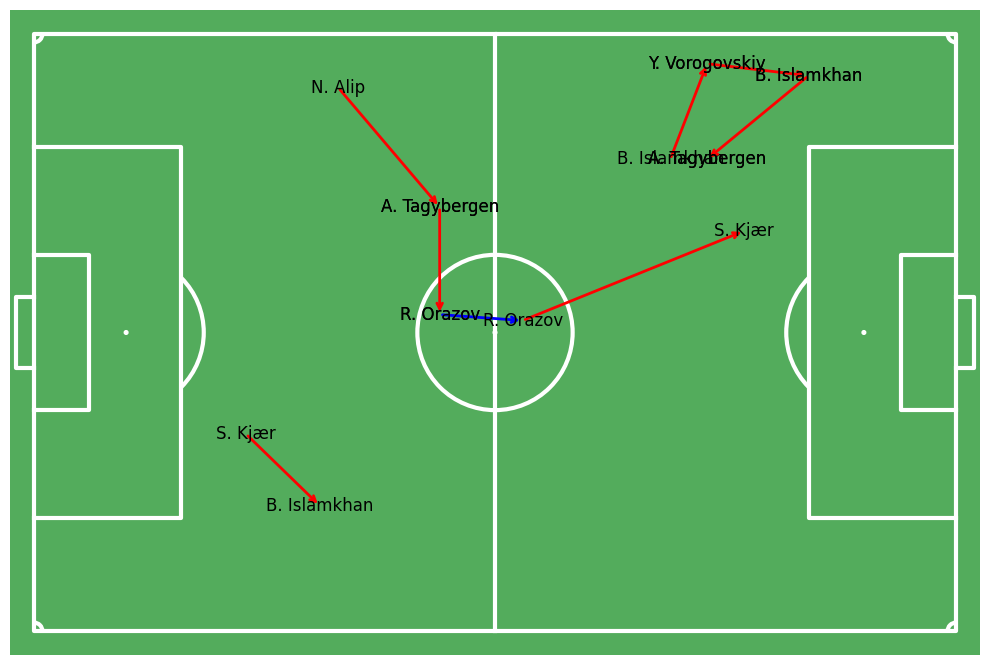

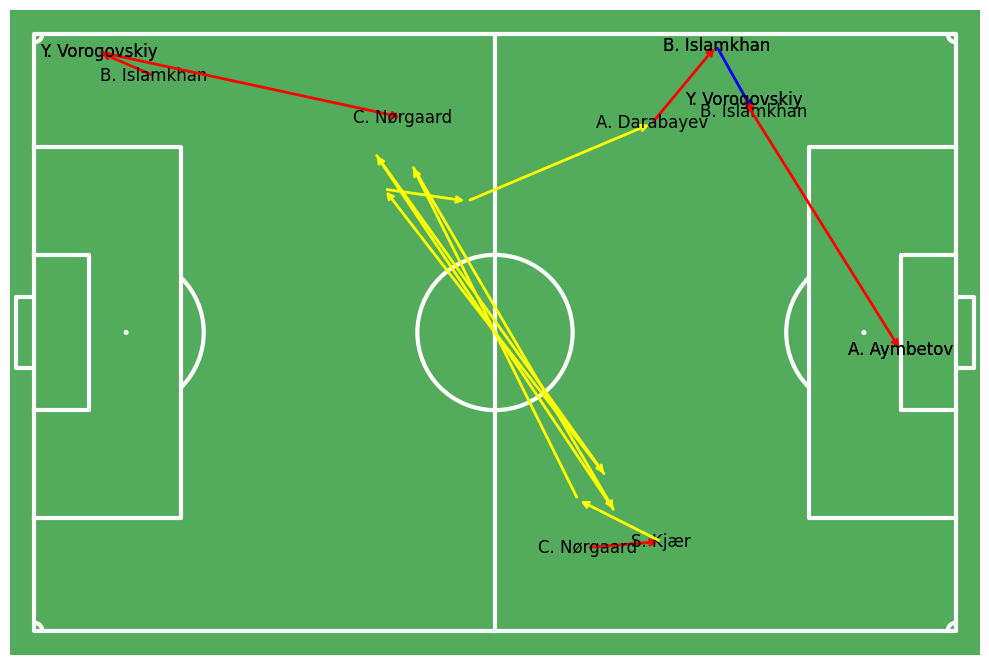

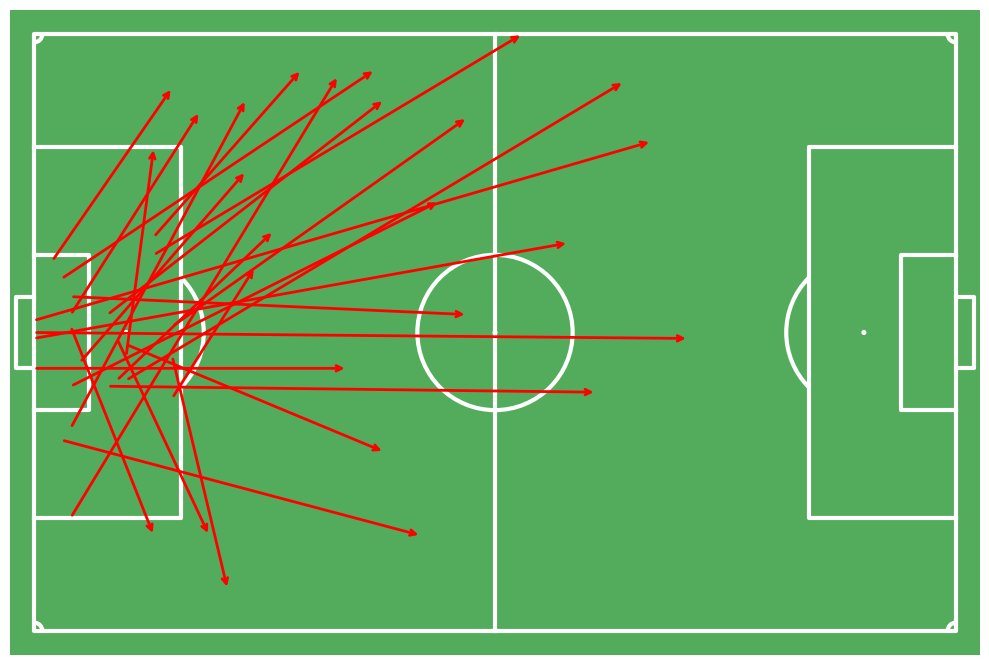

Total passes: 48, Left passes: 19, Right passes: 29


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


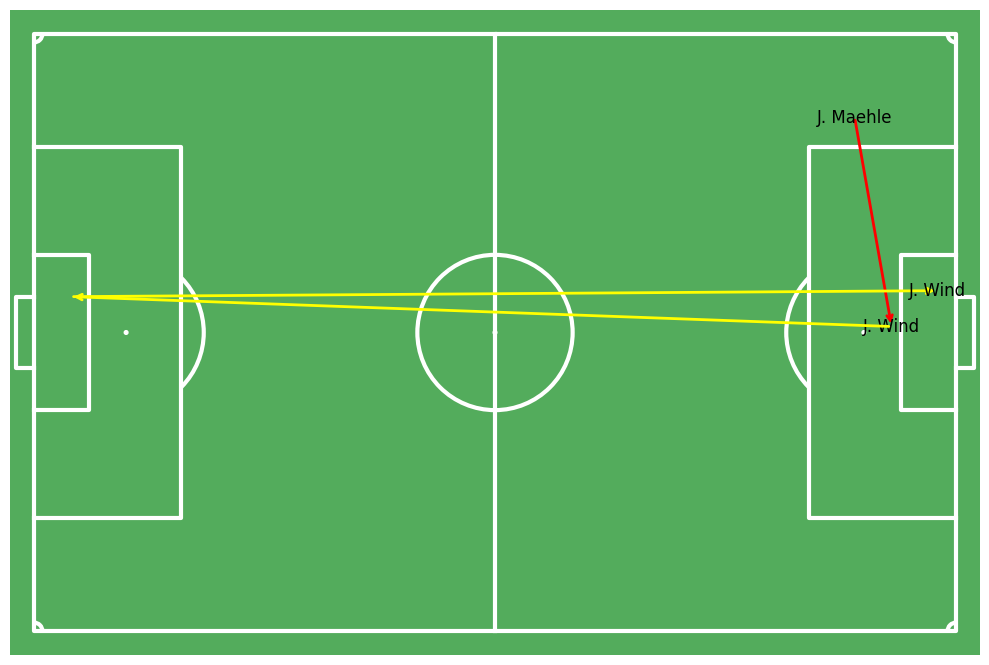

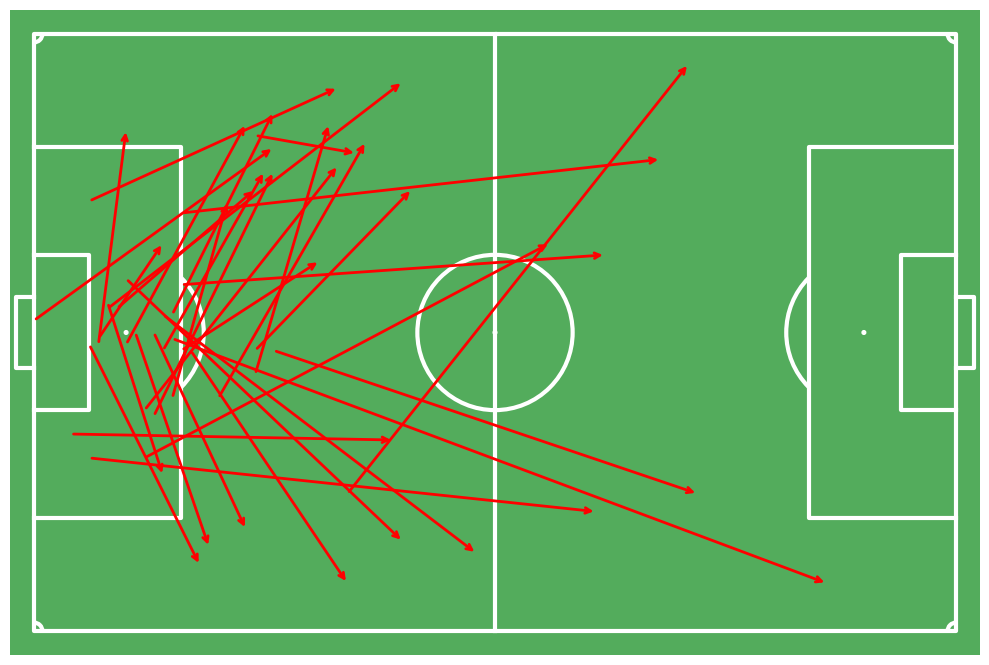

Total passes: 80, Left passes: 30, Right passes: 50


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


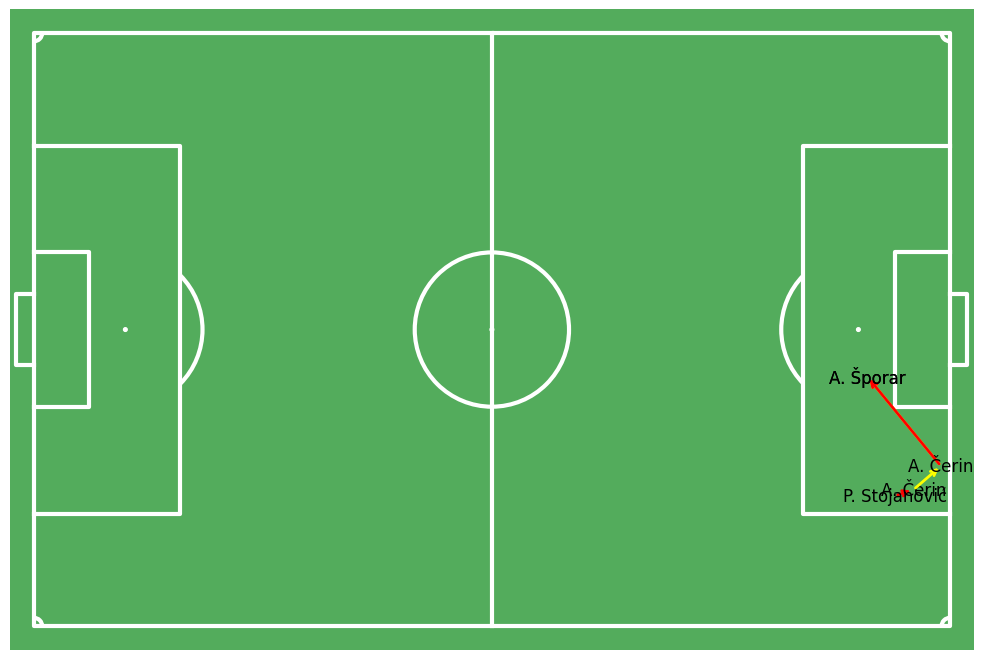

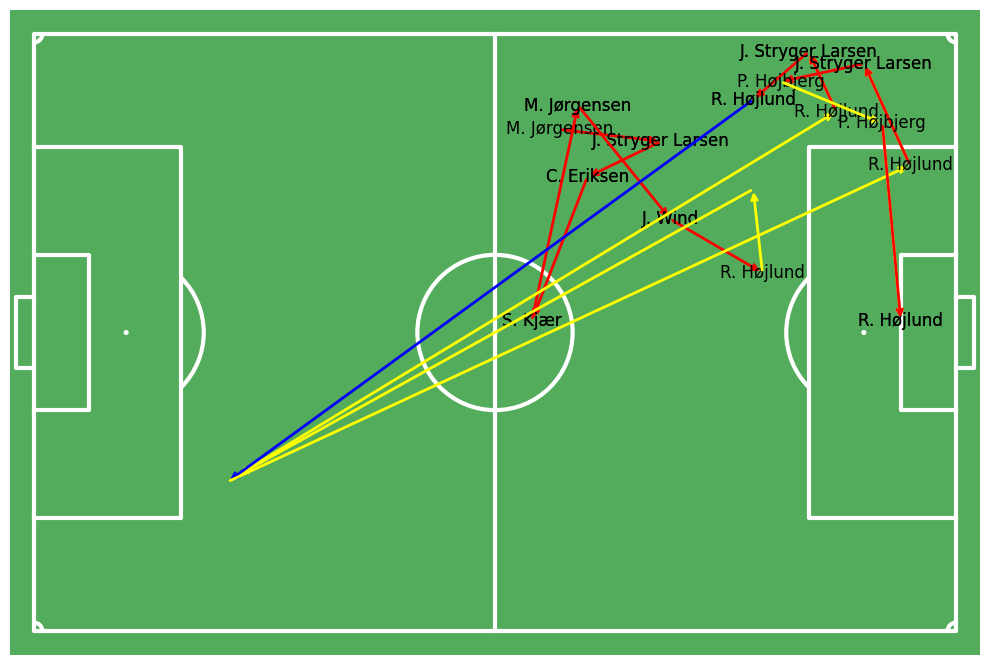

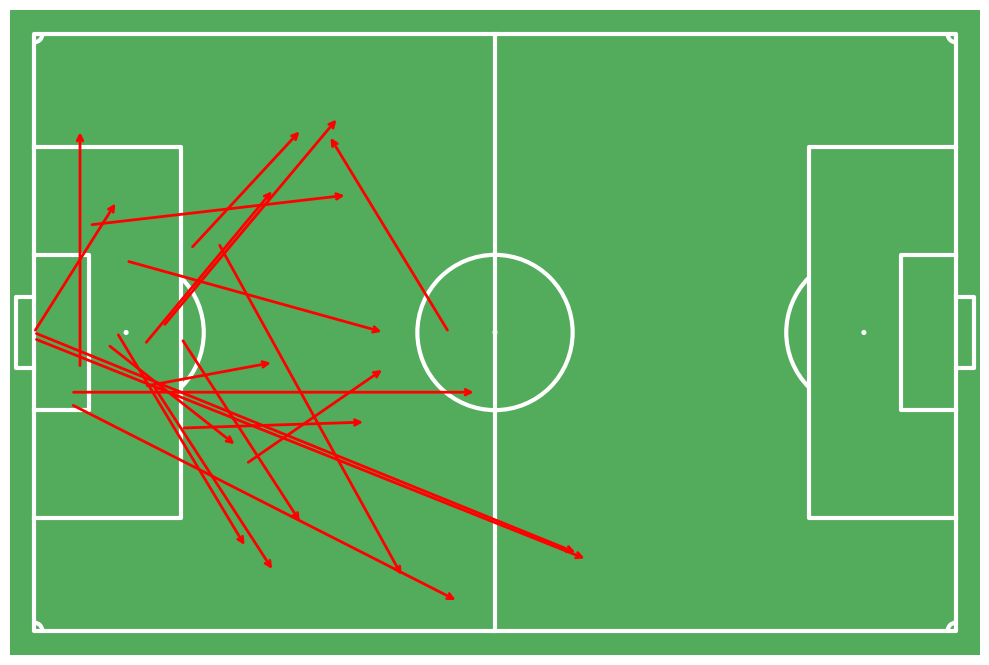

Total passes: 100, Left passes: 42, Right passes: 58


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


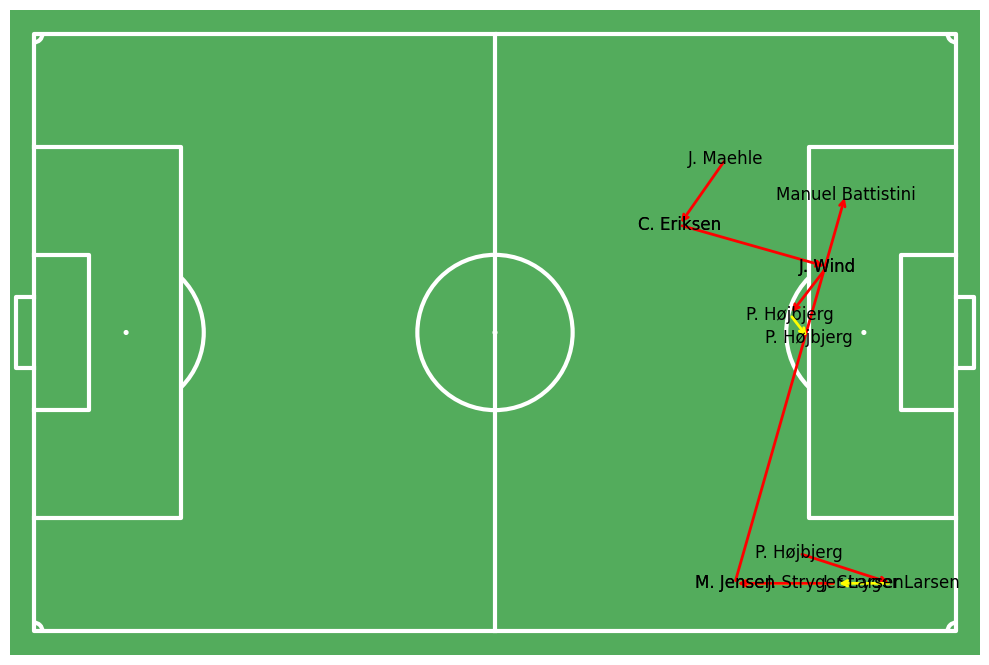

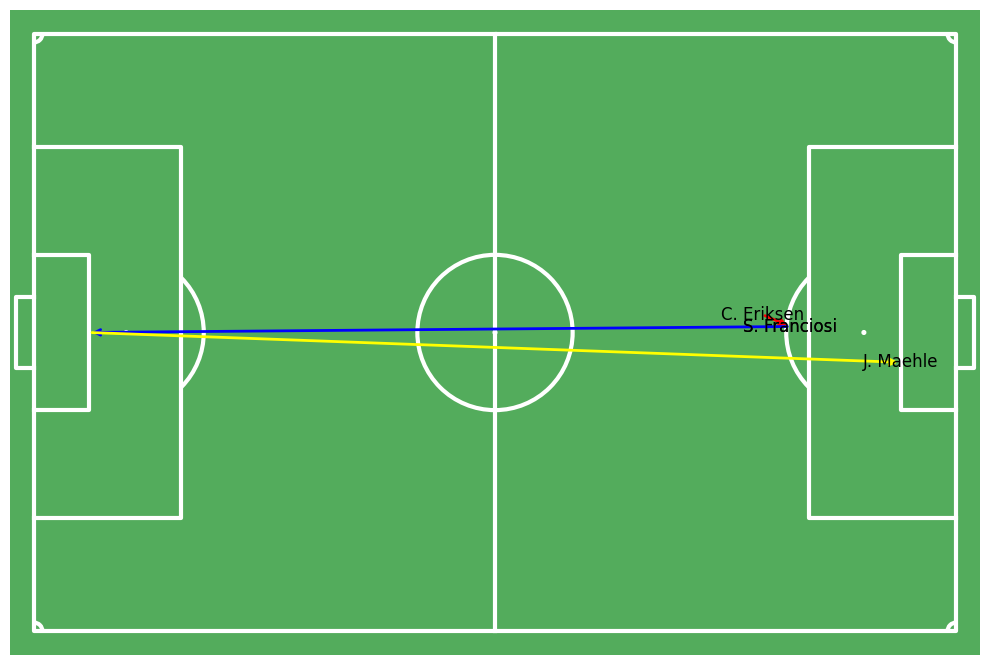

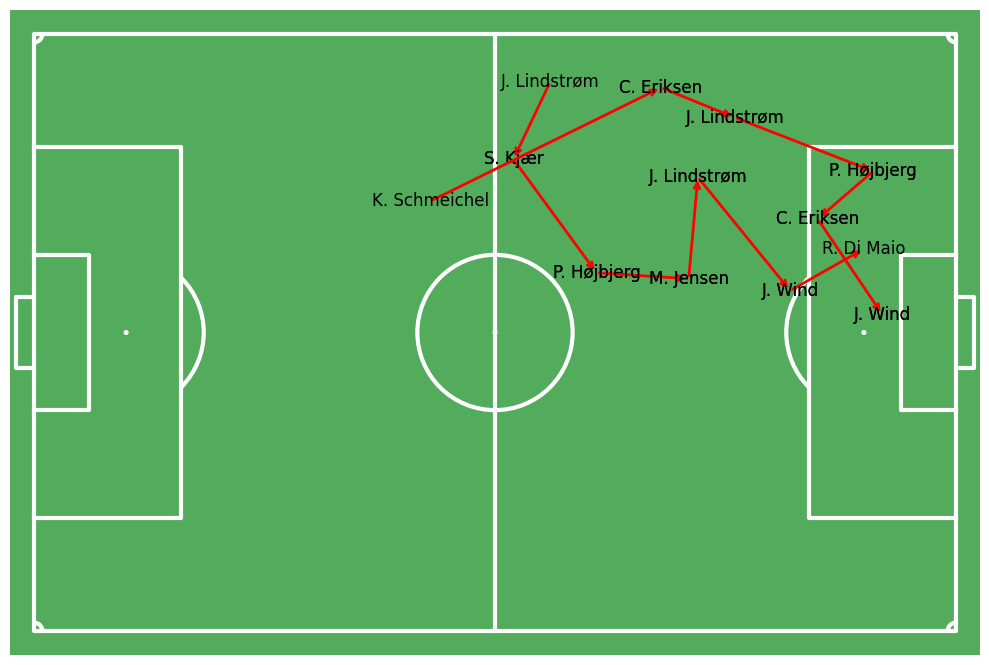

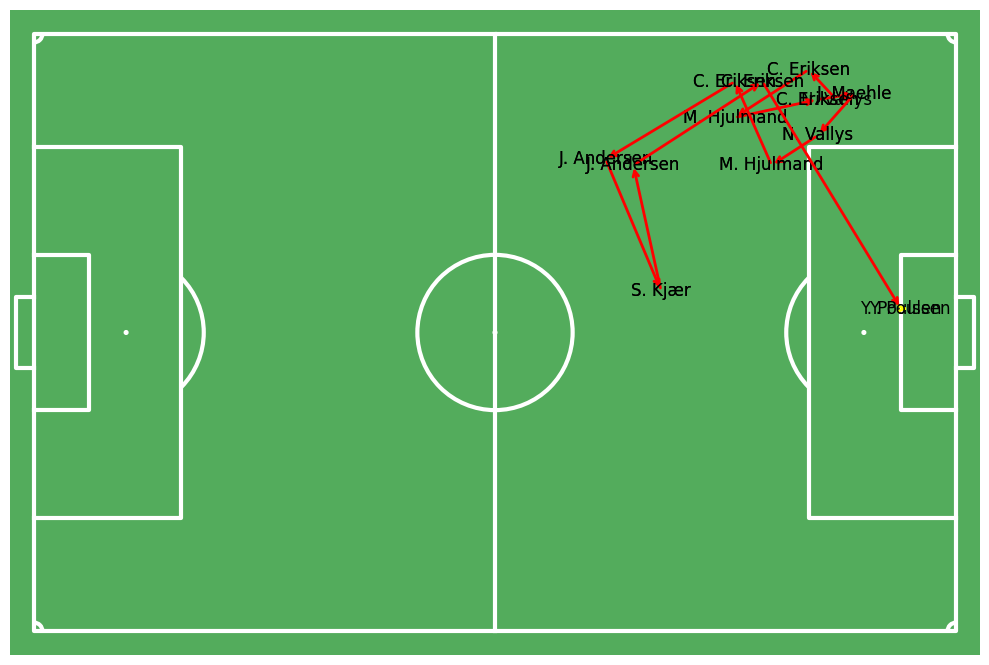

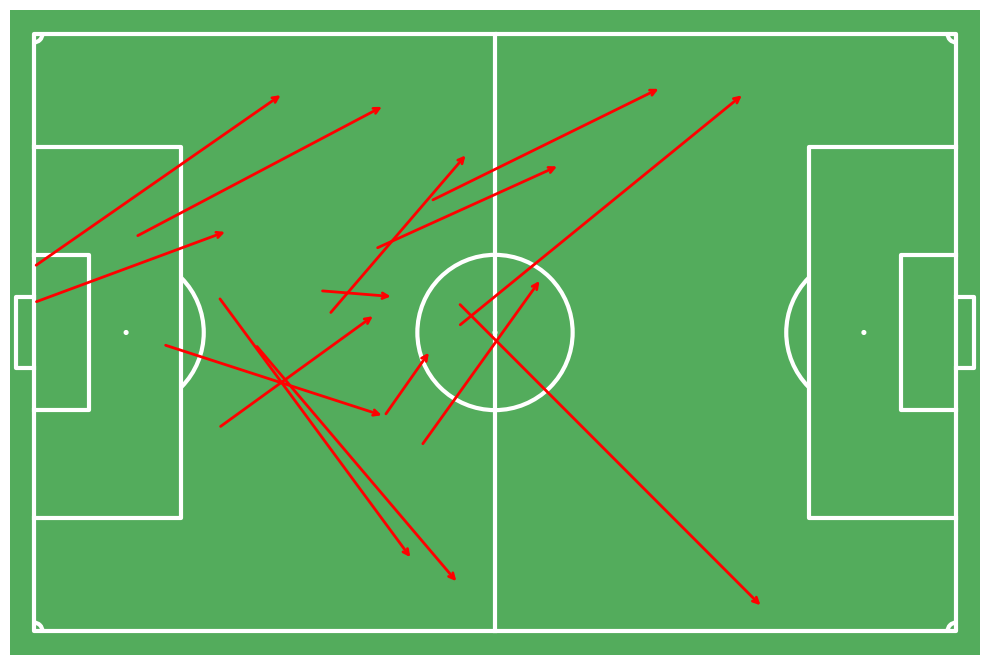

Total passes: 115, Left passes: 47, Right passes: 68


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


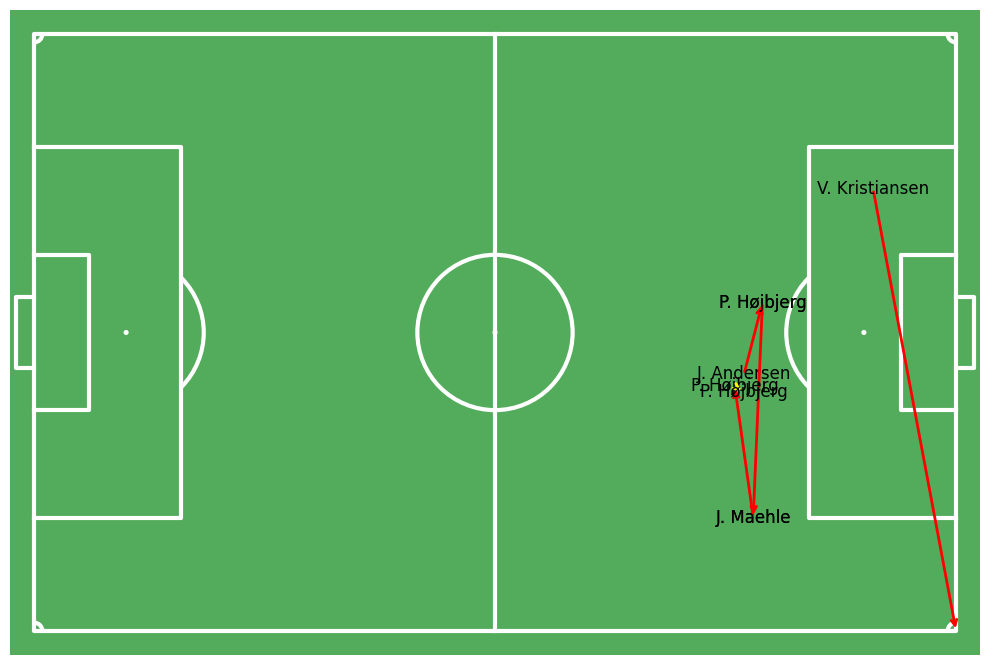

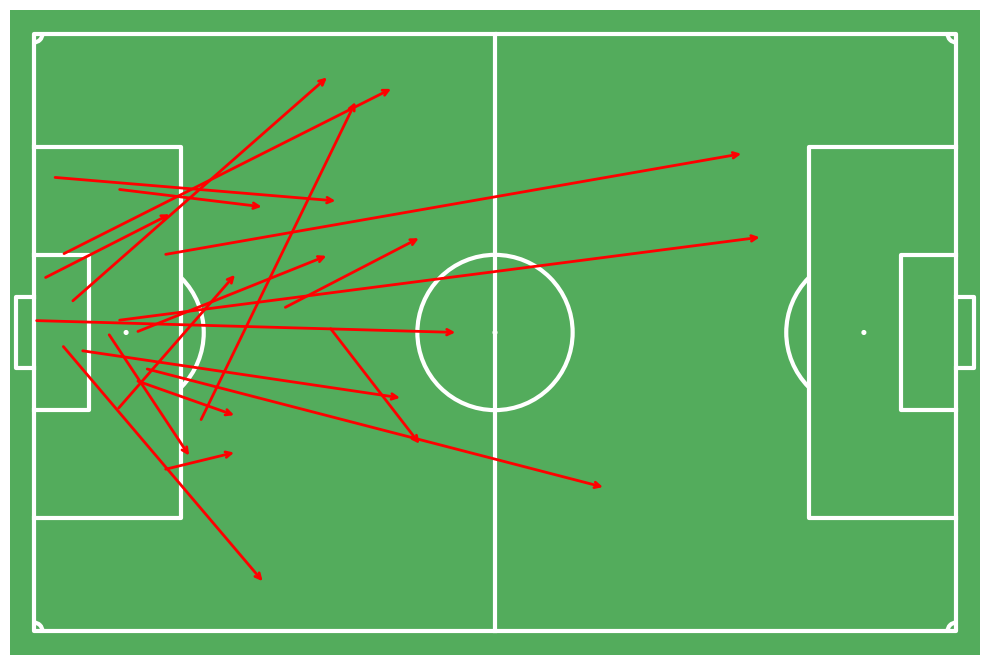

Total passes: 134, Left passes: 54, Right passes: 80


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


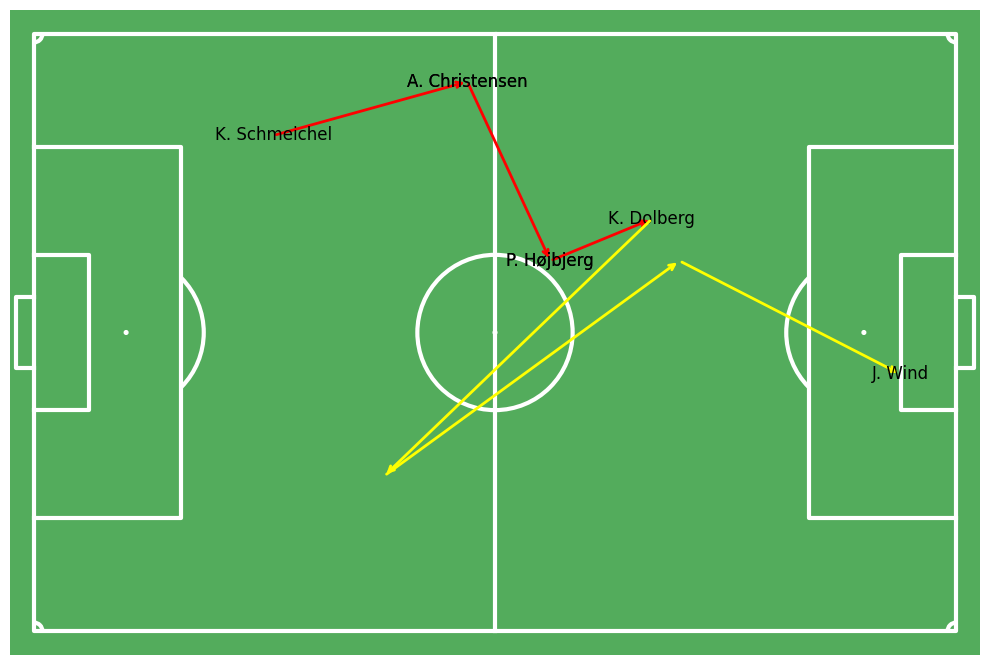

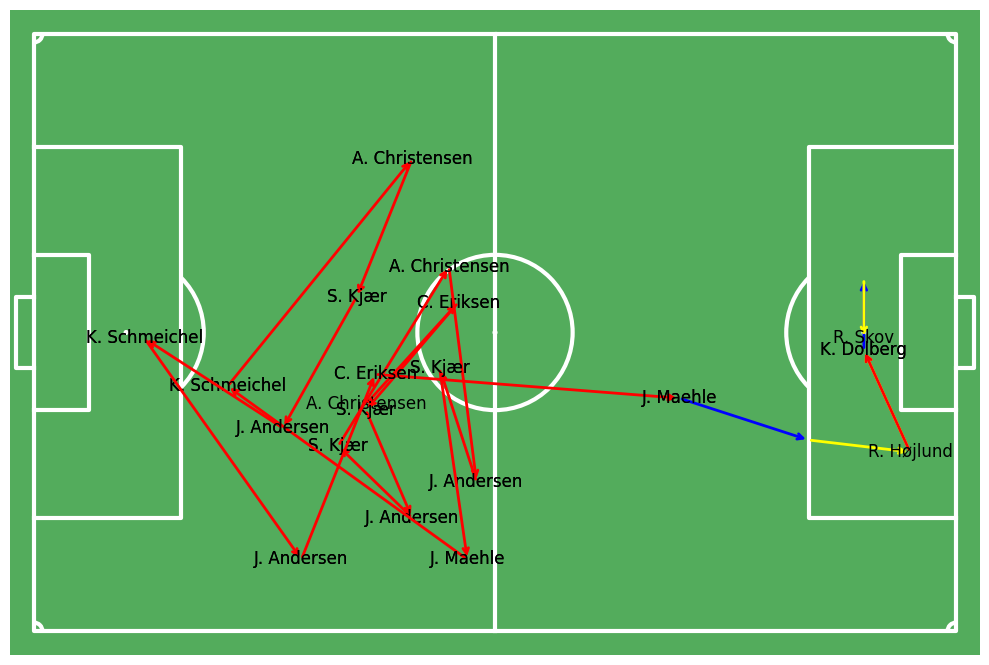

StopIteration: 

<Figure size 1000x1100 with 1 Axes>

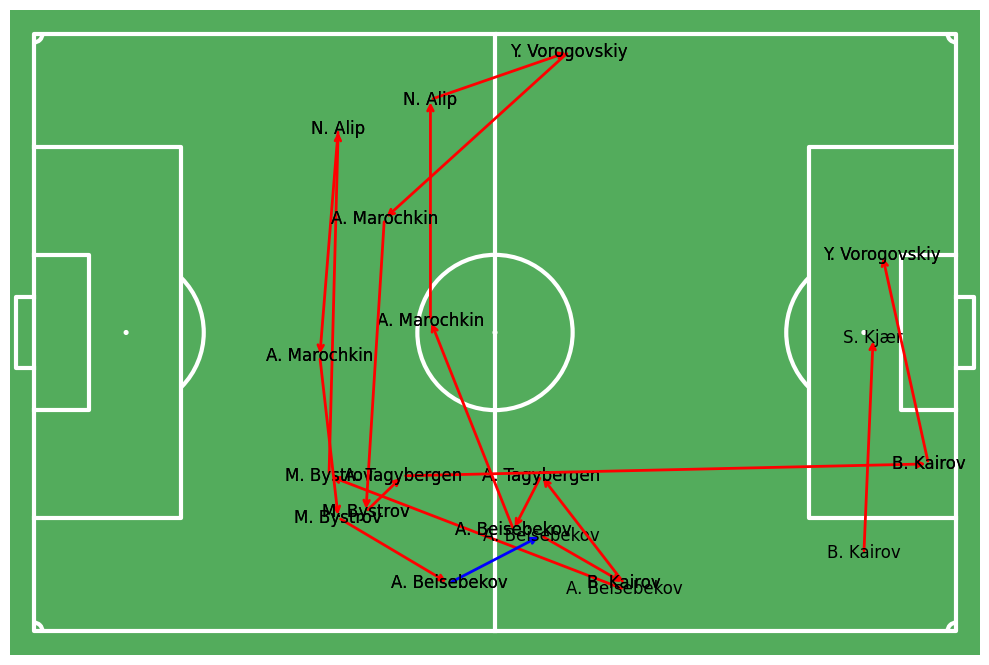

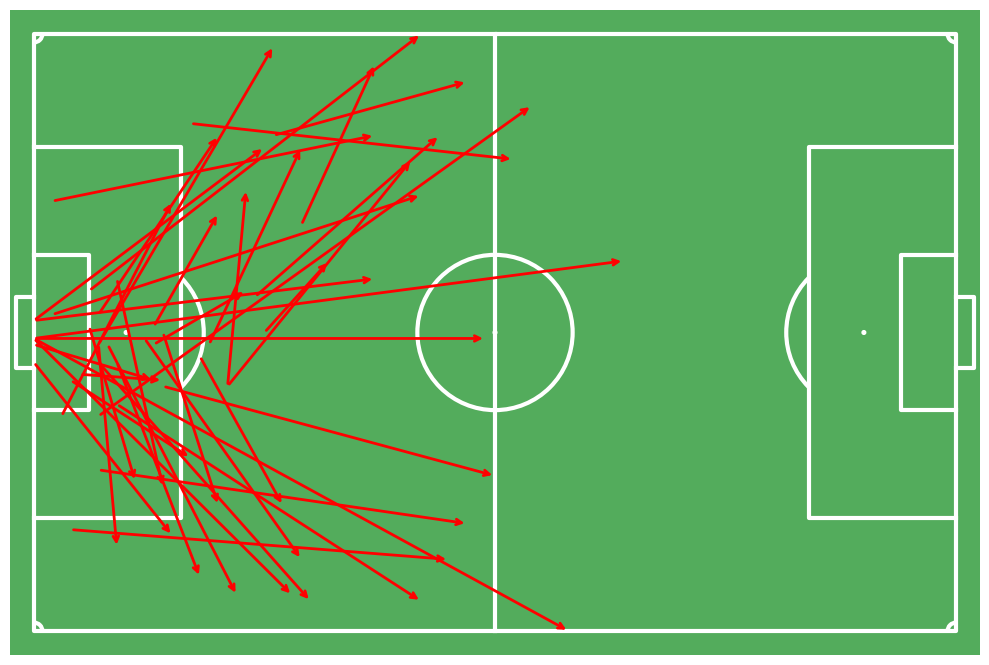

Total passes: 174, Left passes: 74, Right passes: 100


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


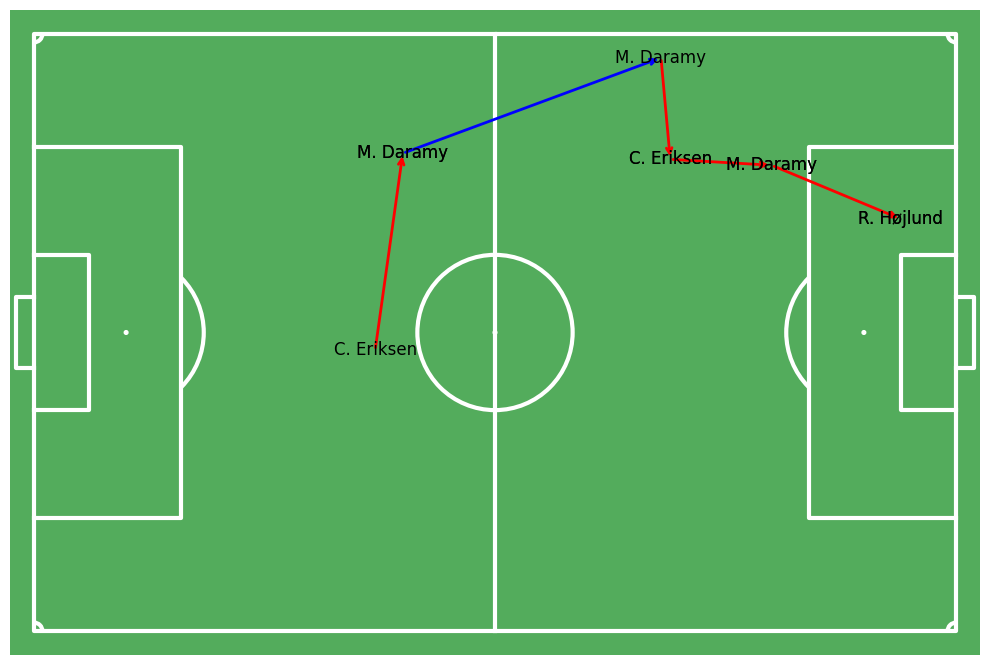

StopIteration: 

<Figure size 1000x1100 with 1 Axes>

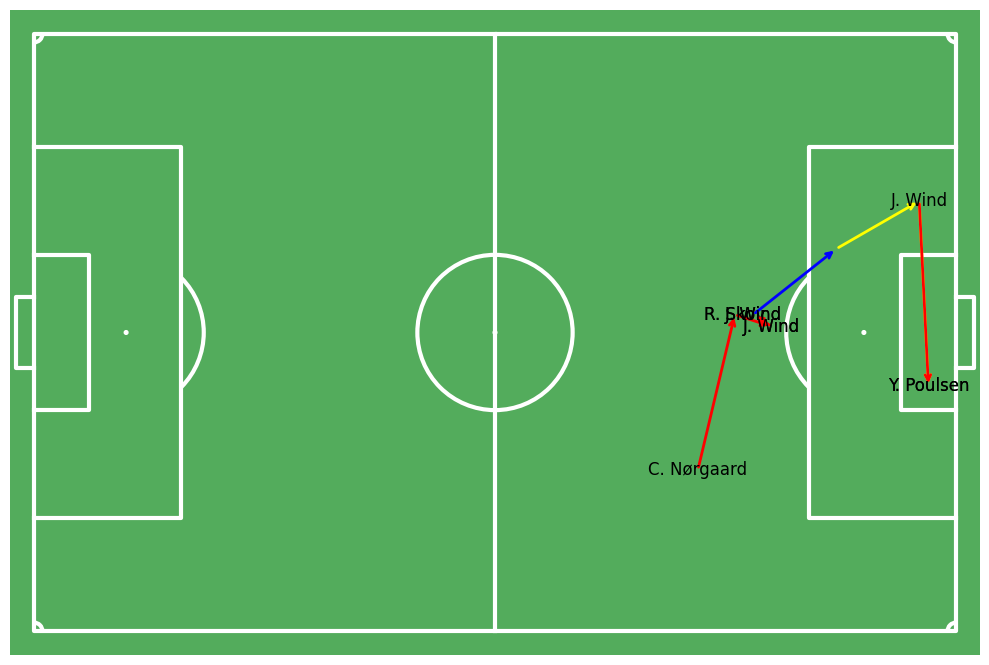

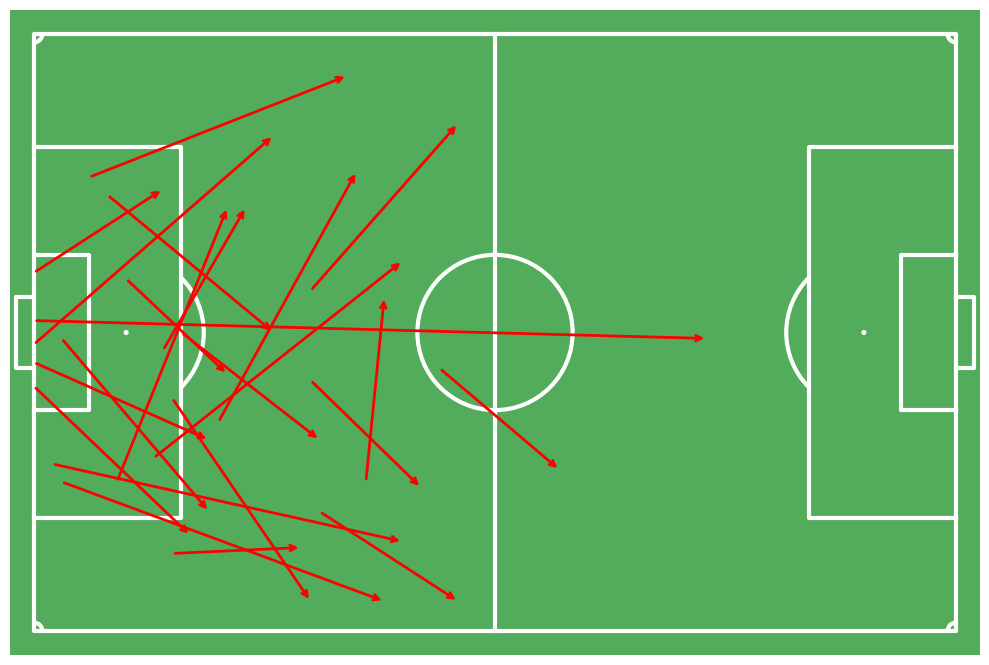

Total passes: 197, Left passes: 87, Right passes: 110


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


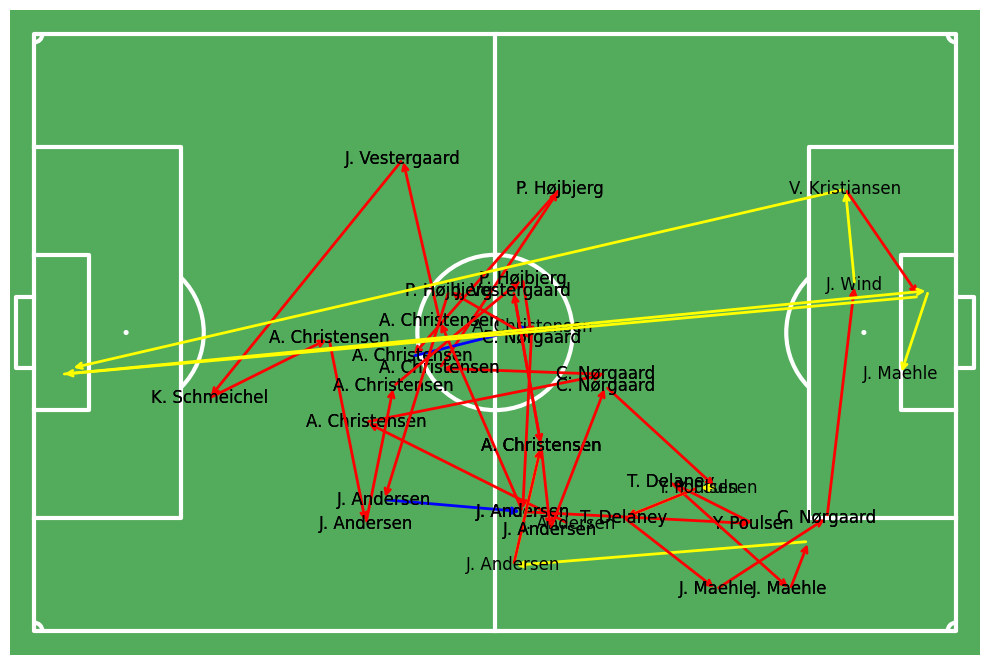

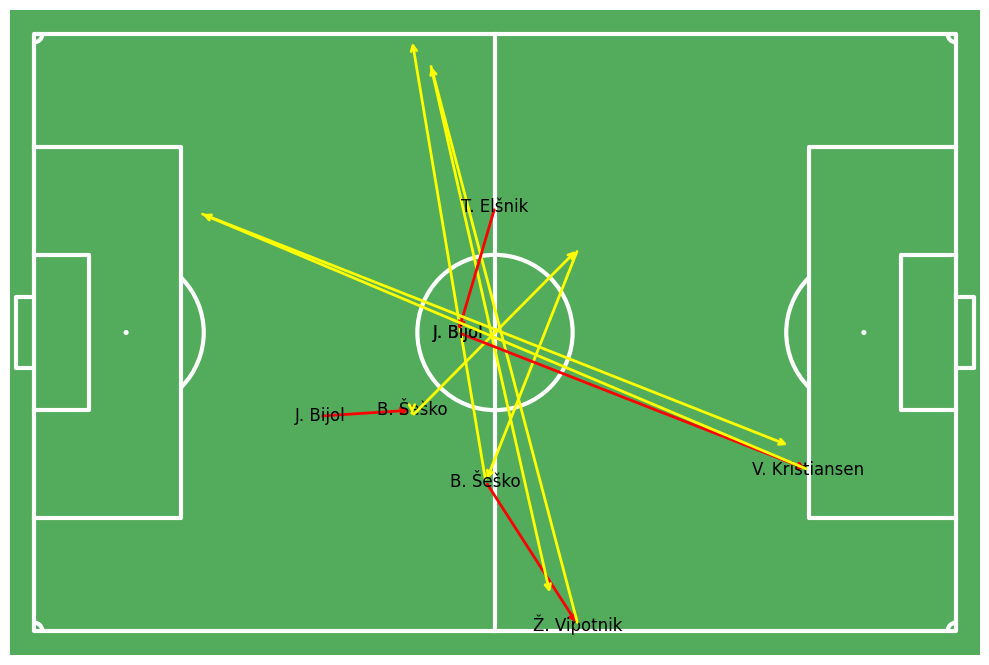

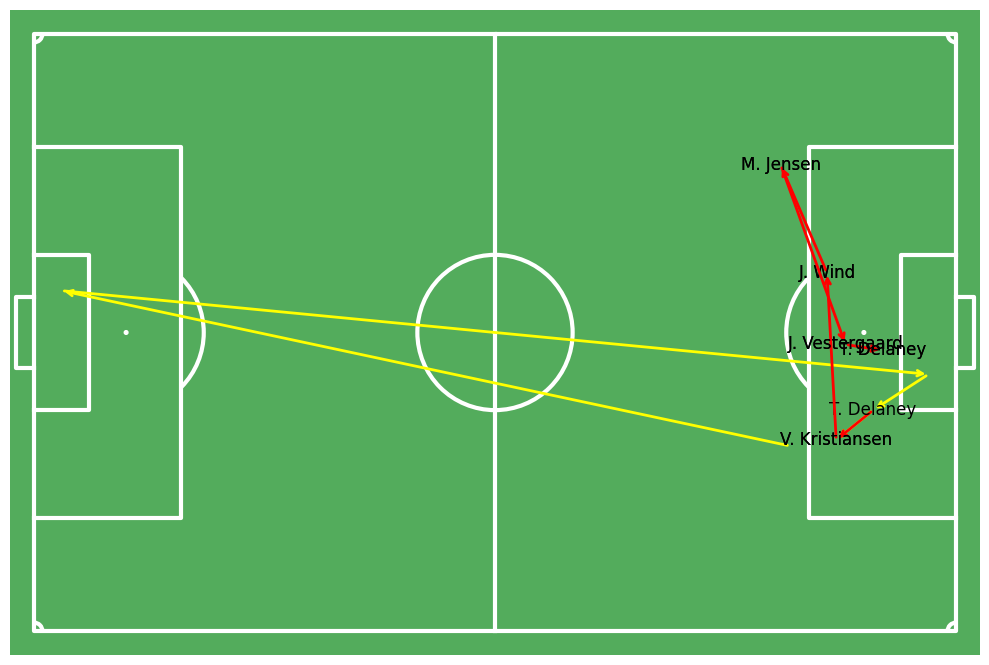

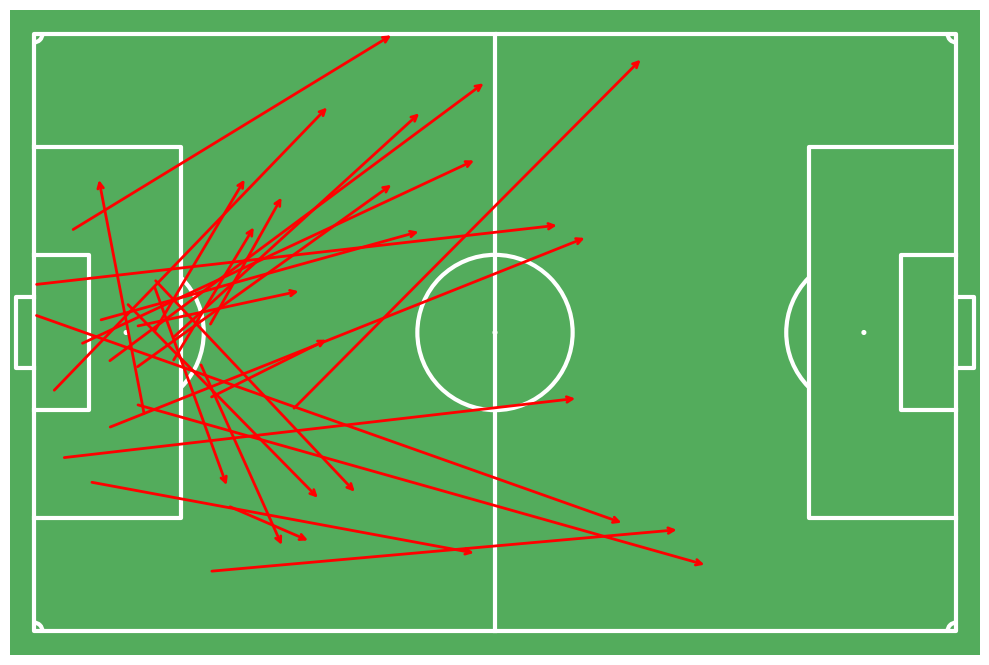

Total passes: 223, Left passes: 98, Right passes: 125


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


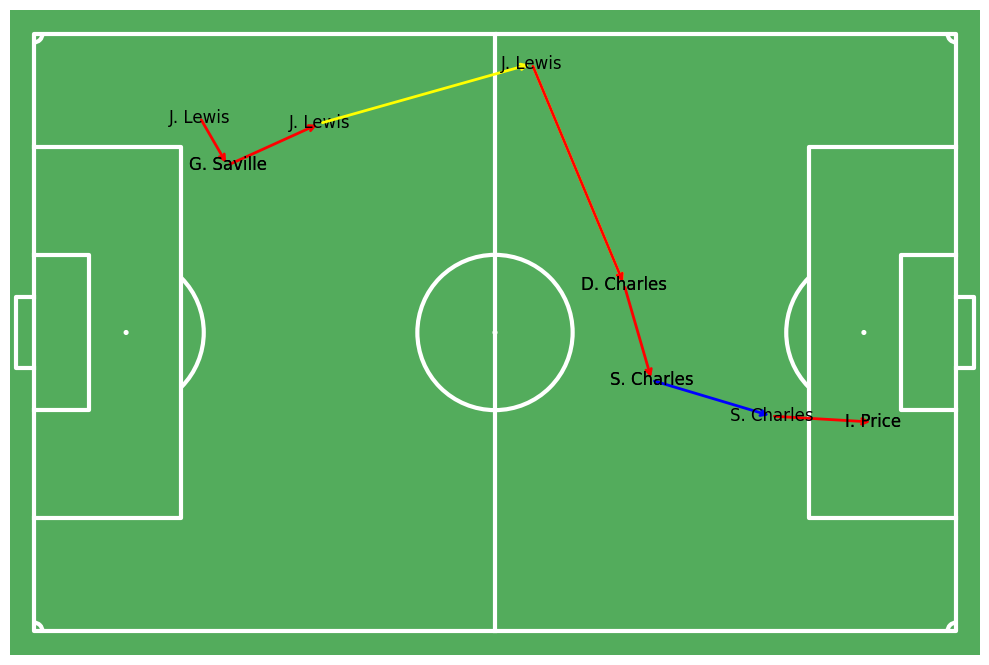

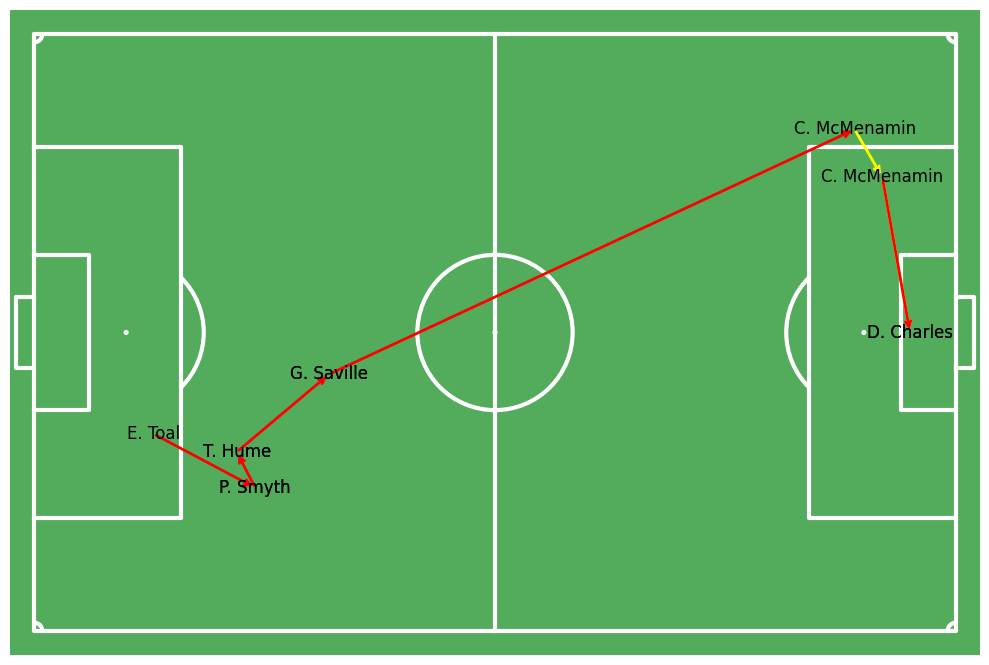

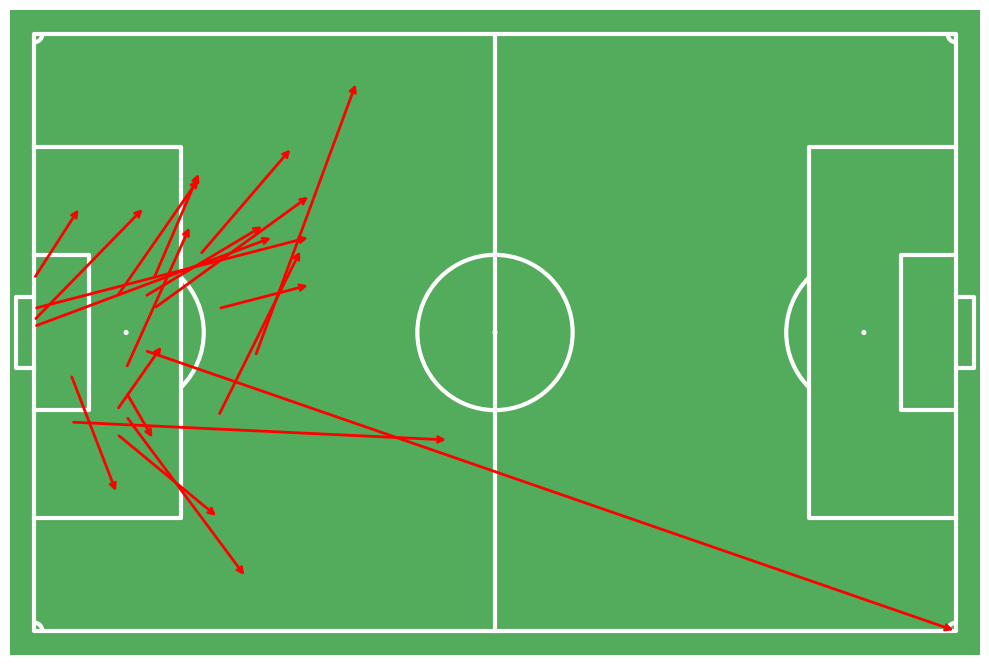

Total passes: 243, Left passes: 105, Right passes: 138
Total passes:  243
Left passes:  105
Right passes:  138


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\246901810.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["matchPeriod"] = df["matchPeriod"].apply(lambda x: 1 if x == "1H" else 2)


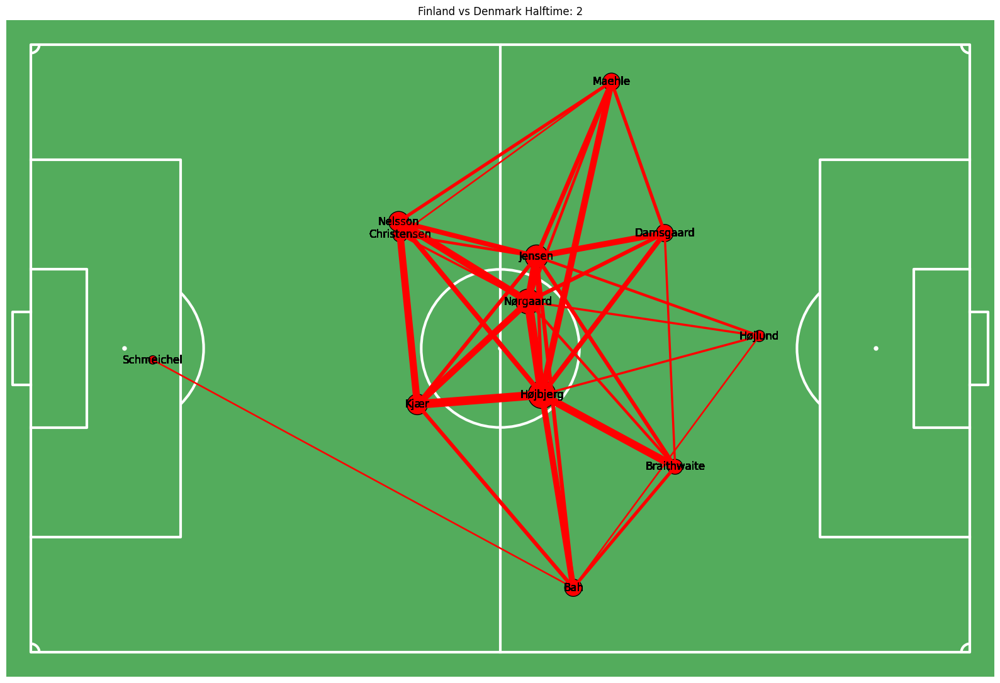

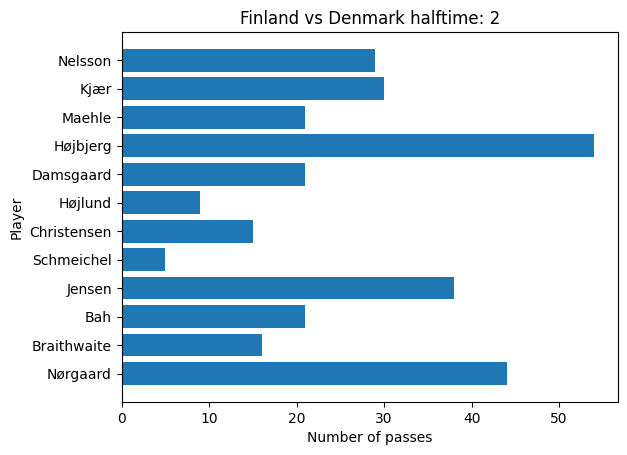

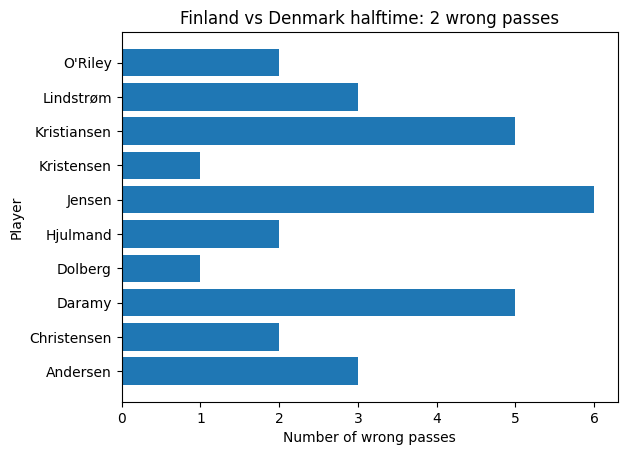

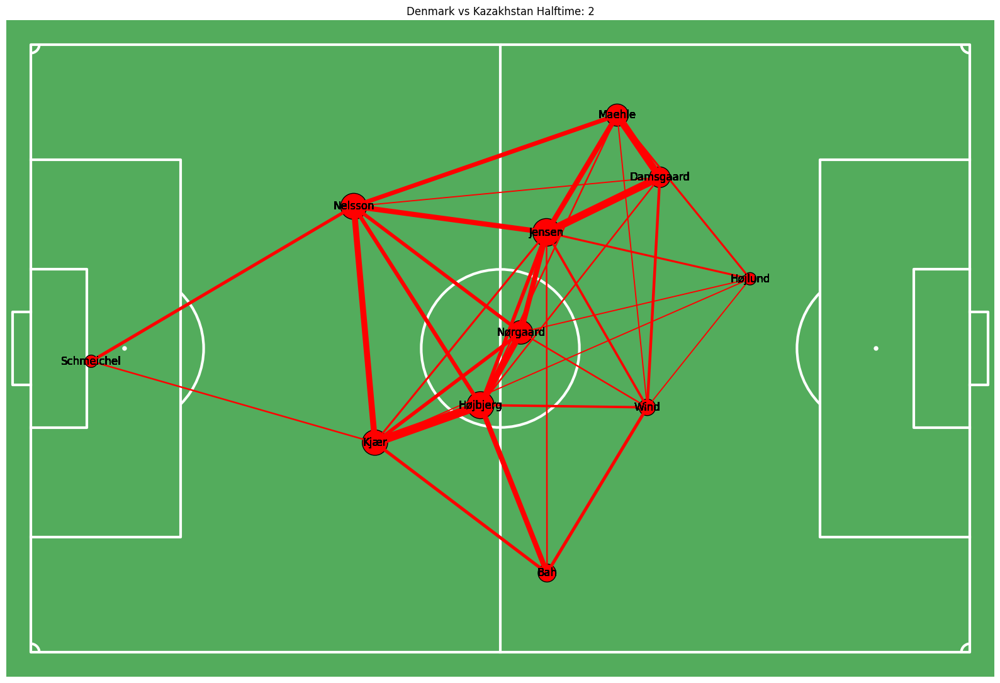

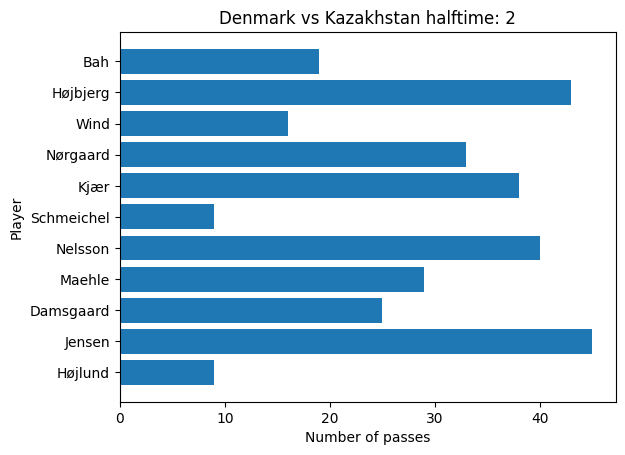

...

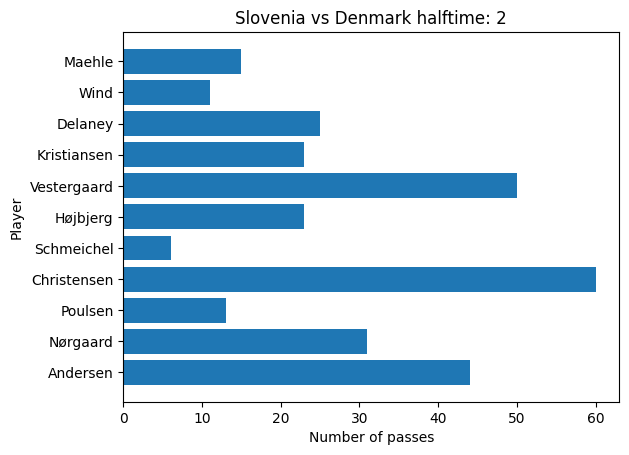

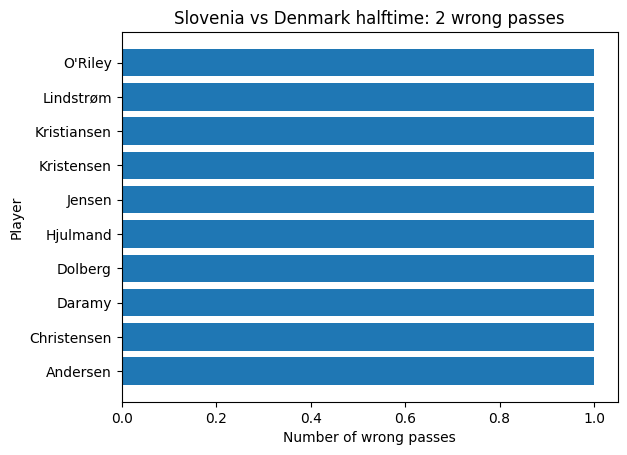

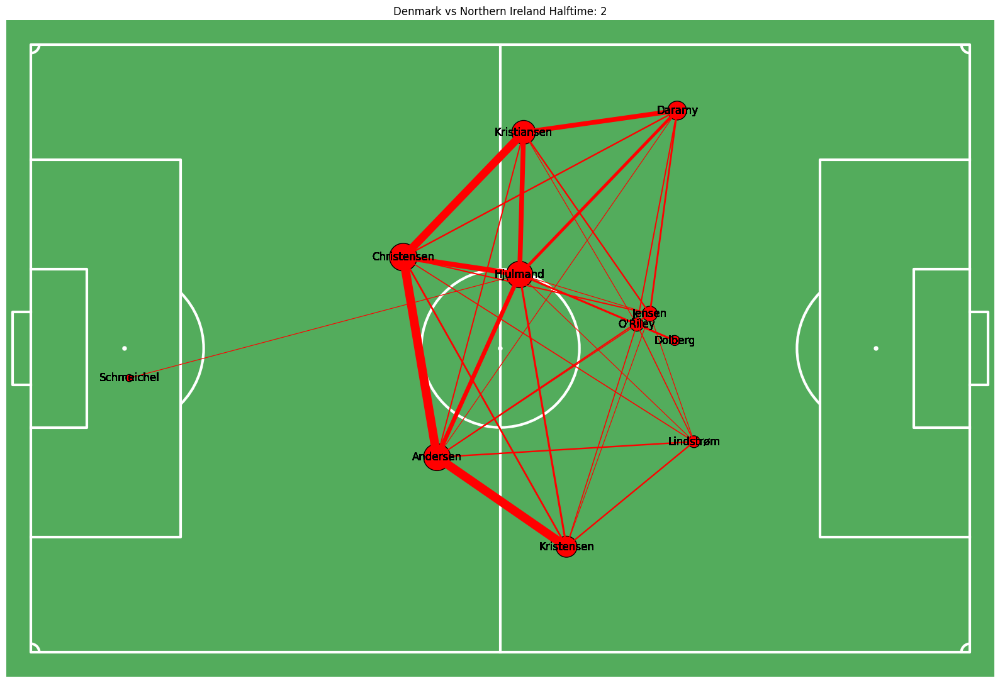

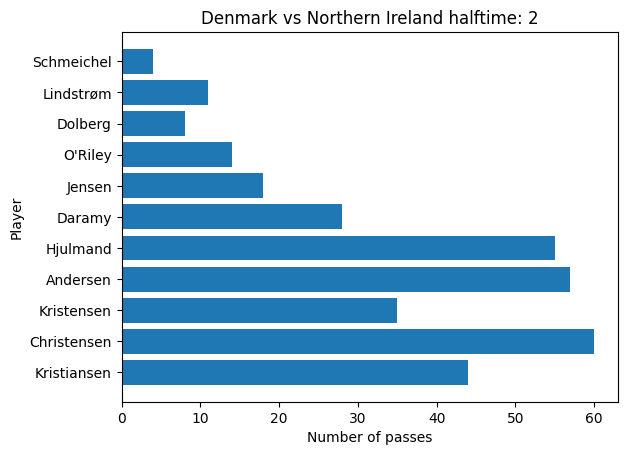

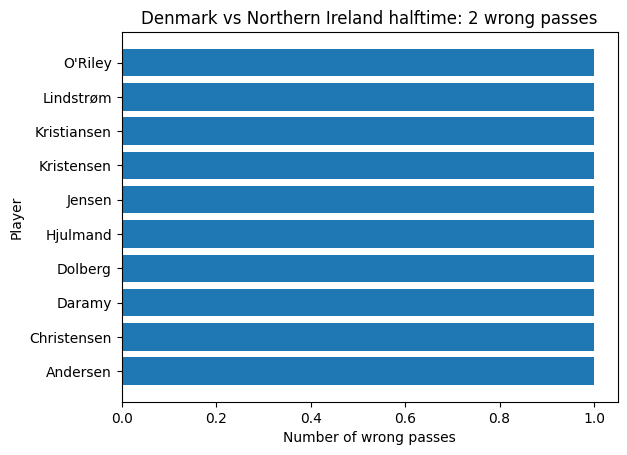

In [90]:

current_directory = Path.cwd()
current_directory = current_directory.parents[0]

teams = [ 'Denmark'] #teams to investigate




for team in teams:
    all_failed_df = list()
    all_succesfull_df = list()

    data_dir = os.path.join(current_directory,'data',f'{team}_games')
    data_dir = Path(data_dir)
    if not os.path.exists(data_dir):
        os.makedirs(data_dir)
    data_dir = Path(data_dir)

    data_path= os.path.join(current_directory,'data')
    wyscout_path = os.path.join(data_path,'wyscout')
    input_dir = os.path.join(data_path,'skillcorner')
    match_id_path = os.path.join(data_path,'matchids.csv')

    match_id = pd.read_csv(match_id_path)
    team_match = match_id[(match_id['home'] == team) | (match_id['away'] == team)]
    team_match_ids_wyscout = team_match['wyscout'].values

    
    for halftime in range(1,3):
        succesfull_df, failed_df, org_df = passes_visualization_halftime(team_match, wyscout_path, halftime, current_directory=current_directory, team = team)
        all_failed_df.append(failed_df)
        all_succesfull_df.append(succesfull_df)
    #get the all_failed_passes_df that were stored in the all_failed_df list

    for df in all_failed_df:
        all_failed_passes_df = pd.concat(df, ignore_index=True)
    for df in all_succesfull_df:
        all_succesfull_passes_df = pd.concat(df, ignore_index=True)
    








In [61]:
org_df["type.primary"].unique()

array(['pass', 'duel', 'interception', 'touch', 'game_interruption',
       'throw_in', 'infraction', 'free_kick', 'clearance', 'corner',
       'acceleration', 'shot', 'goal_kick', 'offside', 'shot_against',
       'fairplay', 'goalkeeper_exit'], dtype=object)

In [62]:
#find the goal:
mask = org_df["shot.isGoal"] == True
#recursively find the last passes that lead to the goal
end_point_goals = org_df[mask].index
end_point = end_point_goals[0]
goal_df = org_df.iloc[:end_point+1]
#team that scored the goal
team_scored = goal_df["possession.team.name"].unique()[0]

#select from the end where the goal_df["possession.team.name"] is not anymore  team_scored
start_point_mask = goal_df["possession.team.name"] != team_scored
start_point = goal_df[start_point_mask].index[-1]

                      

In [63]:
goal_df = org_df.iloc[start_point+1:end_point+1]
#TODO: Needs better start point as there is a normalizing error present see: the columns possesion.endlocation etc. shift if i dont use +1


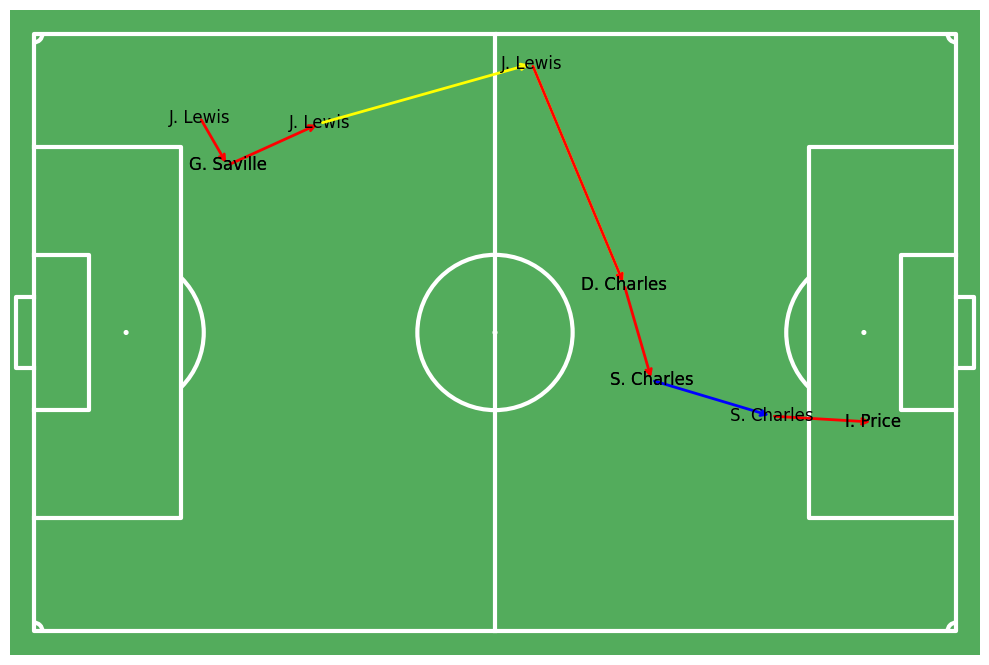

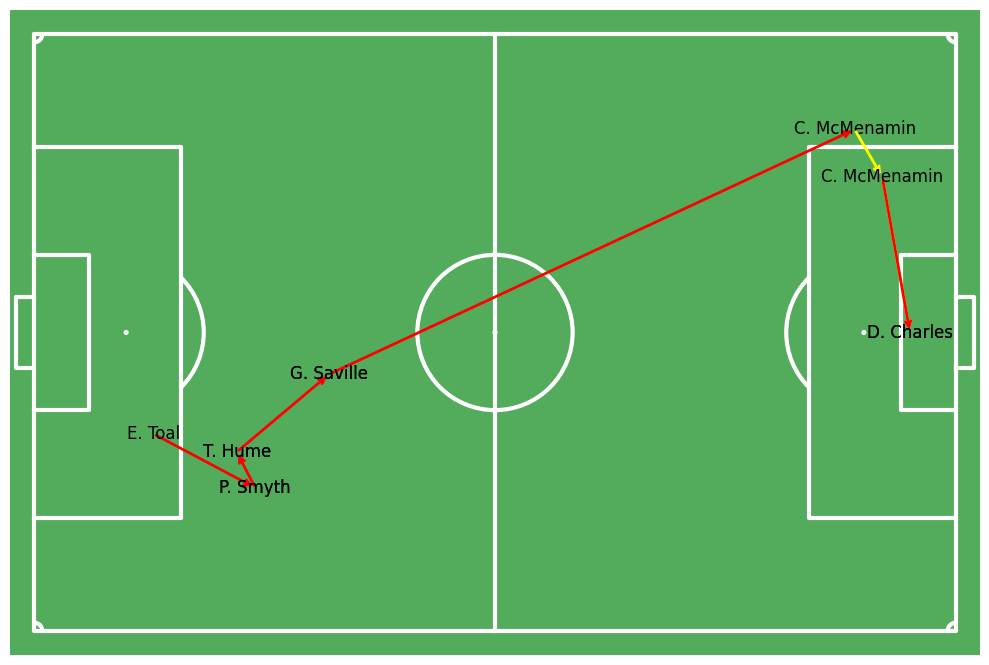

In [64]:
visualize_goal_sequence(org_df)

Northern Ireland
Northern Ireland


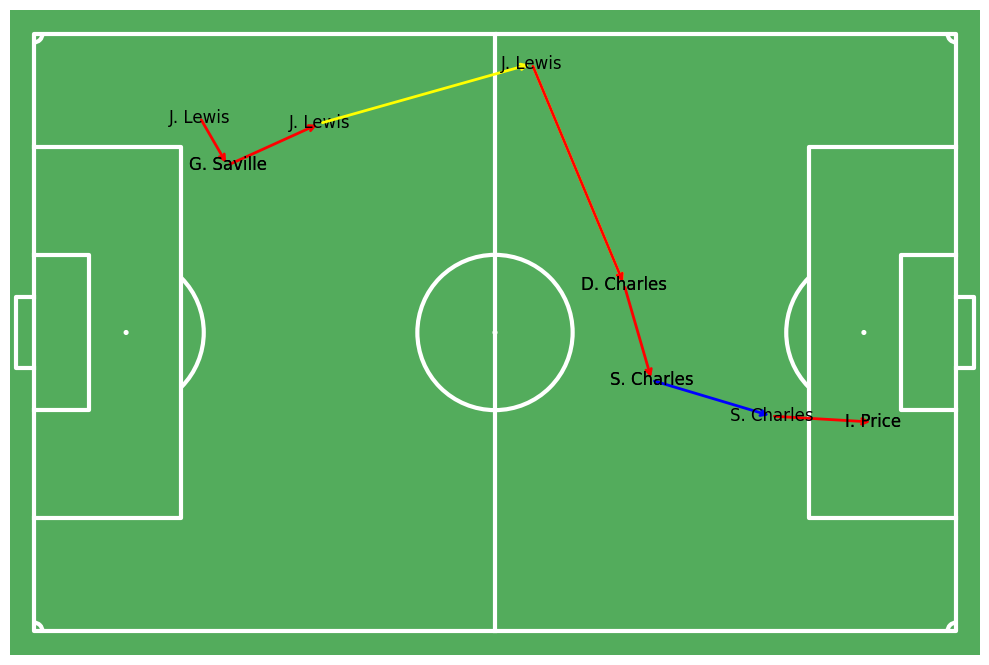

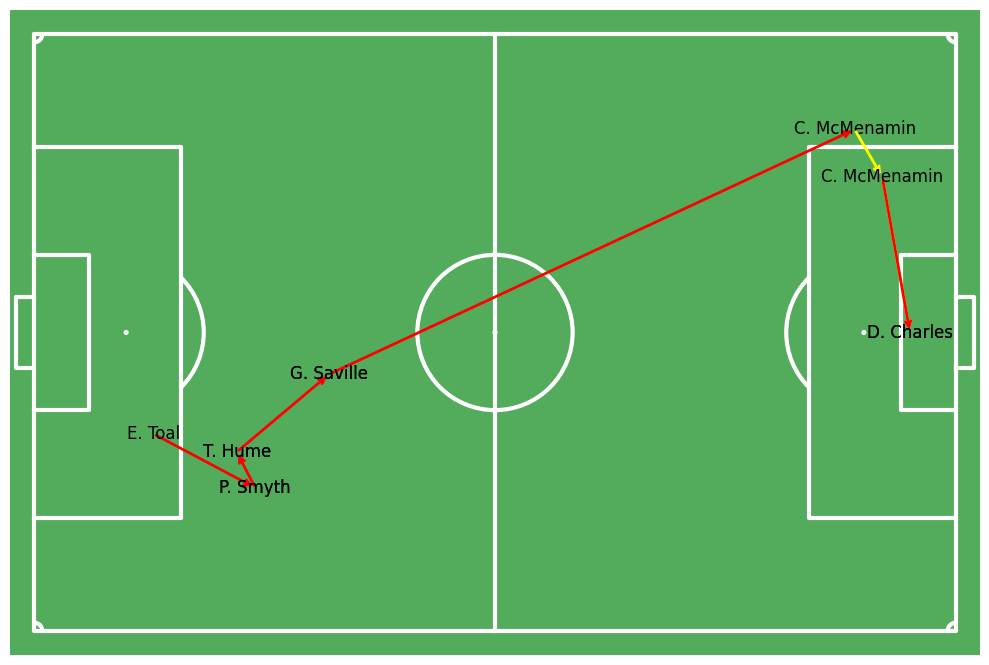

In [65]:
#find the goal:
mask = org_df["shot.isGoal"] == True
#recursively find the last passes that lead to the goal
end_point_goals = org_df[mask].index

for point in end_point_goals:
    end_point = point
    goal_df = org_df.iloc[:end_point+1]


    print(org_df.iloc[end_point]["possession.team.name"])

    #team that scored the goal


    team_scored = org_df.iloc[end_point]["possession.team.name"]

    #select from the end where the goal_df["possession.team.name"] is not anymore  team_scored
    start_point_mask = goal_df["possession.team.name"] != team_scored
    start_point = goal_df[start_point_mask].index[-1]

    goal_df = org_df.iloc[start_point+1:end_point+1]
    #TODO: Needs better start point as there is a normalizing error present see: the columns possesion.endlocation etc. shift if i dont use +1

    #visualize the passing network that lead to the goal from the wyscout data
    pitch = Pitch(pitch_type='wyscout', goal_type='box', pitch_color='#53ac5c',
                                line_color='white', linewidth=3, corner_arcs=True)
    fig, ax = pitch.draw(figsize=(10, 11))

    index_naive = 0
    #filter either shot or passes
    for row in goal_df.iterrows():
        row = row[1]

        if (row["type.primary"] == "pass") | (row["type.primary"] == "shot"):
            player_name = row["player.name"]
            rec_name = row["pass.recipient.name"]
            x_loc = row["location.x"]
            y_loc = row["location.y"]
            x_end_loc = row["pass.endLocation.x"]
            y_end_loc = row["pass.endLocation.y"]
            pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='red', lw=2), ax=ax, zorder=2)
            pitch.annotate(player_name , xy=(x_loc, y_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)
            pitch.annotate(rec_name, xy=(x_end_loc, y_end_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)
        
        elif (row["type.primary"]== "touch") :
            x_loc = x_end_loc
            y_loc = y_end_loc
            next_row = goal_df.iloc[index_naive+1]
            x_end_loc = next_row["location.x"]
            y_end_loc = next_row["location.y"]
            pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='blue', lw=2), ax=ax, zorder=2)
            pitch.annotate(rec_name , xy=(x_loc, y_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)
        
        elif row["type.primary"]== "duel":
            next_row = goal_df.iloc[index_naive+2] #skip two rows as he has to win the ball
            x_loc = x_end_loc
            y_loc = y_end_loc
            x_end_loc = next_row["location.x"]
            y_end_loc = next_row["location.y"]
            pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='yellow', lw=2), ax=ax, zorder=2)
            #pitch.annotate(rec_name , xy=(x_loc, y_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)
        elif row["type.primary"] == "shot":
            player_name = row["player.name"]
            x_loc = row["location.x"]
            y_loc = row["location.y"]
            pitch.scatter(x_loc, y_loc, ax=ax, color='black', zorder=2, s=100)
            pitch.annotate(player_name, xy=(x_loc, y_loc), ax=ax, fontsize=12, ha='center', va='center', zorder=2)

        index_naive += 1

In [66]:
org_df.iloc[0:9]

,id,matchId,matchPeriod,minute,second,matchTimestamp,videoTimestamp,relatedEventId,shot,groundDuel,aerialDuel,infraction,carry,type.primary,type.secondary,location.x,location.y,team.id,team.name,team.formation,opponentTeam.id,opponentTeam.name,opponentTeam.formation,player.id,player.name,player.position,pass.accurate,pass.angle,pass.height,pass.length,pass.recipient.id,pass.recipient.name,pass.recipient.position,pass.endLocation.x,pass.endLocation.y,possession.id,possession.duration,possession.types,possession.eventsNumber,possession.eventIndex,possession.startLocation.x,possession.startLocation.y,possession.endLocation.x,possession.endLocation.y,possession.team.id,possession.team.name,possession.team.formation,possession.attack,pass,aerialDuel.opponent.id,aerialDuel.opponent.name,aerialDuel.opponent.position,aerialDuel.opponent.height,aerialDuel.firstTouch,aerialDuel.height,aerialDuel.relatedDuelId,groundDuel.opponent.id,groundDuel.opponent.name,groundDuel.opponent.position,groundDuel.duelType,groundDuel.keptPossession,groundDuel.progressedWithBall,groundDuel.stoppedProgress,groundDuel.recoveredPossession,groundDuel.takeOn,groundDuel.side,groundDuel.relatedDuelId,carry.progression,carry.endLocation.x,carry.endLocation.y,possession.attack.withShot,possession.attack.withShotOnGoal,possession.attack.withGoal,possession.attack.flank,possession.attack.xg,infraction.yellowCard,infraction.redCard,infraction.type,infraction.opponent.id,infraction.opponent.name,infraction.opponent.position,possession,shot.bodyPart,shot.isGoal,shot.onTarget,shot.goalZone,shot.xg,shot.postShotXg,shot.goalkeeperActionId,shot.goalkeeper,shot.goalkeeper.id,shot.goalkeeper.name,location,infraction.opponent
0,1844151524,5414323,1H,0,3,00:00:03.073,5.07315,1.844152e+09,NaN,NaN,NaN,NaN,NaN,pass,"[back_pass, short_or_medium_pass]",50.0,50.0,10962,Northern Ireland,5-4-1,7712,Denmark,4-3-3,345877,C. Hazard,GK,True,174.0,None,8.0,235556.0,G. Saville,LCMF,42.0,51.0,1.844152e+09,15.0498,[],8.0,0.0,50.0,50.0,83.0,78.0,10962.0,Northern Ireland,5-4-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1844151526,5414323,1H,0,4,00:00:04.882,6.882676,1.844152e+09,NaN,NaN,NaN,NaN,NaN,pass,"[lateral_pass, short_or_medium_pass]",42.0,51.0,10962,Northern Ireland,5-4-1,7712,Denmark,4-3-3,235556,G. Saville,LCMF,True,-79.0,None,30.0,424246.0,J. Lewis,LB5,48.0,8.0,1.844152e+09,15.0498,[],8.0,1.0,50.0,50.0,83.0,78.0,10962.0,Northern Ireland,5-4-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1844151528,5414323,1H,0,7,00:00:07.878,9.878892,1.844152e+09,NaN,NaN,NaN,NaN,NaN,pass,"[back_pass, short_or_medium_pass]",48.0,8.0,10962,Northern Ireland,5-4-1,7712,Denmark,4-3-3,424246,J. Lewis,LB5,True,135.0,None,21.0,446711.0,C. Brown,LCB3,33.0,29.0,1.844152e+09,15.0498,[],8.0,2.0,50.0,50.0,83.0,78.0,10962.0,Northern Ireland,5-4-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1844151529,5414323,1H,0,10,00:00:10.204,12.204876,1.844152e+09,NaN,NaN,NaN,NaN,NaN,pass,"[lateral_pass, short_or_medium_pass]",33.0,29.0,10962,Northern Ireland,5-4-1,7712,Denmark,4-3-3,446711,C. Brown,LCB3,True,114.0,None,17.0,136704.0,P. McNair,CB,27.0,53.0,1.844152e+09,15.0498,[],8.0,3.0,50.0,50.0,83.0,78.0,10962.0,Northern Ireland,5-4-1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1844151530,5414323,1H,0,12,00:00:12.855,14.8556,1.844152e+09,NaN,NaN,NaN,NaN,NaN,pass,"[forward_pass, long_pass, progressive_pass]",27.0,53.0,10962,Northern Ireland,5-4-1,7712,D

In [67]:
interception_mask = org_df["type.primary"] == "interception"
interception_df = org_df[interception_mask]


In [68]:
interception_df

,id,matchId,matchPeriod,minute,second,matchTimestamp,videoTimestamp,relatedEventId,shot,groundDuel,aerialDuel,infraction,carry,type.primary,type.secondary,location.x,location.y,team.id,team.name,team.formation,opponentTeam.id,opponentTeam.name,opponentTeam.formation,player.id,player.name,player.position,pass.accurate,pass.angle,pass.height,pass.length,pass.recipient.id,pass.recipient.name,pass.recipient.position,pass.endLocation.x,pass.endLocation.y,possession.id,possession.duration,possession.types,possession.eventsNumber,possession.eventIndex,possession.startLocation.x,possession.startLocation.y,possession.endLocation.x,possession.endLocation.y,possession.team.id,possession.team.name,possession.team.formation,possession.attack,pass,aerialDuel.opponent.id,aerialDuel.opponent.name,aerialDuel.opponent.position,aerialDuel.opponent.height,aerialDuel.firstTouch,aerialDuel.height,aerialDuel.relatedDuelId,groundDuel.opponent.id,groundDuel.opponent.name,groundDuel.opponent.position,groundDuel.duelType,groundDuel.keptPossession,groundDuel.progressedWithBall,groundDuel.stoppedProgress,groundDuel.recoveredPossession,groundDuel.takeOn,groundDuel.side,groundDuel.relatedDuelId,carry.progression,carry.endLocation.x,carry.endLocation.y,possession.attack.withShot,possession.attack.withShotOnGoal,possession.attack.withGoal,possession.attack.flank,possession.attack.xg,infraction.yellowCard,infraction.redCard,infraction.type,infraction.opponent.id,infraction.opponent.name,infraction.opponent.position,possession,shot.bodyPart,shot.isGoal,shot.onTarget,shot.goalZone,shot.xg,shot.postShotXg,shot.goalkeeperActionId,shot.goalkeeper,shot.goalkeeper.id,shot.goalkeeper.name,location,infraction.opponent
9,1844151538,5414323,1H,0,20,00:00:20.094,22.094172,1.844152e+09,NaN,NaN,NaN,NaN,NaN,interception,[],10.0,43.0,7712,Denmark,4-3-3,10962,Northern Ireland,5-4-1,400352,R. Kristensen,RB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.844154e+09,5.9019875,[transition_low],5.0,1.0,17.0,22.0,13.0,5.0,7712.0,Denmark,4-3-3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,1844151592,5414323,1H,2,32,00:02:32.094,154.09493,1.844152e+09,NaN,NaN,NaN,NaN,NaN,interception,[],3.0,66.0,7712,Denmark,4-3-3,10962,Northern Ireland,5-4-1,281254,K. Dolberg,CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.844152e+09,9.698081,[transition_low],5.0,0.0,3.0,66.0,46.0,80.0,7712.0,Denmark,4-3-3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61,1844151644,5414323,1H,3,8,00:03:08.060,190.060374,1.844152e+09,NaN,NaN,NaN,NaN,NaN,interception,"[head_pass, lateral_pass, pass, recovery, coun...",46.0,55.0,7712,Denmark,4-3-3,10962,Northern Ireland,5-4-1,400352,R. Kristensen,RB,True,51.0,high,19.0,480608.0,M. O'Riley,RCMF3,57.0,77.0,1.844152e+09,54.6980325,[attack],26.0,7.0,59.0,32.0,67.0,0.0,7712.0,Denmark,4-3-3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,left,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
144,1844151597,5414323,1H,6,28,00:06:28.409,390.409728,1.844152e+09,NaN,NaN,NaN,NaN,NaN,interception,"[loss, recovery]",18.0,93.0,10962,Northern Ireland,5-4-1,7712,Denmark,4-3-3,578843,T. Hume,RB5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.844152e+09,42.4583705,"[attack, throw_in]",26.0,18.0,59.0,0.0,93.0,51.0,7712.0,Denmark,4-3-3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,left,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
176,1844151789,5414323,1H,8,51,00:08:51.149,533.149236,1.844152e+09,NaN,NaN,NaN,NaN,NaN,interception,"[head_pass, loss]",10.0,45.0,7712,Denmark,4-3-3,10962,Northern Ireland,5-4-1,361163,M. Jensen,LCMF3,NaN,NaN,NaN,NaN,Na

In [69]:
passes_goalie_df = org_df[(org_df["player.position"] == "GK") & (org_df["team.name"] == "Denmark")]
passes_goalie_df = passes_goalie_df[(passes_goalie_df["type.primary"] == "pass") | (passes_goalie_df["type.primary"] == "goal_kick")]

In [70]:

def get_goalie_passes(org_df):
    """
    Function to get the passes from the goalie
    """

    passes_goalie_df = org_df[(org_df["player.position"] == "GK") & (org_df["team.name"] == "Denmark")]
    passes_goalie_df = passes_goalie_df[(passes_goalie_df["type.primary"] == "pass") | (passes_goalie_df["type.primary"] == "goal_kick")]
    #visualize all the passes from the goalie
    pitch = Pitch(pitch_type='wyscout', goal_type='box', pitch_color='#53ac5c',
                                line_color='white', linewidth=3, corner_arcs=True)
    fig, ax = pitch.draw(figsize=(10, 11))

    count_passes_left = 0
    total_passes = 0

    for row in passes_goalie_df.iterrows():
        row = row[1]
        player_name = row["player.name"]
        rec_name = row["pass.recipient.name"]
        x_loc = row["location.x"]
        y_loc = row["location.y"]
        x_end_loc = row["pass.endLocation.x"]
        y_end_loc = row["pass.endLocation.y"]
        if y_end_loc > org_df["location.y"].max() //2:
            count_passes_left += 1
        total_passes += 1
        
        
        pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='red', lw=2), ax=ax, zorder=2)

    plt.show()
    return count_passes_left, total_passes



In [71]:
org_df["location.y"].max()

100.0

<BarContainer object of 30 artists>

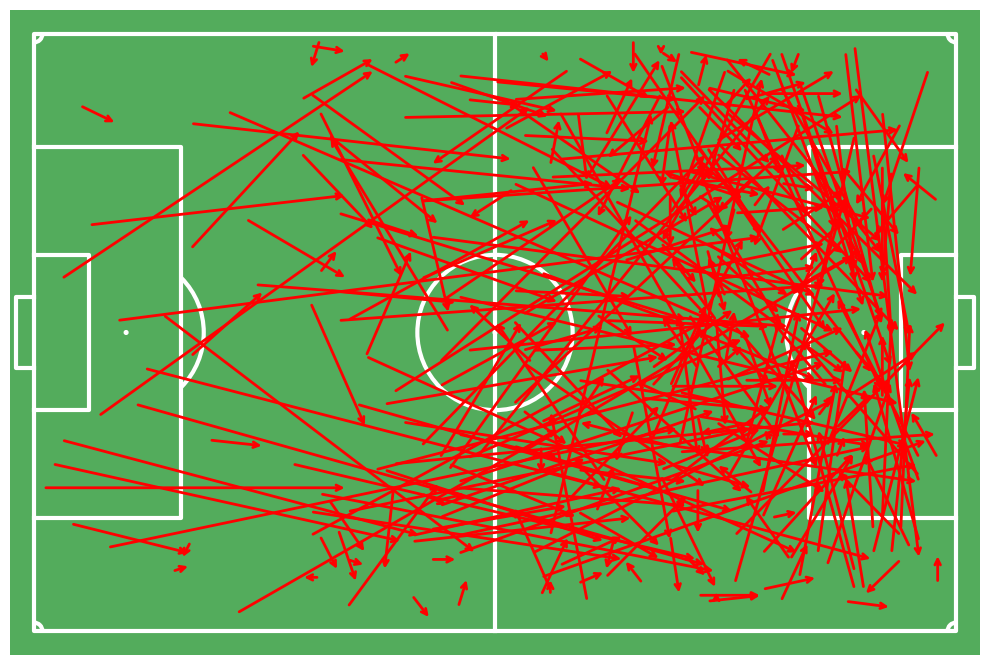

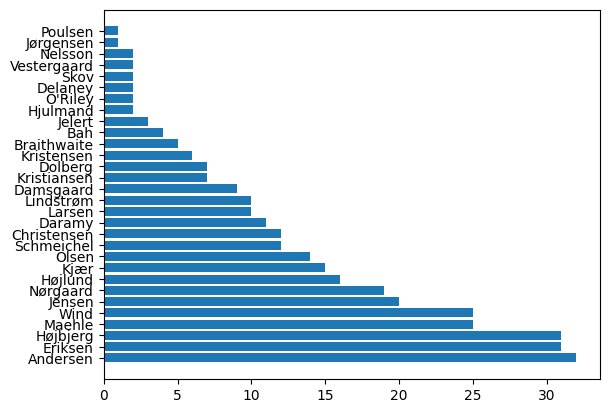

In [97]:
all_failed_passes_df

#visualize all failed passes
pitch = Pitch(pitch_type='wyscout', goal_type='box', pitch_color='#53ac5c',
                            line_color='white', linewidth=3, corner_arcs=True)
fig, ax = pitch.draw(figsize=(10, 11))

for row in all_failed_passes_df.iterrows():
    row = row[1]
    player_name = row["player.name"]
    rec_name = row["pass.recipient.name"]
    x_loc = row["location.x"]
    y_loc = row["location.y"]
    x_end_loc = row["pass.endLocation.x"]
    y_end_loc = row["pass.endLocation.y"]

    pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='red', lw=2), ax=ax, zorder=2)

all_passes_grouped = all_failed_passes_df.groupby("player.name").count().sort_values(by="location.x", ascending=False)
all_passes_succesfull_grouped = all_succesfull_passes_df.groupby("player.name").count().sort_values(by="player.name", ascending=False)
#visualize the number of failed passes per player
fig, ax = plt.subplots()
ax.barh(all_passes_grouped.index, all_passes_grouped["location.x"])



In [100]:
all_succesfull_passes_df
succesfull_series = all_succesfull_passes_df.groupby("player.name").count()["location.x"]
failed_series = all_failed_passes_df.groupby("player.name").count()["location.x"]





In [140]:
all_succesfull_passes_df["player.name"].unique()

array(['Nørgaard', 'Braithwaite', 'Bah', 'Jensen', 'Schmeichel',
       'Christensen', 'Højlund', 'Damsgaard', 'Højbjerg', 'Maehle',
       'Kjær', 'Nelsson', 'Wind', 'Andersen', 'Olsen', 'Eriksen',
       'Jørgensen', 'Larsen', 'Lindstrøm', 'Kristensen', 'Dolberg',
       'Skov', 'Jelert', 'Daramy', 'Poulsen', 'Vestergaard',
       'Kristiansen', 'Delaney', 'Hjulmand', "O'Riley"], dtype=object)

Player: Nørgaard left passes percentage: 50.520833333333336


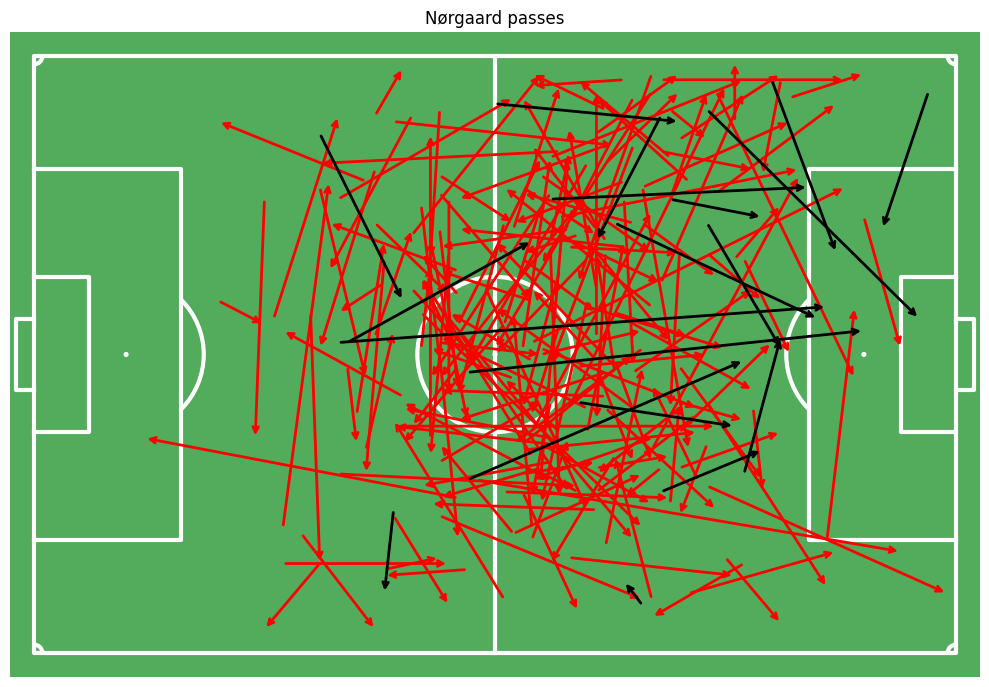

Player: Braithwaite left passes percentage: 60.0


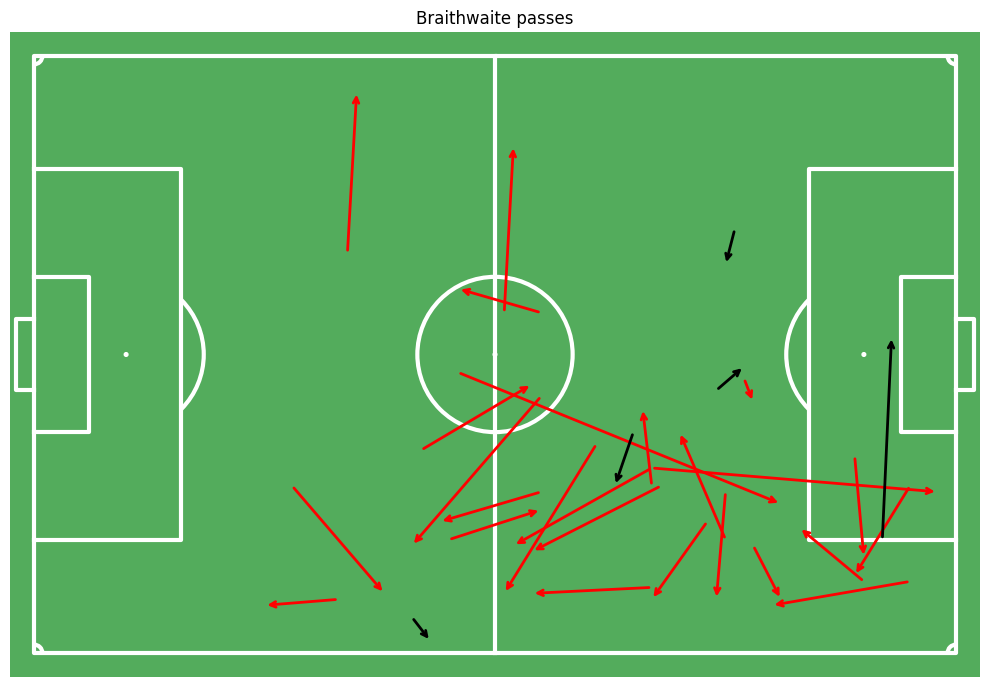

Player: Bah left passes percentage: 64.0


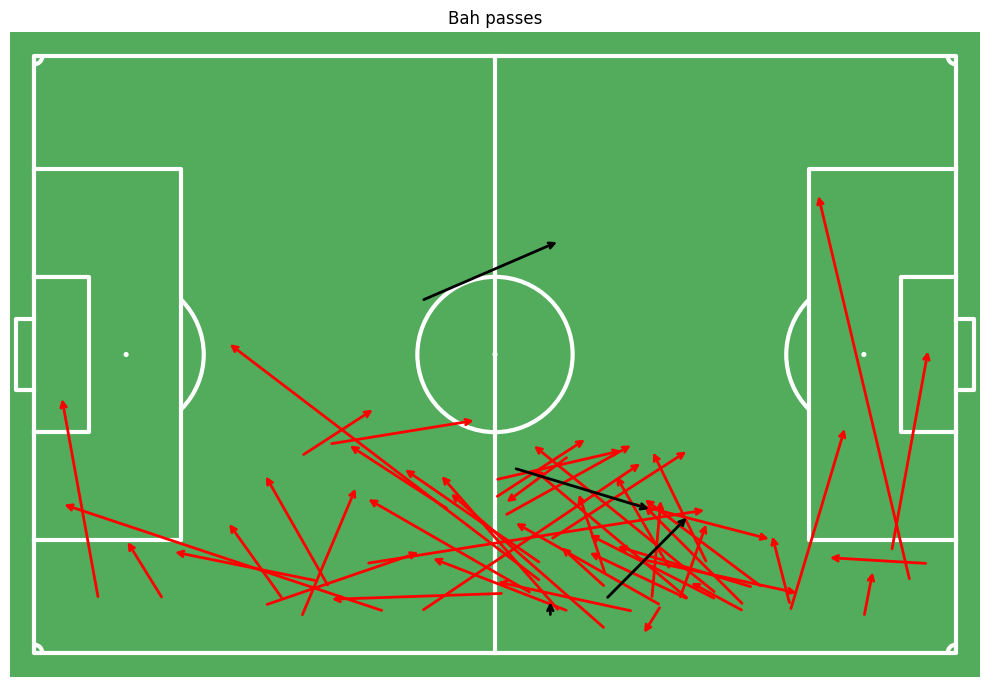

Player: Jensen left passes percentage: 56.00000000000001


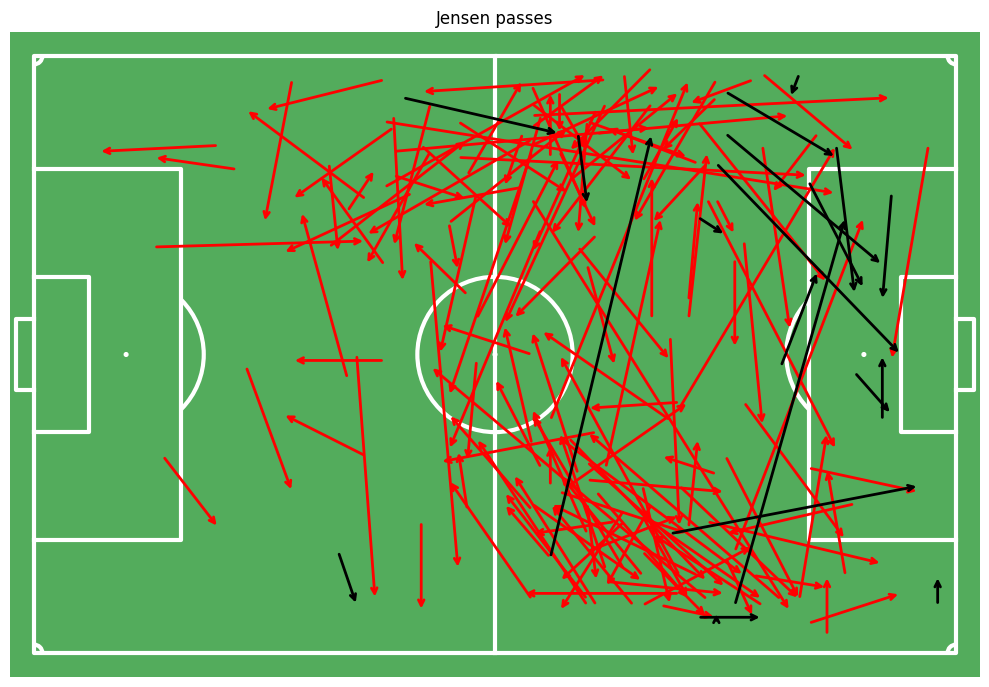

Player: Schmeichel left passes percentage: 60.526315789473685


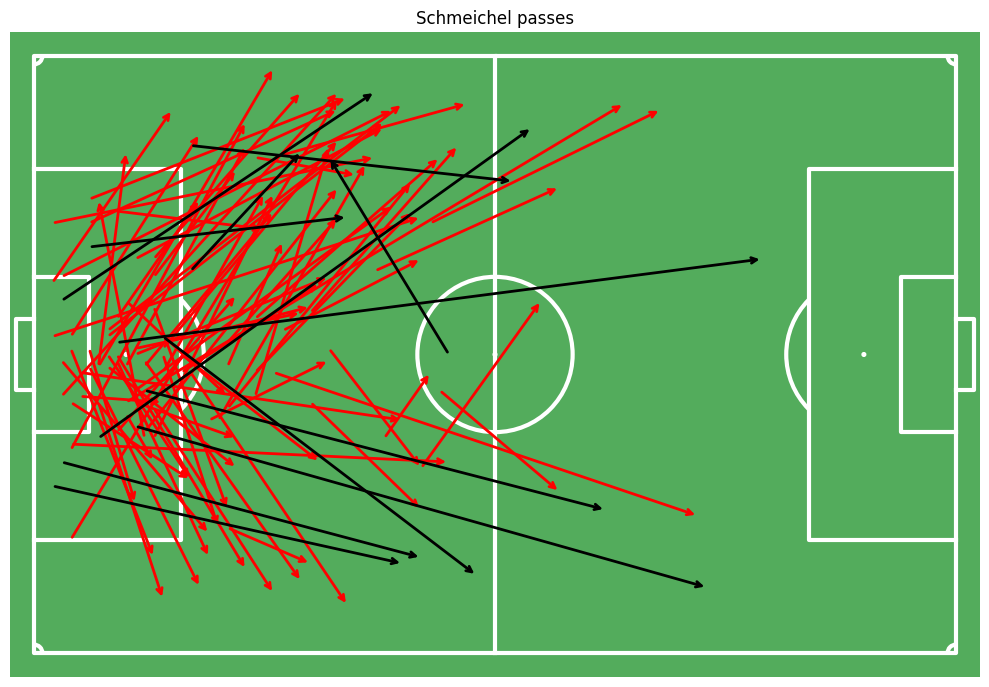

Player: Christensen left passes percentage: 55.8641975308642


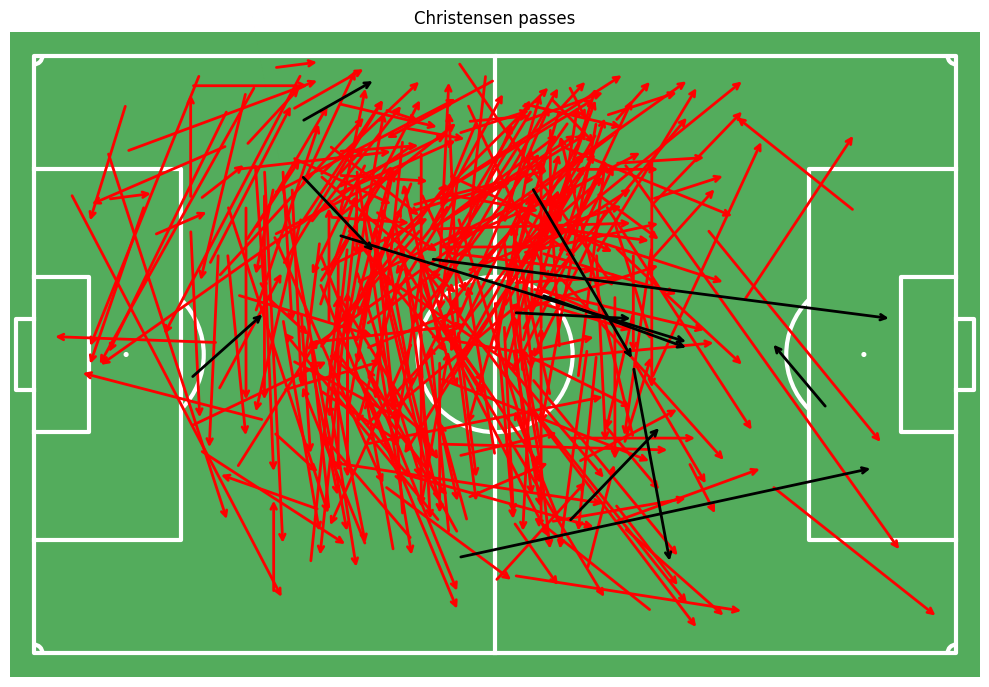

Player: Højlund left passes percentage: 62.22222222222222


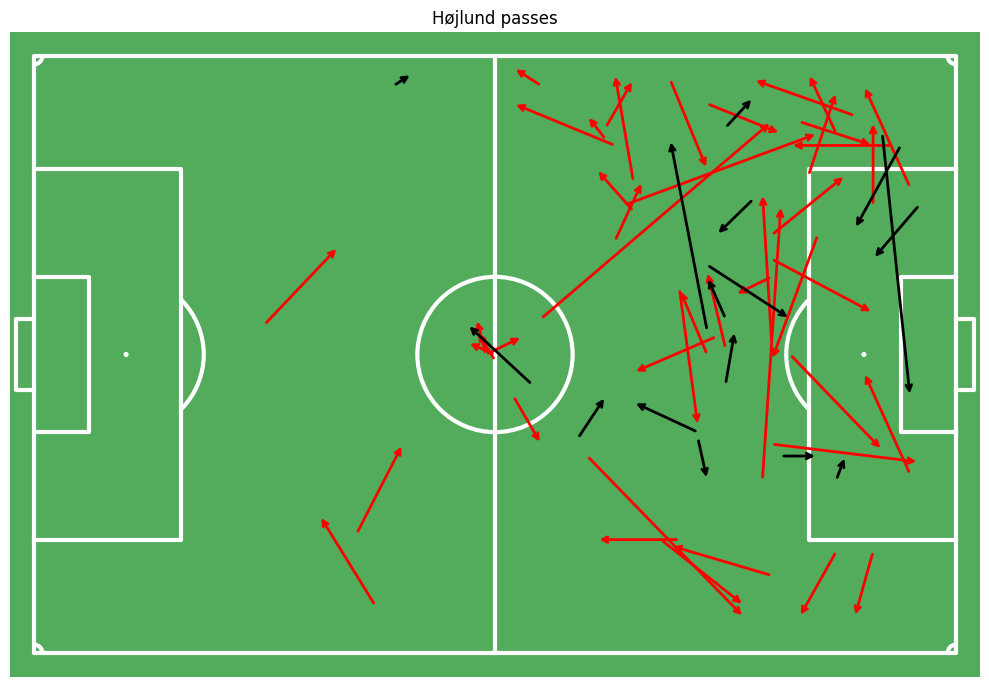

Player: Damsgaard left passes percentage: 58.69565217391305


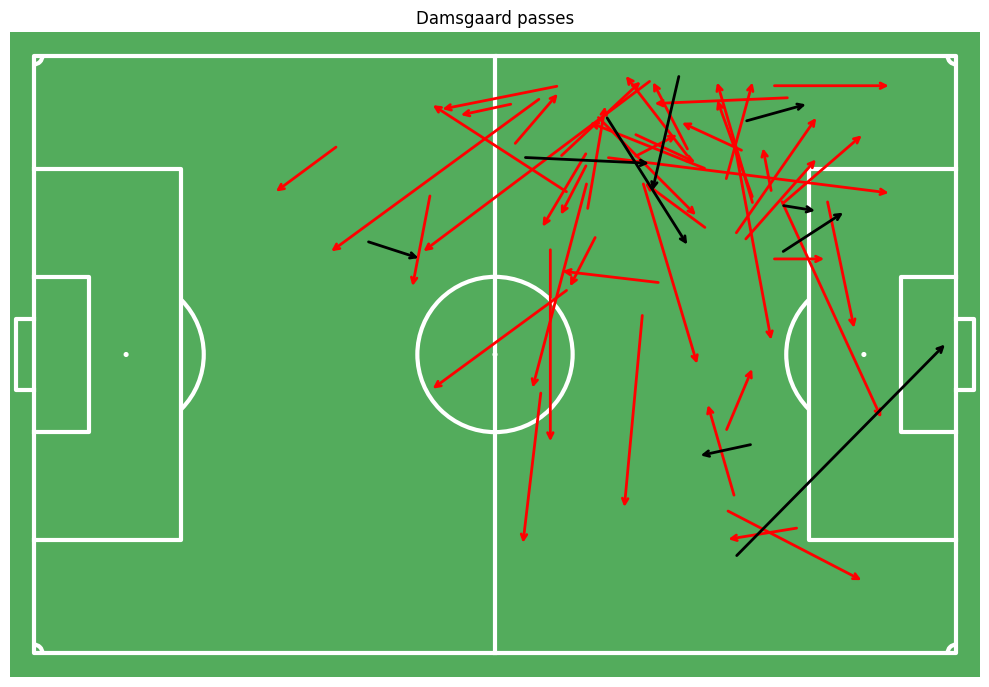

Player: Højbjerg left passes percentage: 53.36927223719676


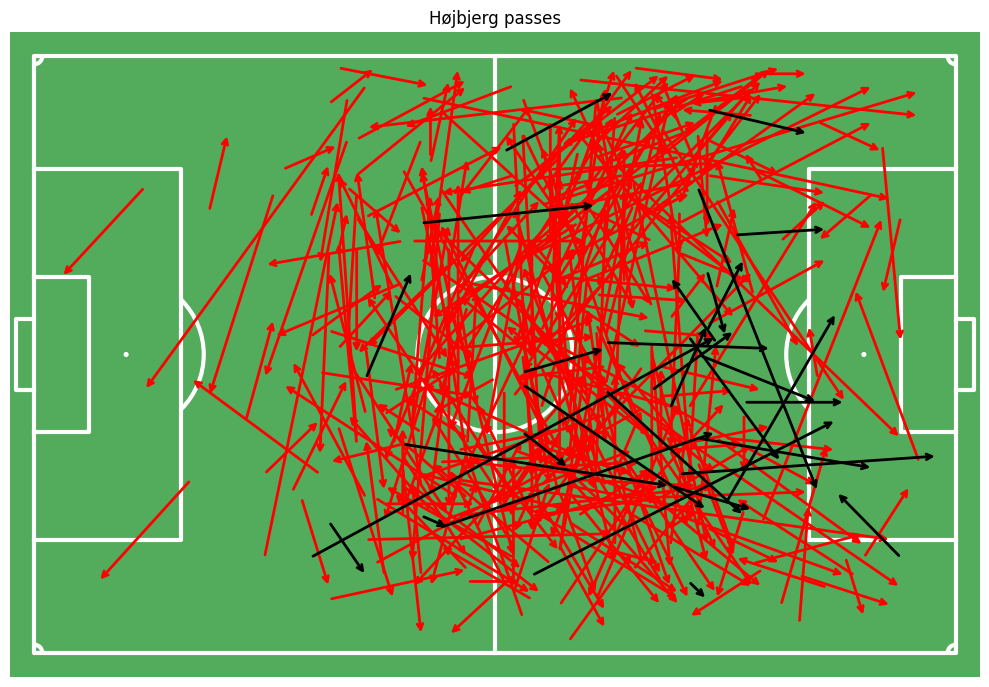

Player: Maehle left passes percentage: 64.25339366515837


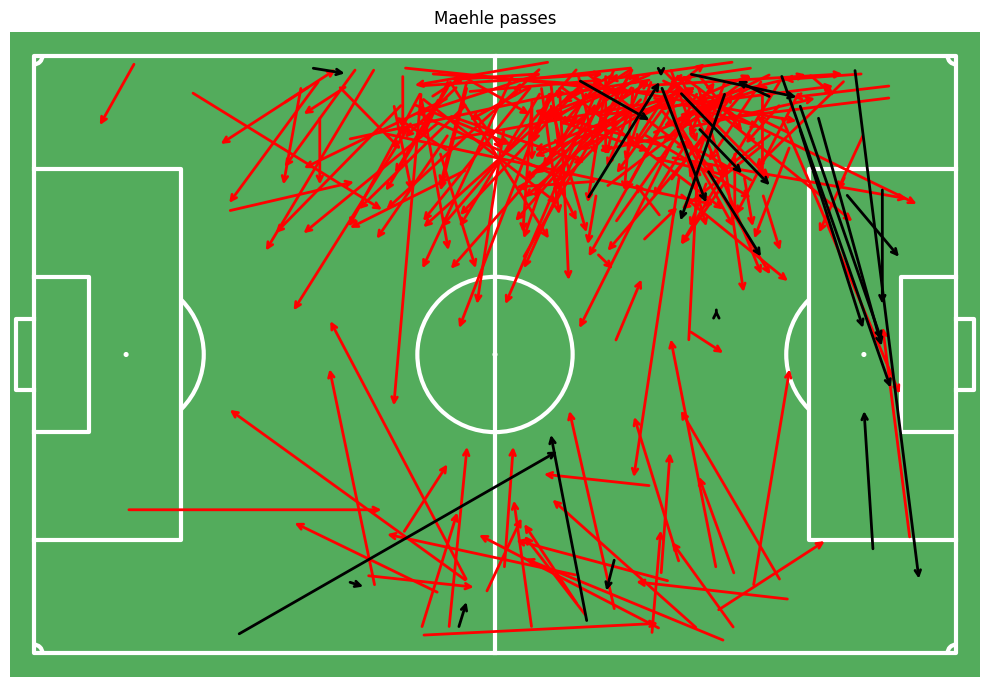

Player: Kjær left passes percentage: 57.35294117647059


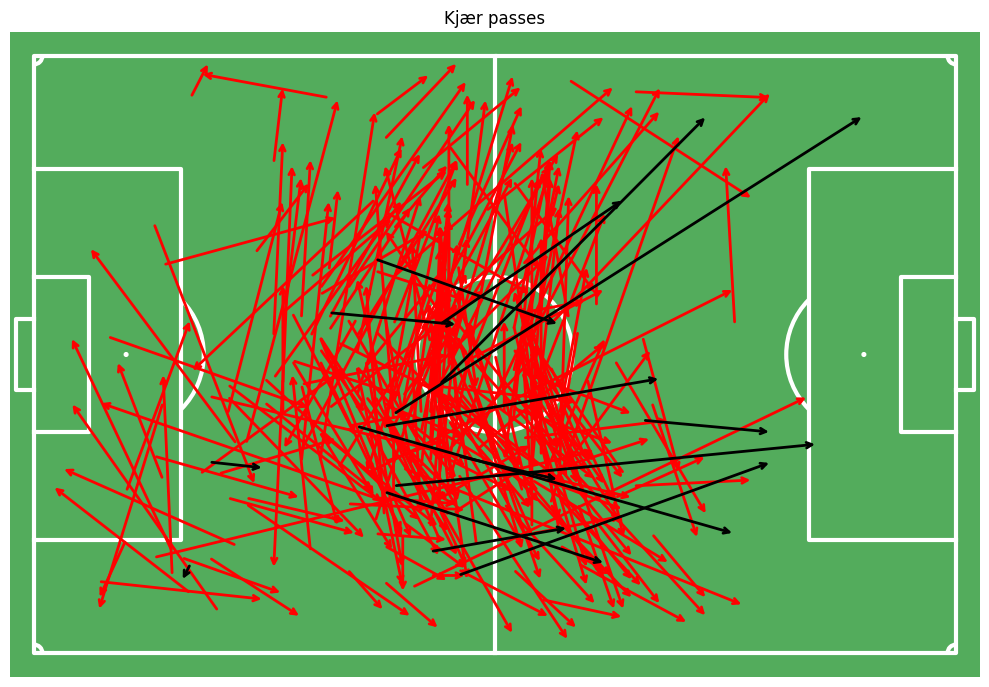

Player: Nelsson left passes percentage: 63.76811594202898


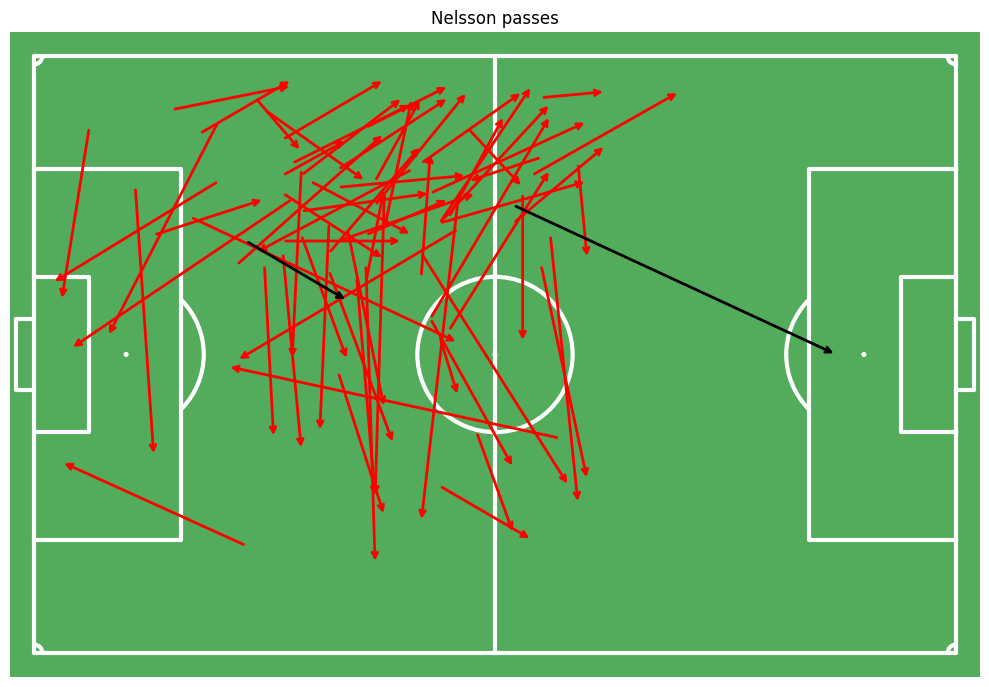

Player: Wind left passes percentage: 53.191489361702125


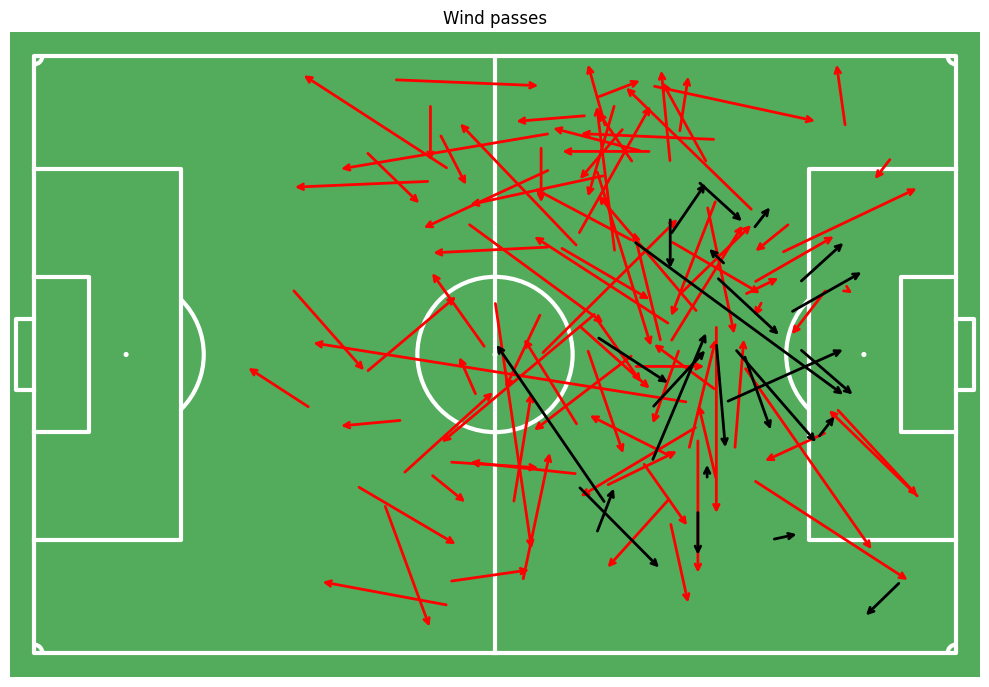

Player: Andersen left passes percentage: 52.29885057471264


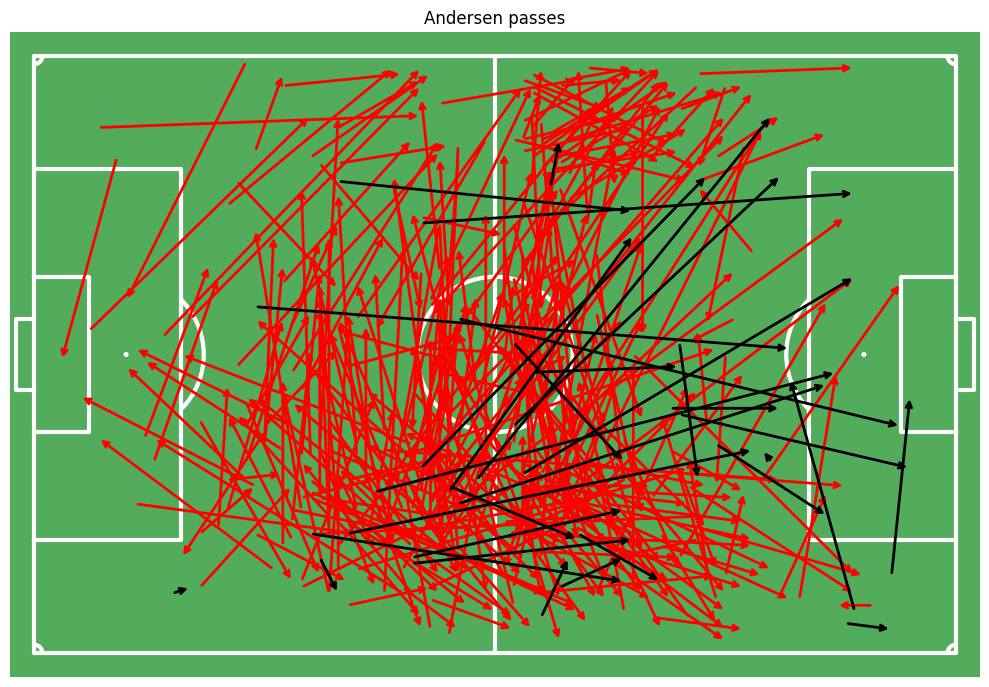

Player: Olsen left passes percentage: 61.42857142857143


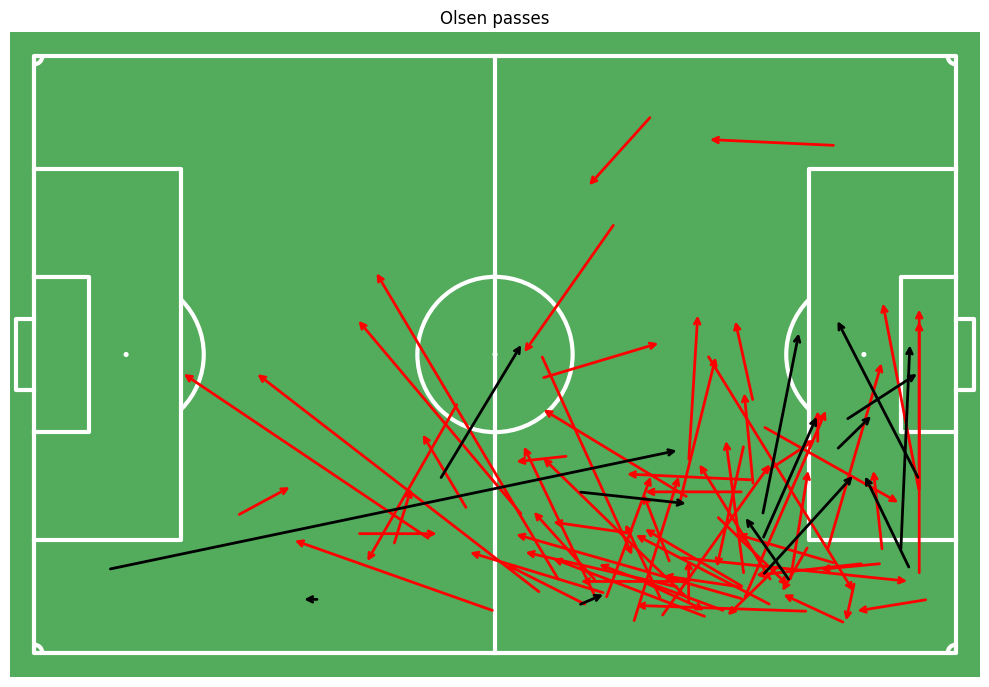

Player: Eriksen left passes percentage: 61.274509803921575


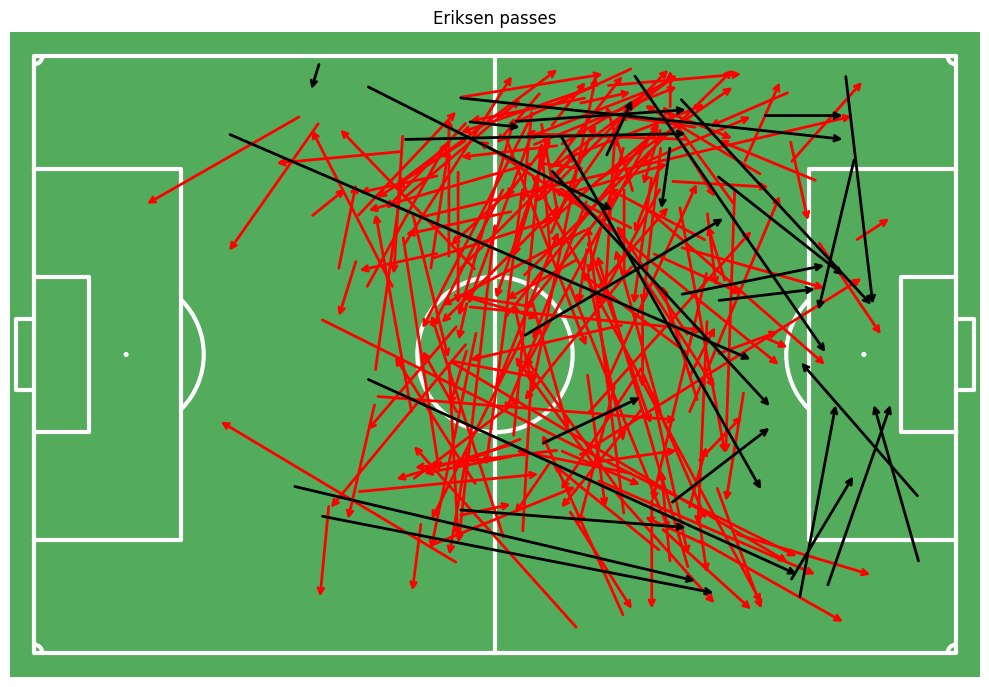

Player: Jørgensen left passes percentage: 71.7948717948718


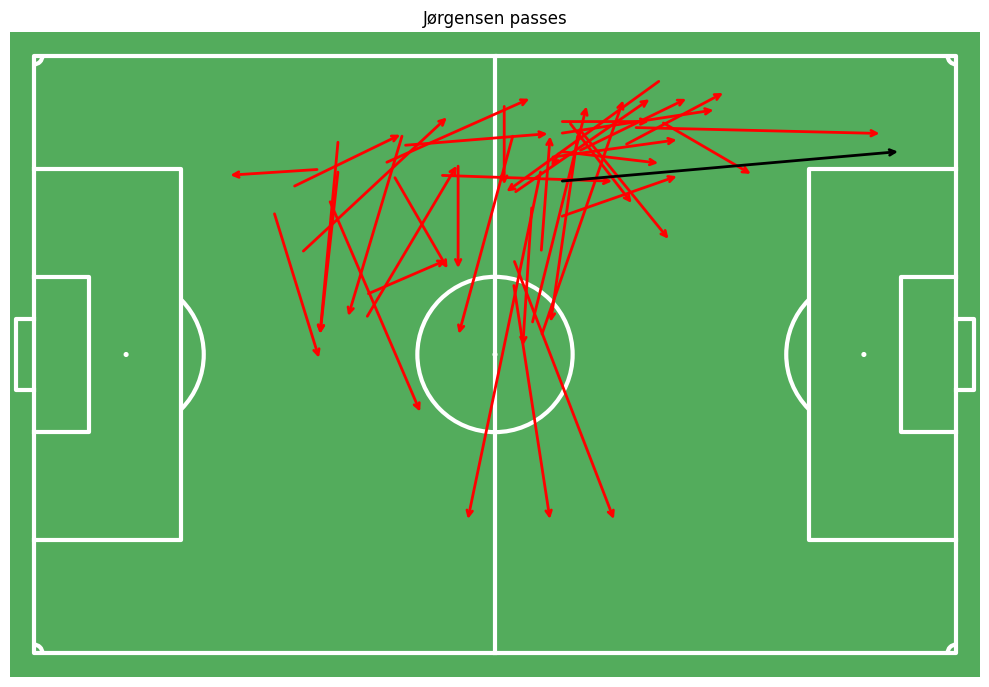

Player: Larsen left passes percentage: 50.877192982456144


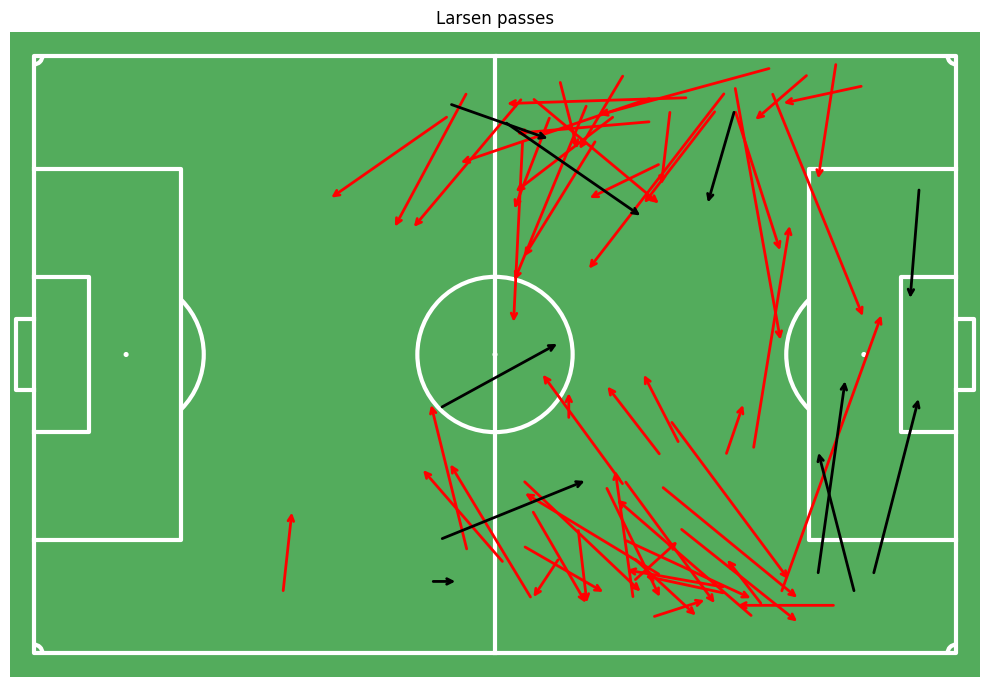

Player: Lindstrøm left passes percentage: 61.904761904761905


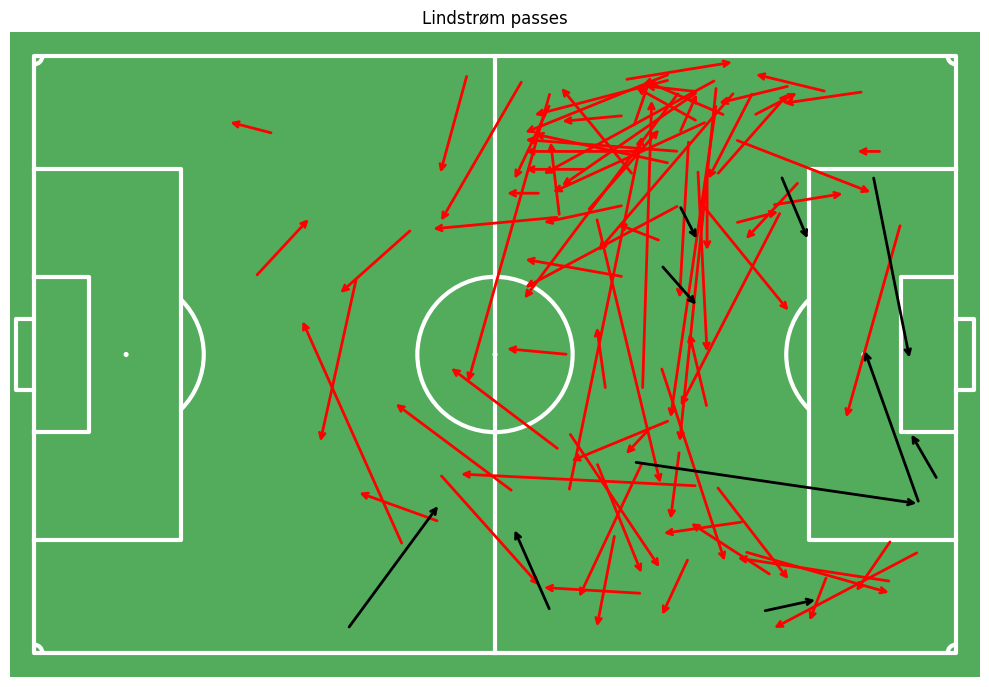

Player: Kristensen left passes percentage: 80.0


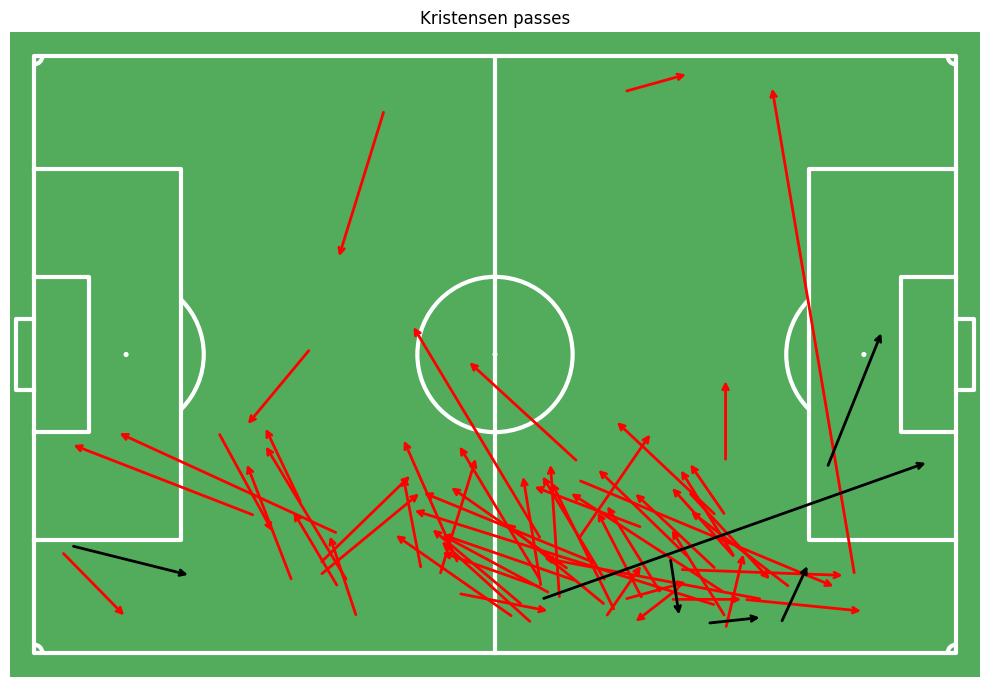

Player: Dolberg left passes percentage: 60.0


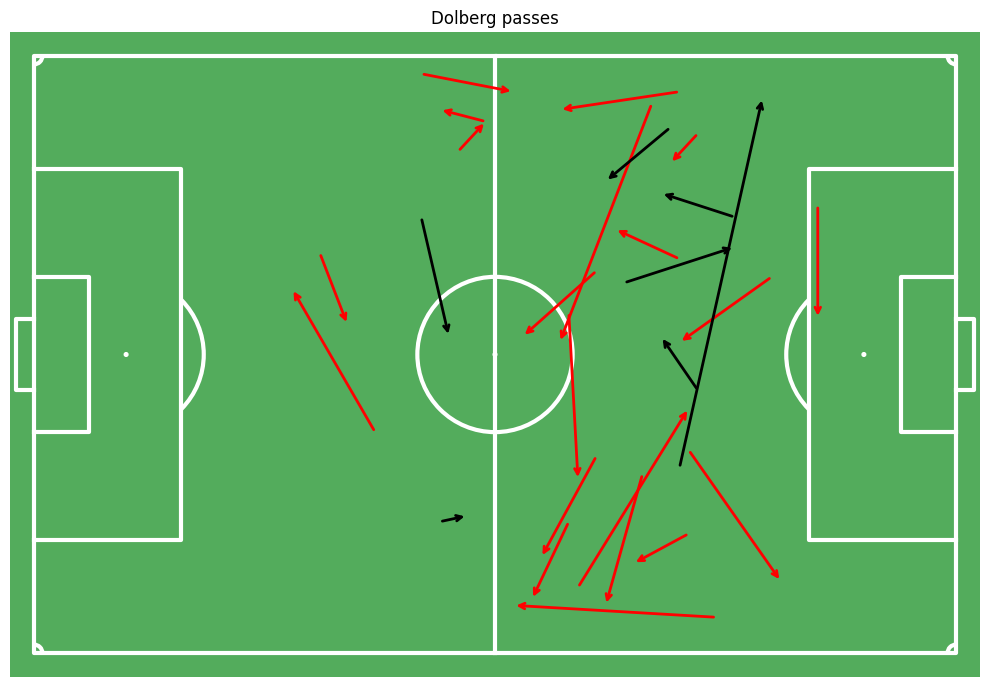

Player: Skov left passes percentage: 61.53846153846154


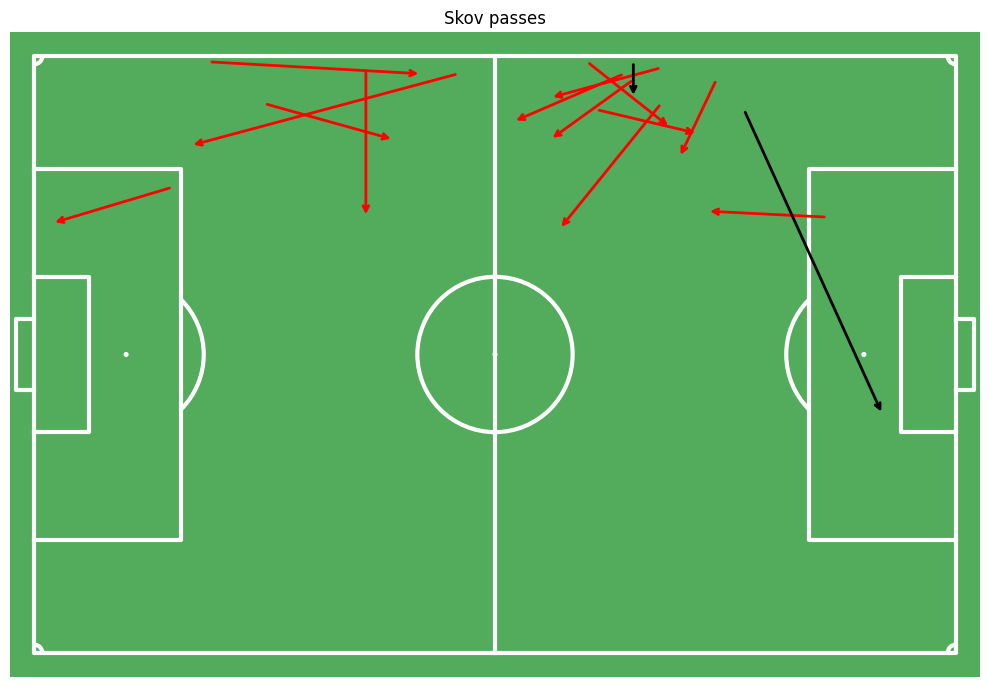

Player: Jelert left passes percentage: 87.5


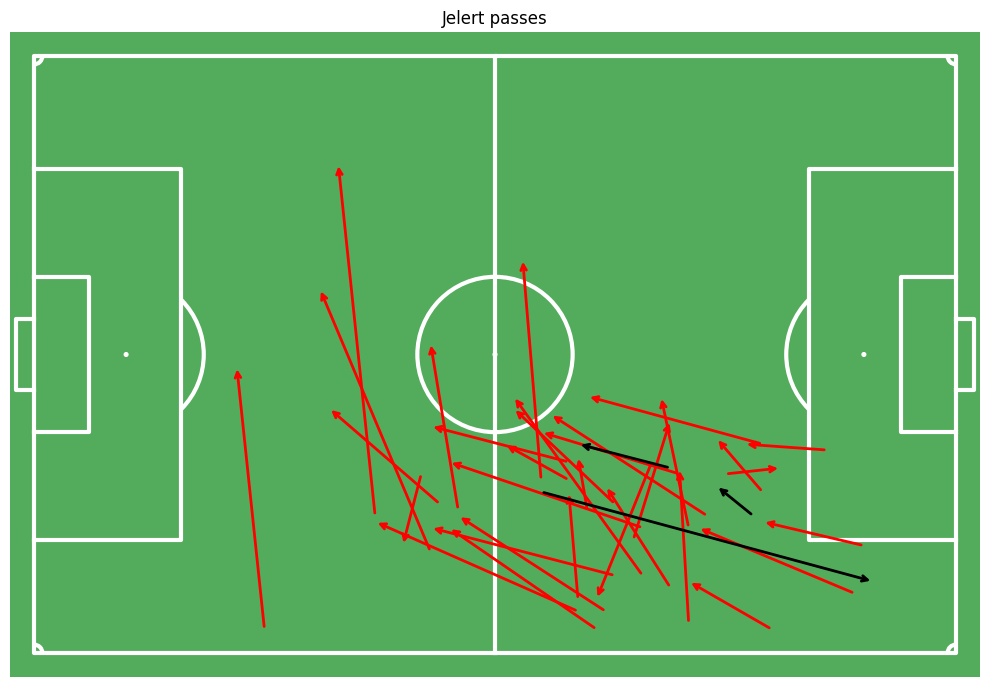

Player: Daramy left passes percentage: 59.183673469387756


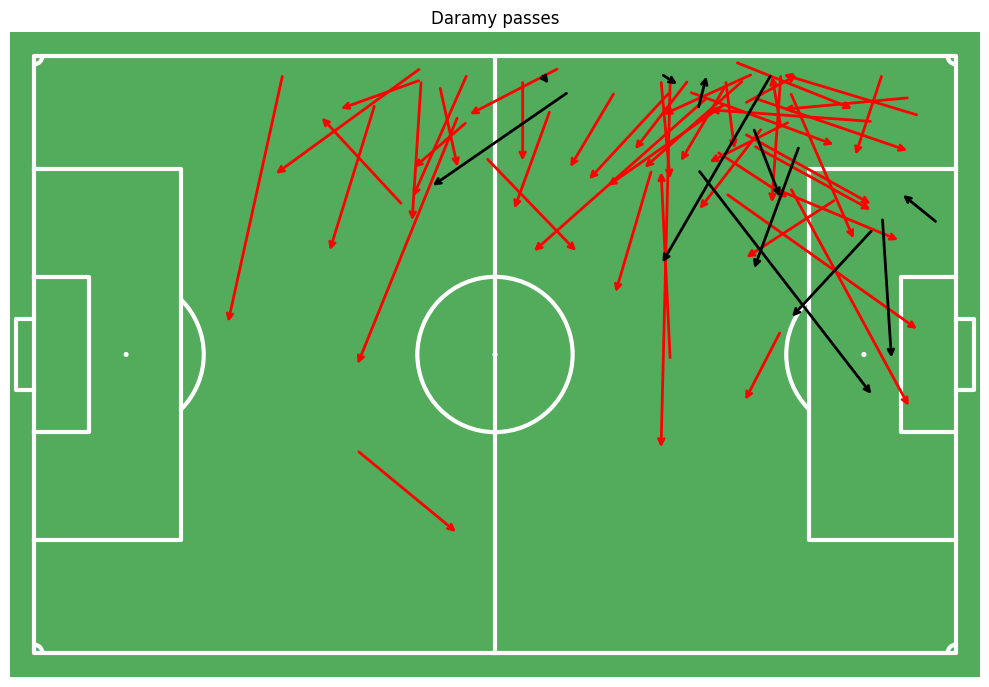

Player: Poulsen left passes percentage: 61.53846153846154


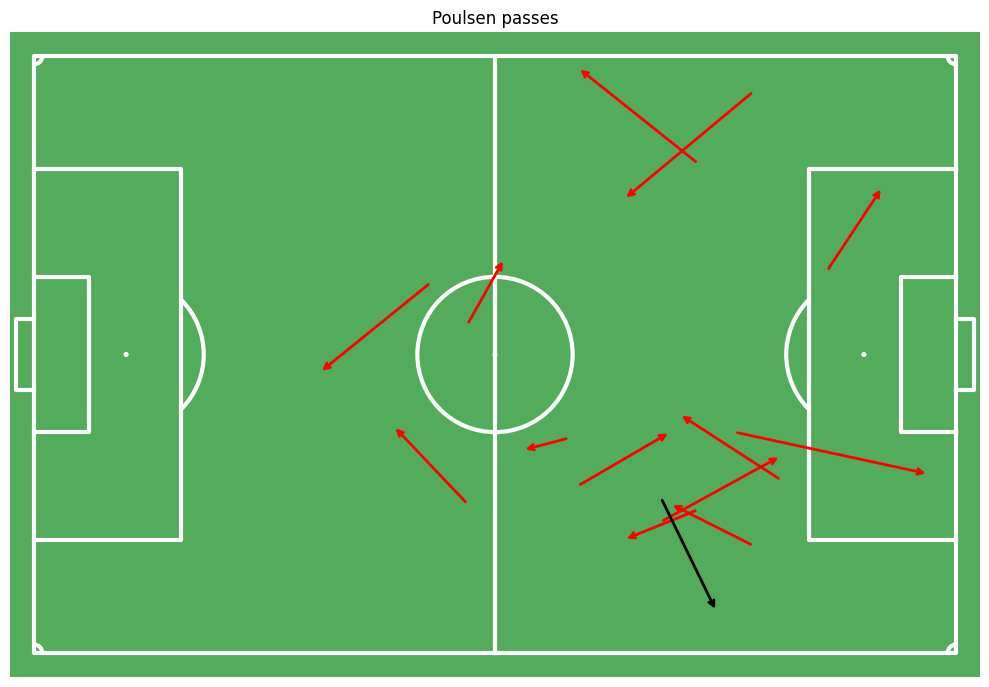

Player: Vestergaard left passes percentage: 54.0


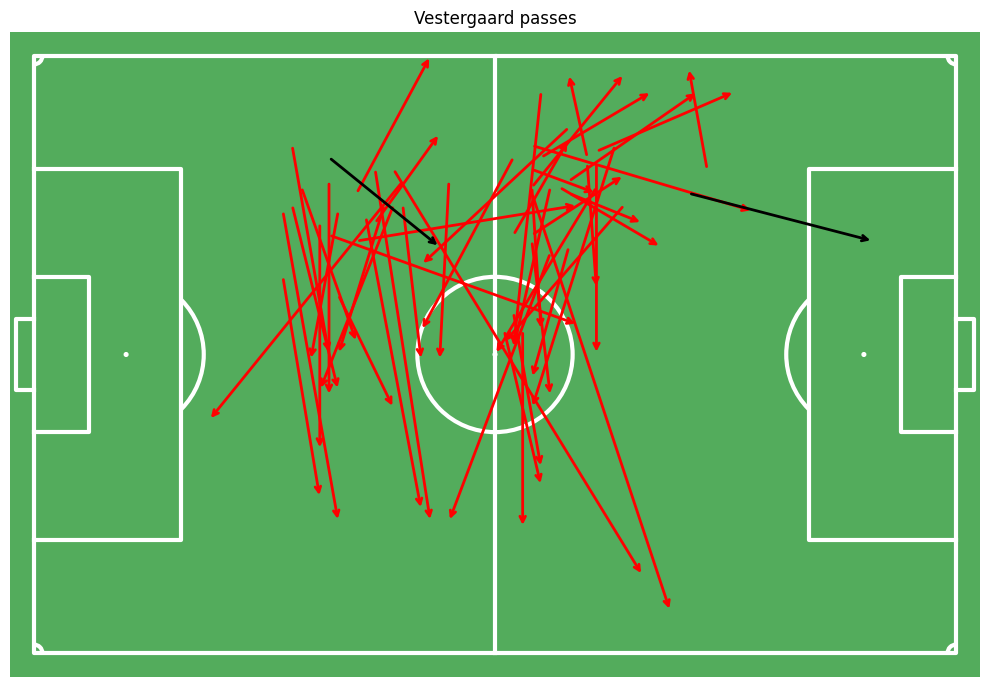

Player: Kristiansen left passes percentage: 68.65671641791045


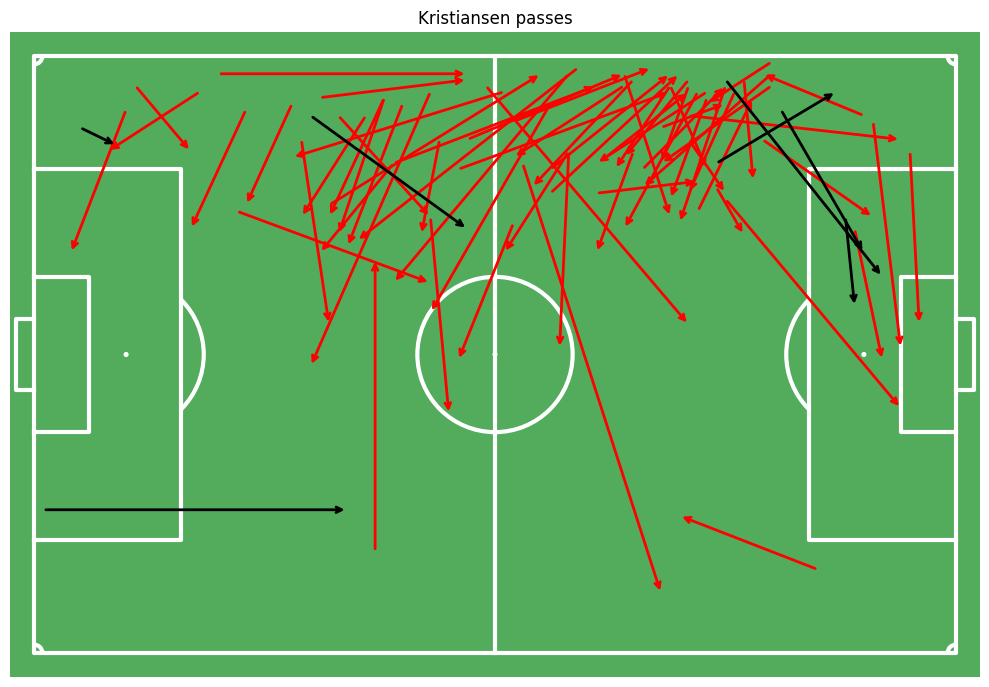

Player: Delaney left passes percentage: 60.0


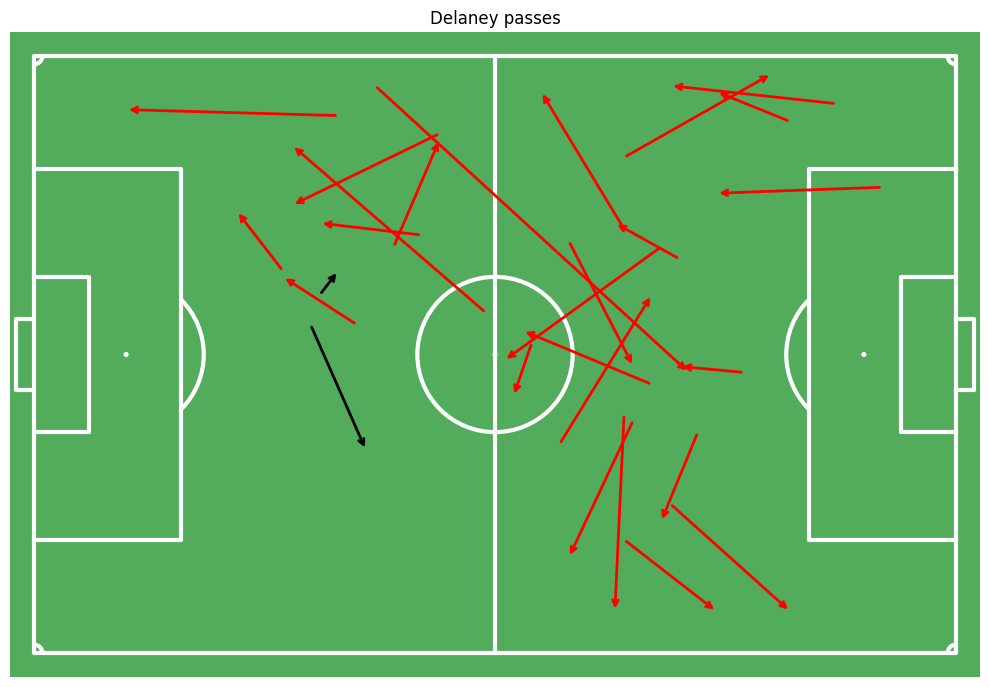

Player: Hjulmand left passes percentage: 65.45454545454545


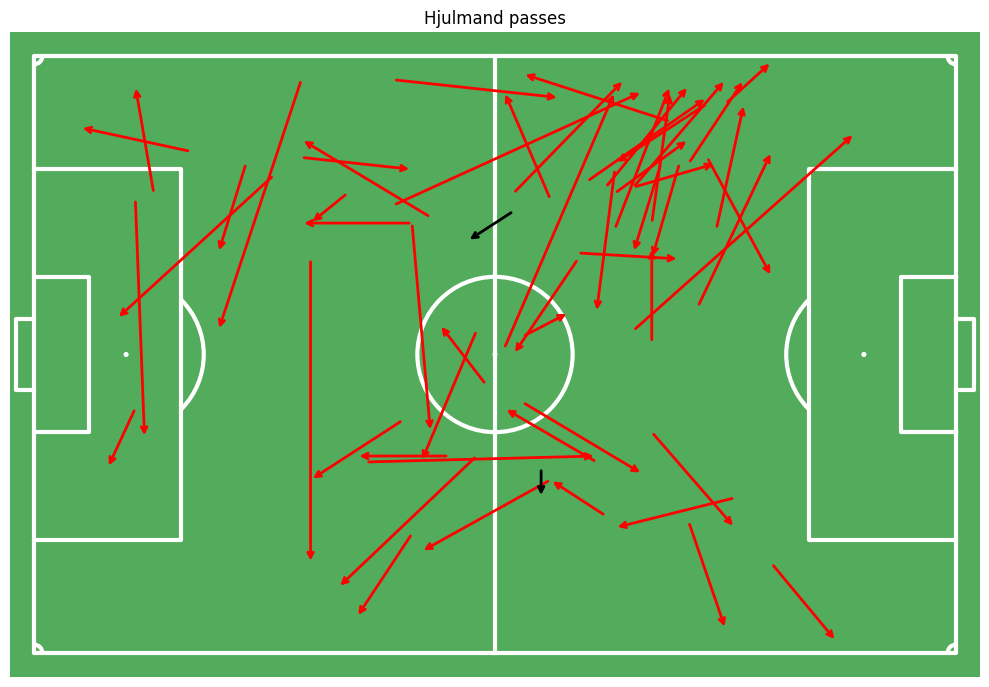

Player: O'Riley left passes percentage: 57.14285714285714


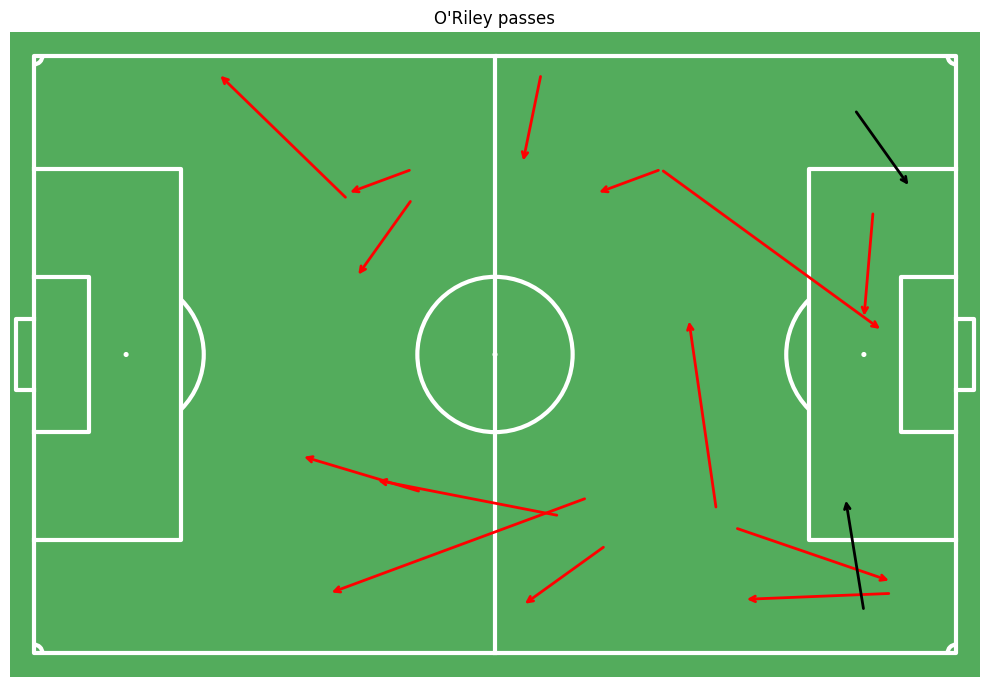

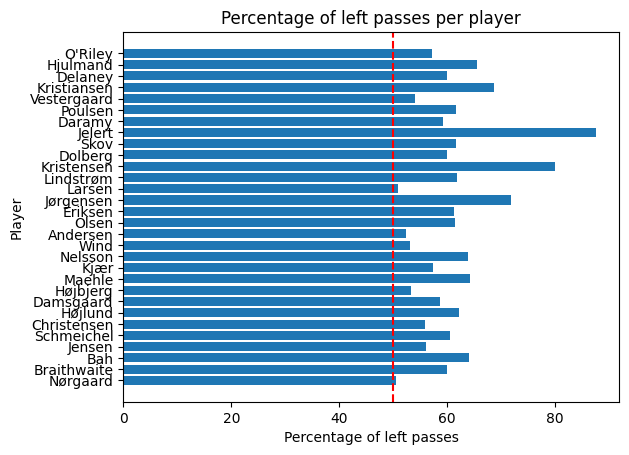

In [153]:
import warnings
warnings.filterwarnings('ignore')
all_team_mates = all_succesfull_passes_df["player.name"].unique()
left_percentage = list()
for player in all_team_mates:


    eriksen_passes_success = all_succesfull_passes_df[all_succesfull_passes_df["player.name"] == player]
    eriksen_passes_failed = all_failed_passes_df[all_failed_passes_df["player.name"] == player]


    #plot the passes of eriksen
    pitch = Pitch(pitch_type='wyscout', goal_type='box', pitch_color='#53ac5c',
                                line_color='white', linewidth=3, corner_arcs=True)
    fig, ax = pitch.draw(figsize=(10, 11))
    plt.title(f"{player} passes")

    for row in eriksen_passes_success.iterrows():
        row = row[1]
        player_name = row["player.name"]
        rec_name = row["pass.recipient.name"]
        x_loc = row["location.x"]
        y_loc = row["location.y"]
        x_end_loc = row["pass.endLocation.x"]
        y_end_loc = row["pass.endLocation.y"]

        pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='red', lw=2), ax=ax, zorder=2)
    for row in eriksen_passes_failed.iterrows():
        row = row[1]
        player_name = row["player.name"]
        rec_name = row["pass.recipient.name"]
        x_loc = row["location.x"]
        y_loc = row["location.y"]
        x_end_loc = row["pass.endLocation.x"]
        y_end_loc = row["pass.endLocation.y"]

        pitch.annotate("", xy=(x_end_loc, y_end_loc), xytext=(x_loc, y_loc), arrowprops=dict(arrowstyle="->", color='black', lw=2), ax=ax, zorder=2)


    eriksen_passes_success["left_or_right"] = eriksen_passes_success["pass.endLocation.y"] - eriksen_passes_success["location.y"]
    eriksen_passes_success["left_or_right"] = np.where(
    eriksen_passes_success["pass.endLocation.x"] - eriksen_passes_success["location.x"] > 0,
    eriksen_passes_success["left_or_right"],
    -1 * eriksen_passes_success["left_or_right"]
)
    eriksen_passes_success["left_or_right"] = eriksen_passes_success["left_or_right"] > 0
    eriksen_passes_success["left_or_right"].value_counts()
    #get percentage of left passes
    print(f'Player: {player} left passes percentage: {eriksen_passes_success["left_or_right"].value_counts()[0] / len(eriksen_passes_success) * 100}')
    left_percentage.append((eriksen_passes_success["left_or_right"].value_counts()[0] / len(eriksen_passes_success) * 100, player))
    plt.show()


#visualize in a barplot the percentage of left passes for each player stored in a tuple
fig, ax = plt.subplots()
ax.barh([x[1] for x in left_percentage], [x[0] for x in left_percentage])
plt.title("Percentage of left passes per player")
plt.ylabel("Player")
plt.xlabel("Percentage of left passes")
#make a red line at 50% to see if the player is more likely to pass left or right
plt.axvline(x=50, color='r', linestyle='--')
plt.show()


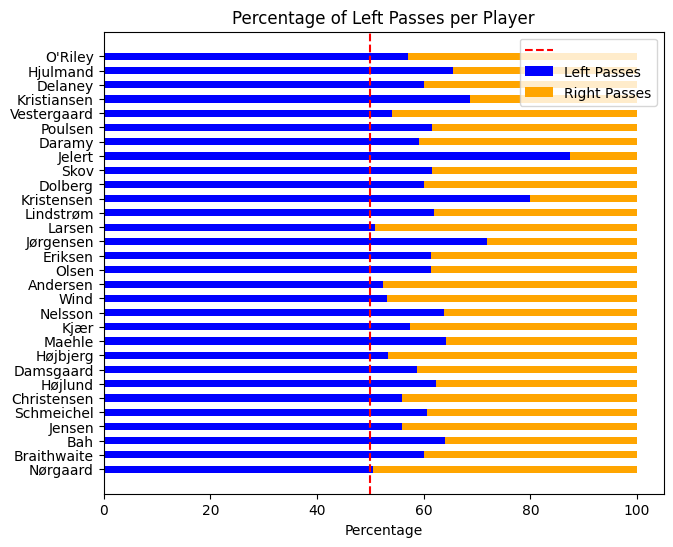

In [161]:
fig, ax = plt.subplots(figsize=(8, 6))

# Create a list of player names and percentages
player_names = [x[1] for x in left_percentage]
percentages = [x[0] for x in left_percentage]

# Create a list of y-positions for the bars
y_pos = np.arange(len(player_names))

# Plot the bars
bars = ax.barh(y_pos, percentages, height=0.5, color='blue', left=0)

# Fill the remaining space with orange bars
for i, p in enumerate(percentages):
    ax.barh(y_pos[i], 100 - p, height=0.5, color='orange', left=p)

# Set the y-ticks to the player names
ax.set_yticks(y_pos)
ax.set_yticklabels(player_names)

# Add labels and title
ax.set_xlabel("Percentage")
ax.set_title("Percentage of Left Passes per Player")

# Add a vertical line at 50%
ax.axvline(x=50, color='r', linestyle='--')

# Adjust the spacing between subplots
plt.subplots_adjust(left=0.2)
plt.legend(['','Left Passes','Right Passes'], loc='upper right')

plt.show()

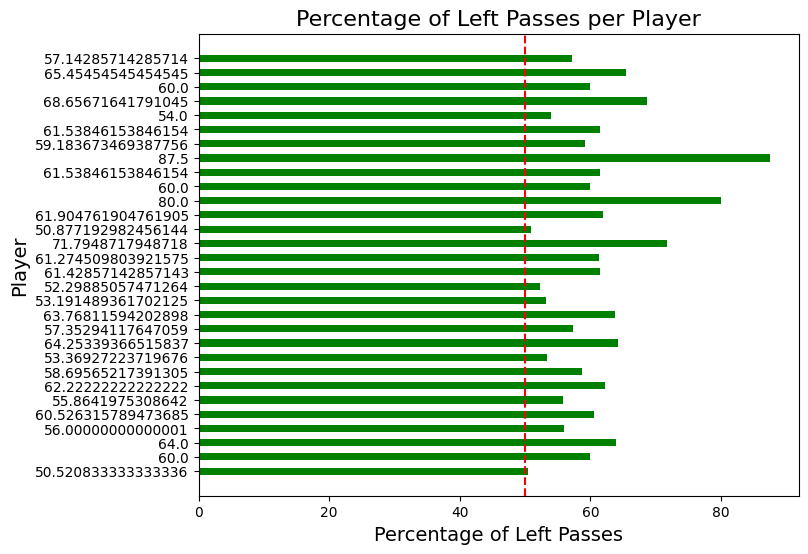

In [157]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.set_yticks(np.arange(len(left_percentage)))
ax.set_yticklabels([player for player, _ in left_percentage])

# Create the bar chart
bar_width = 0.5
for i, (percentage, player) in enumerate(left_percentage):
    if percentage < 50:
        color = 'orange'
    else:
        color = 'green'
    ax.barh(i, percentage, bar_width, color=color, align='center')

# Add a vertical line at 50%
ax.axvline(x=50, color='r', linestyle='--')

# Set the title and axis labels
ax.set_title("Percentage of Left Passes per Player", fontsize=16)
ax.set_xlabel("Percentage of Left Passes", fontsize=14)
ax.set_ylabel("Player", fontsize=14)

# Adjust the spacing between subplots
plt.subplots_adjust(left=0.3)

# Show the plot
plt.show()



In [137]:
eriksen_passes_success["left_or_right"] =eriksen_passes_success["pass.endLocation.y"] - eriksen_passes_success["location.y"]
#make column for left or right passes as a boolean with values >0 as true and <0 as false 
eriksen_passes_success["left_or_right"] = eriksen_passes_success["left_or_right"] > 0
eriksen_passes_success["left_or_right"].value_counts()
#get percentage of left passes
eriksen_passes_success["left_or_right"].value_counts()[0] / len(eriksen_passes_success) * 100



C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\2821938118.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eriksen_passes_success["left_or_right"] =eriksen_passes_success["pass.endLocation.y"] - eriksen_passes_success["location.y"]
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\2821938118.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eriksen_passes_success["left_or_right"] = eriksen_passes_success["left_or_right"] > 0
C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\2821938118.py:6: FutureWa

57.35294117647059

In [134]:
eriksen_passes_success 
#make column for left or right passes as a boolean with values >0 as true and <0 as false 
eriksen_passes_success["left_or_right"] = eriksen_passes_success["left_or_right"] > 0
eriksen_passes_success["left_or_right"].value_counts()


C:\Users\thoma\AppData\Local\Temp\ipykernel_15812\4180289376.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eriksen_passes_success["left_or_right"] = eriksen_passes_success["left_or_right"] > 0


left_or_right
True     117
False     87
Name: count, dtype: int64

In [114]:
eriksen_passes_success

,location.x,location.y,pass.endLocation.x,pass.endLocation.y,player.name,pass.recipient.name,pair_key
623,61.0,5.0,46.0,13.0,Eriksen,Christensen,Christensen_Eriksen
625,54.0,9.0,53.0,25.0,Eriksen,Christensen,Christensen_Eriksen
636,54.0,18.0,36.0,26.0,Eriksen,Christensen,Christensen_Eriksen
664,47.0,41.0,46.0,48.0,Eriksen,Højbjerg,Eriksen_Højbjerg
676,47.0,14.0,37.0,24.0,Eriksen,Kjær,Eriksen_Kjær
...,...,...,...,...,...,...,...
2456,48.0,36.0,33.0,12.0,Eriksen,Andersen,Andersen_Eriksen
2464,74.0,72.0,79.0,93.0,Eriksen,Lindstrøm,Eriksen_Lindstrøm
2466,59.0,96.0,41.0,65.0,Eriksen,Andersen,Andersen_Eriksen
2495,69.0,85.0,68.0,69.0,Eriksen,Nørgaard,Eriksen_Nørgaard


Text(0.5, 0, 'Percentage of failed passes')

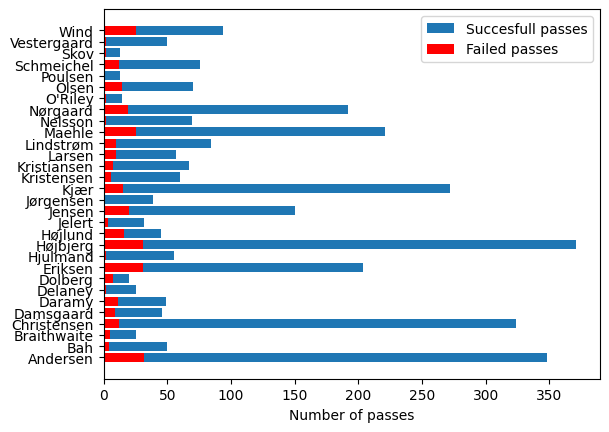

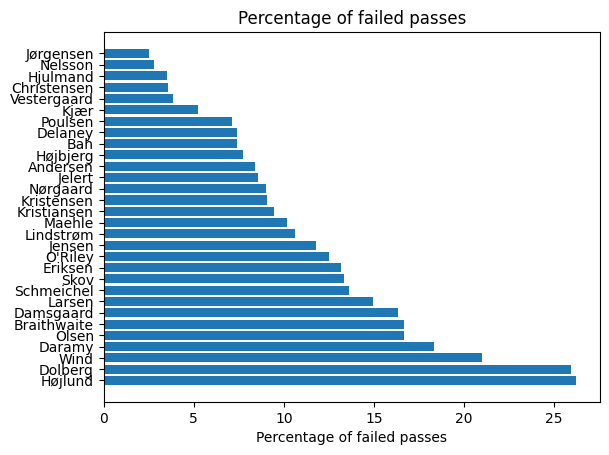

In [106]:
#plot the number of passes per player and show the failed passes in red

fig, ax = plt.subplots()
ax.barh(succesfull_series.index, succesfull_series)
ax.barh(failed_series.index, failed_series, color='red')
plt.xlabel("Number of passes")
plt.legend(["Succesfull passes", "Failed passes"])

#calculate the percentage of failed passes to succesfull passes
percentage_failed = failed_series / (succesfull_series + failed_series) * 100
percentage_failed = percentage_failed.sort_values(ascending=False)
fig, ax = plt.subplots()
ax.barh(percentage_failed.index, percentage_failed)
plt.title("Percentage of failed passes")
plt.xlabel("Percentage of failed passes")


